In [ ]:
!unzip "/content/drive/MyDrive/home.zip"

Archive:  /content/drive/MyDrive/home.zip
   creating: home/
   creating: home/home/
   creating: home/home/ACRNet/
   creating: home/home/ACRNet/.git/
  inflating: home/home/ACRNet/.git/config  
  inflating: home/home/ACRNet/.git/description  
  inflating: home/home/ACRNet/.git/HEAD  
   creating: home/home/ACRNet/.git/hooks/
  inflating: home/home/ACRNet/.git/hooks/applypatch-msg.sample  
  inflating: home/home/ACRNet/.git/hooks/commit-msg.sample  
  inflating: home/home/ACRNet/.git/hooks/fsmonitor-watchman.sample  
  inflating: home/home/ACRNet/.git/hooks/post-update.sample  
  inflating: home/home/ACRNet/.git/hooks/pre-applypatch.sample  
  inflating: home/home/ACRNet/.git/hooks/pre-commit.sample  
  inflating: home/home/ACRNet/.git/hooks/pre-merge-commit.sample  
  inflating: home/home/ACRNet/.git/hooks/pre-push.sample  
  inflating: home/home/ACRNet/.git/hooks/pre-rebase.sample  
  inflating: home/home/ACRNet/.git/hooks/pre-receive.sample  
  inflating: home/home/ACRNet/.git/hook

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import scipy.io as sio
from scipy.io import savemat
import numpy as np
import math
import random
import time
import matplotlib.pyplot as plt
from itertools import cycle
import itertools as it
from pathlib import Path
import os


In [ ]:
from datetime import datetime
import sys
import traceback

DEBUG = -1
INFO = 0
EMPH = 1
WARNING = 2
ERROR = 3
FATAL = 4

log_level = INFO
line_seg = ''.join(['*'] * 65)


class LoggerFatalError(SystemExit):
    pass


def _format(level, messages):
    timestr = datetime.strftime(datetime.now(), '%m.%d/%H:%M')
    father = traceback.extract_stack()[-4]
    func_info = f'{father[0].split("/")[-1]}:{str(father[1]).ljust(4, " ")}'
    m = ' '.join(map(str, messages))
    msg = f'{level} {timestr} {func_info}] {m}'
    return msg


_log_file = None
_log_buffer = []
_RED = '\033[0;31m'
_GREEN = '\033[1;32m'
_LIGHT_RED = '\033[1;31m'
_ORANGE = '\033[0;33m'
_YELLOW = '\033[1;33m'
_NC = '\033[0m'  # No Color


def set_file(fname):
    global _log_file
    global _log_buffer
    if _log_file is not None:
        warning("Change log file to %s" % fname)
        _log_file.close()
    _log_file = open(fname, 'w')
    if len(_log_buffer):
        for s in _log_buffer:
            _log_file.write(s)
        _log_file.flush()


def debug(*messages, file=None):
    if log_level > DEBUG:
        return
    msg = _format('D', messages)

    if file is None:
        sys.stdout.write(_YELLOW + msg + _NC + '\n')
        sys.stdout.flush()
    else:
        with open(file, 'a+') as f:
            print(msg, file=f)


def info(*messages, file=None):
    if log_level > INFO:
        return
    msg = _format('I', messages)
    if file is None:
        sys.stdout.write(msg + '\n')
        sys.stdout.flush()
    else:
        with open(file, 'a+') as f:
            print(msg, file=f)


def emph(*messages, file=None):
    if log_level > EMPH:
        return
    msg = _format('EM', messages)
    if file is None:
        sys.stdout.write(_GREEN + msg + _NC + '\n')
        sys.stdout.flush()
    else:
        with open(file, 'a+') as f:
            print(msg, file=f)


def warning(*messages, file=None):
    if log_level > WARNING:
        return
    msg = _format('W', messages)
    if file is None:
        sys.stderr.write(_ORANGE + msg + _NC + '\n')
        sys.stderr.flush()
    else:
        with open(file, 'a+') as f:
            print(msg, file=f)


def error(*messages, file=None):
    if log_level > ERROR:
        return
    msg = _format('E', messages)
    if file is None:
        sys.stderr.write(_RED + msg + _NC + '\n')
        sys.stderr.flush()
    else:
        with open(file, 'a+') as f:
            print(msg, file=f)


def fatal(*messages, file=None):
    if log_level > FATAL:
        return
    msg = _format('F', messages)
    if file is None:
        sys.stderr.write(_LIGHT_RED + msg + _NC + '\n')
        sys.stderr.flush()
    else:
        with open(file, 'a+') as f:
            print(msg, file=f)

    raise LoggerFatalError(-1)


In [ ]:
noise='noisy_codeword'

In [ ]:
torch.manual_seed(0)

In [ ]:
from zmq import OUT_BATCH_SIZE
from torch import nn
from collections import OrderedDict

#from utils import logger


__all__ = ["acrnet"]


class ConvBN(nn.Sequential):
    def __init__(self, in_planes, out_planes, kernel_size, stride=1, groups=1):
        if not isinstance(kernel_size, int):
            padding = [(i - 1) // 2 for i in kernel_size]
        else:
            padding = (kernel_size - 1) // 2
        super(ConvBN, self).__init__(OrderedDict([
            ('conv', nn.Conv2d(in_channels=in_planes,
                               out_channels=out_planes,
                               kernel_size=kernel_size,
                               stride=stride,
                               padding=padding,
                               groups=groups,
                               bias=False)),
            ('bn', nn.BatchNorm2d(out_planes))
        ]))


class ACRDecoderBlock(nn.Module):
    r""" Inverted residual with extensible width and group conv
    """
    def __init__(self, expansion):
        super(ACRDecoderBlock, self).__init__()
        width = 8 * expansion
        self.conv1_bn = ConvBN(2, width, [1, 9])
        self.prelu1 = nn.PReLU(num_parameters=width, init=0.3)
        self.conv2_bn = ConvBN(width, width, 7, groups=4 * expansion)
        self.prelu2 = nn.PReLU(num_parameters=width, init=0.3)
        self.conv3_bn = ConvBN(width, 2, [9, 1])
        self.prelu3 = nn.PReLU(num_parameters=2, init=0.3)
        self.identity = nn.Identity()

    def forward(self, x):
        identity = self.identity(x)

        residual = self.prelu1(self.conv1_bn(x))
        residual = self.prelu2(self.conv2_bn(residual))
        residual = self.conv3_bn(residual)

        return self.prelu3(identity + residual)


class ACREncoderBlock(nn.Module):
    def __init__(self):
        super(ACREncoderBlock, self).__init__()
        self.conv_bn1 = ConvBN(2, 2, [1, 9])
        self.prelu1 = nn.PReLU(num_parameters=2, init=0.3)
        self.conv_bn2 = ConvBN(2, 2, [9, 1])
        self.prelu2 = nn.PReLU(num_parameters=2, init=0.3)
        self.identity = nn.Identity()

    def forward(self, x):
        identity = self.identity(x)

        residual = self.prelu1(self.conv_bn1(x))
        residual = self.conv_bn2(residual)

        return self.prelu2(identity + residual)


class ACRNet(nn.Module):
    def __init__(self,
                 in_channels=2,
                 reduction=4
                 , expansion=1):
        super(ACRNet, self).__init__()
        info(f"=> Model ACRNet with reduction={reduction}")
        total_size, w, h = 2048, 32, 32

        self.encoder_feature = nn.Sequential(OrderedDict([
            ("conv5x5_bn", ConvBN(in_channels, 2, 5)),
            ("prelu", nn.PReLU(num_parameters=2, init=0.3)),
            ("ACREncoderBlock1", ACREncoderBlock()),
            ("ACREncoderBlock2", ACREncoderBlock()),
        ]))
        self.encoder_fc = nn.Linear(total_size, total_size // reduction)
        #self.add_noise()
        self.batchnorm  = nn.BatchNorm1d(num_features=total_size // reduction)
        self.fully_connect_layer=nn.Linear(total_size // reduction,1024)
        self.sigmoid_sparse=nn.Sigmoid()
        self.fully_connect_layer_2=nn.Linear(1024,512)

        self.decoder_fc = nn.Linear(total_size // reduction, total_size)
        self.decoder_feature = nn.Sequential(OrderedDict([
            ("conv5x5_bn", ConvBN(2, in_channels, 5)),
            ("prelu", nn.PReLU(num_parameters=2, init=0.3)),
            ("ACRDecoderBlock1", ACRDecoderBlock(expansion=expansion)),
            ("ACRDecoderBlock2", ACRDecoderBlock(expansion=expansion)),
            ("sigmoid", nn.Sigmoid())
        ]))

        for m in self.modules():
            if isinstance(m, (nn.Conv2d, nn.Linear)):
                nn.init.xavier_uniform_(m.weight)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)


    def add_noise(self,x):
     noise = x+torch.randn_like(x)
     #noise = torch.clip(noise,0.,1.)
     return noise

    def forward(self, x):
        n, c, h, w = x.detach().size()

        out = self.encoder_feature(x)
        out = self.encoder_fc(out.view(n, -1))
        #out=out +torch.randn(out.size())
        #adding nosie to code word
        out_skip=self.add_noise(out)
        #batch normalization
        out=self.batchnorm(out_skip)
        #fully connect layer
        out=self.fully_connect_layer(out)
        # activation function
        out=self.sigmoid_sparse(out)
        out.to_sparse_csr()
        #fully connected layer
        out=self.fully_connect_layer_2(out)
        out=out-out_skip
        out = self.decoder_fc(out)
        out = self.decoder_feature(out.view(n, c, h, w))

        return out


def acrnet(reduction=4,expansion=1):
    r""" Create an ACRNet architecture.
    """
    model = ACRNet(reduction=reduction,expansion=expansion)
    return model


In [ ]:
class RefineNet(nn.Module):
    def __init__(self, img_channels=2):
        super(RefineNet, self).__init__()

        self.conv = nn.Sequential(nn.Conv2d(img_channels, 8, kernel_size=(3, 3), padding=(1,1)),
                                  nn.BatchNorm2d(8, eps=1e-03, momentum=0.99),
                                  nn.LeakyReLU(negative_slope=0.3),
                                  nn.Conv2d(8, 16, kernel_size=(3, 3), padding=(1,1)),
                                  nn.BatchNorm2d(16, eps=1e-03, momentum=0.99),
                                  nn.LeakyReLU(negative_slope=0.3),
                                  nn.Conv2d(16, 2, kernel_size=(3, 3), padding=(1,1)),
                                  nn.BatchNorm2d(2, eps=1e-03, momentum=0.99))

        self.leakyRelu = nn.LeakyReLU(negative_slope=0.3)

    def forward(self, x):
        ori_x = x.clone()

        # concatenate
        x = self.conv(x) + ori_x

        return self.leakyRelu(x)


class CsiNet(nn.Module):
    def __init__(self, img_height=32, img_width=32, img_channels=2, residual_num=2, encoded_dim=512):
        super(CsiNet, self).__init__()

        img_total = img_height * img_width * img_channels

        self.conv1 = nn.Sequential(nn.Conv2d(img_channels, 2, kernel_size=(3, 3), padding=(1,1)),
                                   nn.BatchNorm2d(2, eps=1e-03, momentum=0.99),
                                   nn.LeakyReLU(negative_slope=0.3))

        self.dense = nn.Sequential(nn.Linear(img_total, encoded_dim),
                                   nn.Tanh(),
                                   #nn.Sigmoid(),
                                   nn.Linear(encoded_dim, img_total))

        self.decoder = nn.ModuleList([RefineNet(img_channels)
                                      for _ in range(residual_num)])

        self.conv2 = nn.Sequential(nn.Conv2d(img_channels, 2, kernel_size=(3, 3), padding=(1,1)),
                                   nn.Sigmoid())

    def forward(self, x):
        batch_size, channels, height, width = x.size()

        # Encoder, convolution & reshape
        x = self.conv1(x)
        x = x.contiguous().view(batch_size, channels * height * width)

        # Dense & reshape
        x = self.dense(x)
        x = x.contiguous().view(batch_size, channels, height, width)

        # Residual decoders
        for layer in self.decoder:
            x = layer(x)

        # Final convolution
        x = self.conv2(x)

        # x = self.Encoder(x)
        # x = self.Decoder(x)

        return x

In [ ]:
envir = 'indoor'  # 'indoor' or 'outdoor'
# image params
img_height = 32
img_width = 32
img_channels = 2
img_total = img_height * img_width * img_channels
# network params
residual_num = 2
encoded_dim = 512  # compress rate=1/4->dim.=512, compress rate=1/16->dim.=128, compress rate=1/32->dim.=64, compress rate=1/64->dim.=32
# Data loading
if envir == 'indoor':
    mat = sio.loadmat('/content/home/home/cost2100/DATA_Htrainin.mat')
    x_train = mat['HT']  # array
    mat = sio.loadmat('/content/home/home/cost2100/DATA_Hvalin.mat')
    x_val = mat['HT']  # array
    mat = sio.loadmat('/content/home/home/cost2100/DATA_Htestin.mat')
    x_test = mat['HT']  # array
    mat = sio.loadmat('/content/home/home/cost2100/DATA_HtestFin_all.mat')
    X_test = mat['HF_all']  # array

elif envir == 'outdoor':
    mat = sio.loadmat('/content/home/home/cost2100/DATA_Htrainout.mat')
    x_train = mat['HT']  # array
    mat = sio.loadmat('/content/home/home/cost2100/DATA_Hvalout.mat')
    x_val = mat['HT']  # array
    mat = sio.loadmat('/content/home/home/cost2100/DATA_Htestout.mat')
    x_test = mat['HT']  # array
    mat = sio.loadmat('/content/home/home/cost2100/DATA_HtestFout_all.mat')
    X_test = mat['HF_all']  # array

In [ ]:
x_train = x_train.astype('float32')
x_val = x_val.astype('float32')
x_test = x_test.astype('float32')
X_test = X_test.astype('float32')

<ipython-input-9-a92e17f4a55e>:4: ComplexWarning: Casting complex values to real discards the imaginary part
  X_test = X_test.astype('float32')


In [ ]:
x_train_length = len(x_train)
print(len(x_train))
print(x_train.shape)
x_val_length = len(x_val)
print(len(x_val))
print(x_val.shape)
x_test_length = len(x_test)
print(len(x_test))
print(x_test.shape)
print(len(X_test))
print(X_test.shape)

100000
(100000, 2048)
30000
(30000, 2048)
20000
(20000, 2048)
20000
(20000, 4000)


In [ ]:
x_train = np.reshape(x_train, (x_train_length, img_channels, img_height, img_width))  # adapt this if using `channels_first` image data format
x_val = np.reshape(x_val, (x_val_length, img_channels, img_height, img_width))  # adapt this if using `channels_first` image data format
x_test = np.reshape(x_test, (x_test_length, img_channels, img_height, img_width))  # adapt this if using `channels_first` image data format

In [ ]:
x_train.shape

(100000, 2, 32, 32)

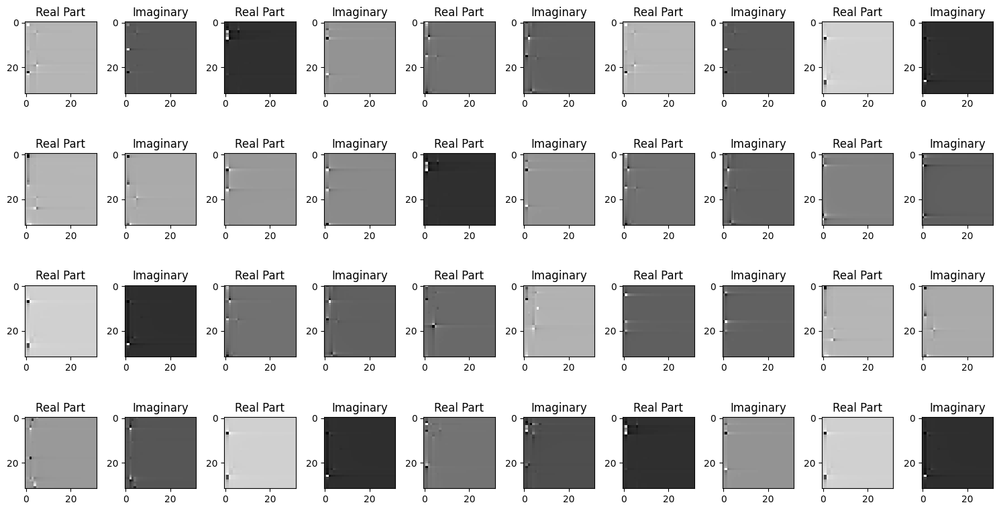

In [ ]:
fig, axs = plt.subplots(4, 10, figsize=(15,8))
img_batch=x_train[200:220,:,:,:]

for i in range(0,10,2):
  for j in range(0,4):
    CSI_img = random.choice(img_batch)
    axs[j,i].imshow(np.array(CSI_img[0,:,:]), cmap='gist_gray')
    axs[j,i+1].imshow(np.array(CSI_img[1,:,:]), cmap='gist_gray')
    axs[j,i].set_title('Real Part')
    axs[j,i+1].set_title('Imaginary')
plt.tight_layout()

In [ ]:
x_train = torch.tensor(x_train)
x_val = torch.tensor(x_val)
x_test = torch.tensor(x_test)
X_test = torch.tensor(X_test)

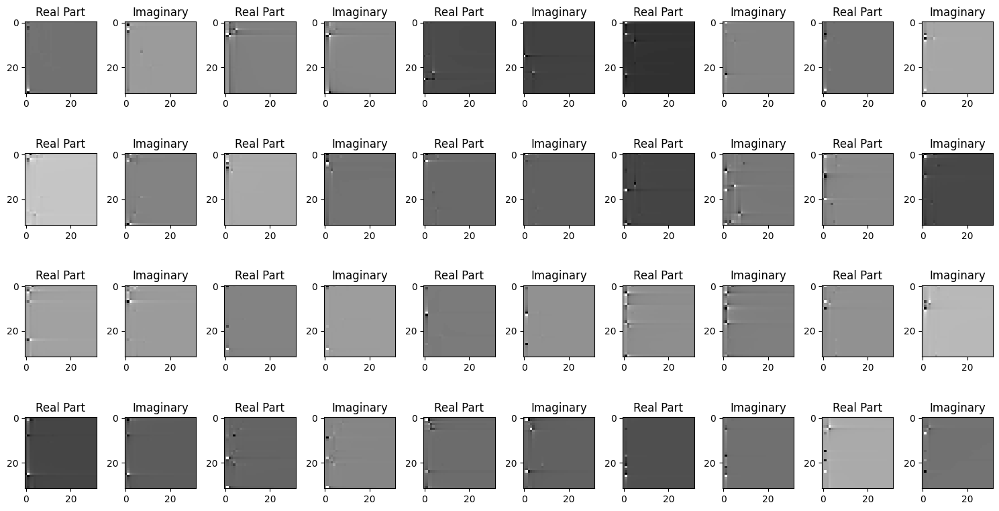

In [ ]:
fig, axs = plt.subplots(4, 10, figsize=(15,8))
for i in range(0,10,2):
  for j in range(0,4):
    CSI_img = random.choice(x_train)
    axs[j,i].imshow(np.array(CSI_img[0,:,:]), cmap='gist_gray')
    axs[j,i+1].imshow(np.array(CSI_img[1,:,:]), cmap='gist_gray')
    axs[j,i].set_title('Real Part')
    axs[j,i+1].set_title('Imaginary')
plt.tight_layout()

In [ ]:
# device
device = torch.device('cuda' if torch.cuda.is_available else 'cpu')
print(device)
x_train = x_train.to(device)
x_val = x_val.to(device)
x_test = x_test.to(device)
noise=torch.randn((1,512)).to(device)


cuda


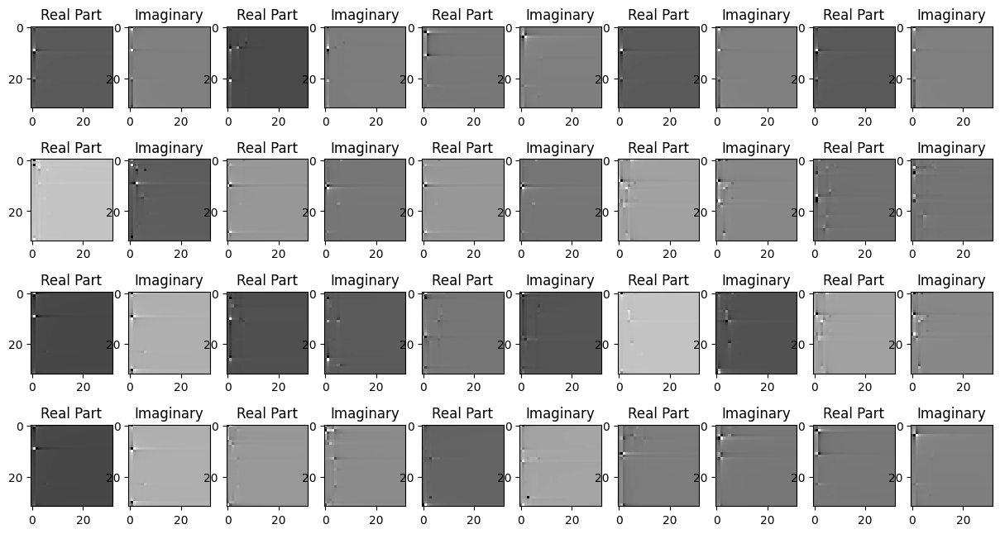

In [ ]:
x_val_batch=x_val[0:20,:,:,:]
fig, axs = plt.subplots(4, 10, figsize=(15,8))
for i in range(0,10,2):
  for j in range(0,4):
    CSI_img = random.choice(x_val_batch.cpu())
    #print(CSI_img.shape)
    axs[j,i].imshow(np.array(CSI_img[0,:,:]), cmap='gist_gray')
    axs[j,i+1].imshow(np.array(CSI_img[1,:,:]), cmap='gist_gray')
    axs[j,i].set_title('Real Part')
    axs[j,i+1].set_title('Imaginary')
plt.show()

In [ ]:
# model
model = acrnet(reduction=4, expansion=1).to(device)
#print(model)

I 07.15/13:33 <ipython-input-6-c7e33da91a25>:142 ] => Model ACRNet with reduction=4


torch.Size([5, 2, 32, 32])


<ipython-input-6-c7e33da91a25>:129: UserWarning: Sparse CSR tensor support is in beta state. If you miss a functionality in the sparse tensor support, please submit a feature request to https://github.com/pytorch/pytorch/issues. (Triggered internally at ../aten/src/ATen/SparseCsrTensorImpl.cpp:54.)
  out.to_sparse_csr()


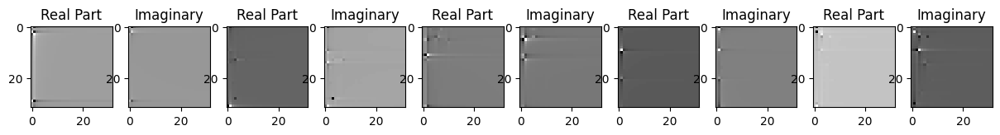

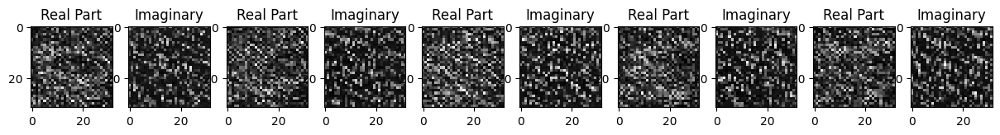

In [ ]:
import itertools as it
with torch.no_grad():
  input=x_val[0:5,:,:,:]
  print(input.shape)
  model.eval()
  out = model(input)
  CSI_img_ = out.cpu()

  fig, axs = plt.subplots(1, 10, figsize=(15,8))
  for j, l in it.zip_longest(range(0, 5), range(1, 10,2)):
    in_img=input[j,0,:,:].cpu()
    axs[j*2].imshow(np.array(in_img.squeeze(0)), cmap='gist_gray')
    axs[j*2].set_title('Real Part')
    in_img=input[j,1,:,:].cpu()
    axs[l].imshow(np.array(in_img.squeeze(0)), cmap='gist_gray')
    axs[l].set_title('Imaginary')

  fig, axs = plt.subplots(1, 10, figsize=(15,8))
  for i, x in it.zip_longest(range(0, 5), range(1, 10,2)):

    #print(i)
    #CSI_img = random.choice(CSI_img_.cpu())
    img=CSI_img_[i,0,:,:]
    axs[i*2].imshow(np.array(img.squeeze(0)), cmap='gist_gray')
    axs[i*2].set_title('Real Part')
    img=CSI_img_[i,1,:,:]
    axs[x].imshow(np.array(img.squeeze(0)), cmap='gist_gray')
    axs[x].set_title('Imaginary')





  plt.show()

In [ ]:
optimizer = optim.Adam(model.parameters(), lr=0.001, eps=1e-07)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=100, gamma=0.9)

In [ ]:
# loss function
criterion = nn.MSELoss()

n_epochs = 1000
batch_size = 200
total_batches = int(x_train_length/batch_size)

tStart = time.time()

train_loss_history = []
val_loss_history = []

In [ ]:
if os.path.exists('/content/drive/MyDrive/_model_1100_new.pth'):
  checkpoint = torch.load('/content/drive/MyDrive/_model_1100_new.pth',map_location=torch.device('cuda'))
  model.load_state_dict(checkpoint)

In [ ]:
checkpoint = torch.load('/content/drive/MyDrive/_model_1000_new.pth')
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
start_epoch = checkpoint['epoch']

Epoch-1 lr: 0.001
Loss:  5.824481377203483e-06
torch.Size([5, 2, 32, 32])


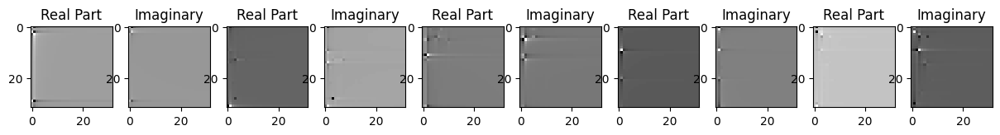

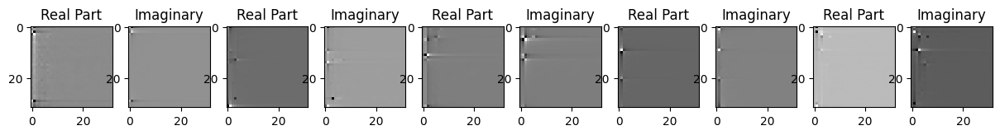

Saving model to: /content/drive/MyDrive/saved_model/_model_0_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.73060776665893
Correlation is  0.754800021648407
Epoch-2 lr: 0.001
Loss:  6.047083843441214e-06
torch.Size([5, 2, 32, 32])


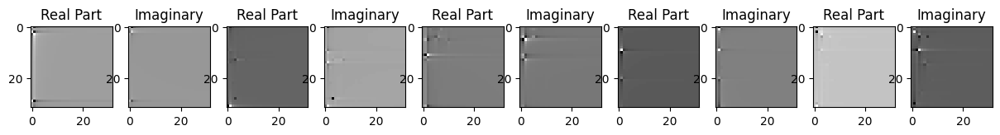

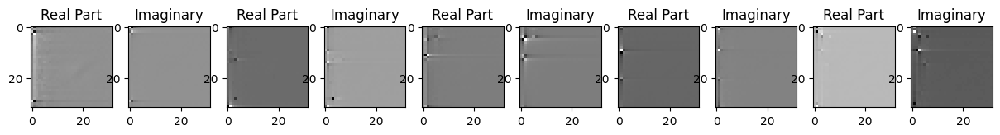

Saving model to: /content/drive/MyDrive/saved_model/_model_1_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.544859920173373
Correlation is  0.7543084621429443
Epoch-3 lr: 0.001
Loss:  5.999991572025465e-06
torch.Size([5, 2, 32, 32])


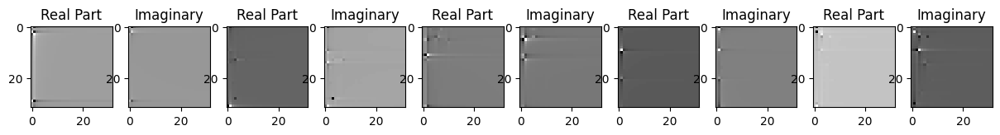

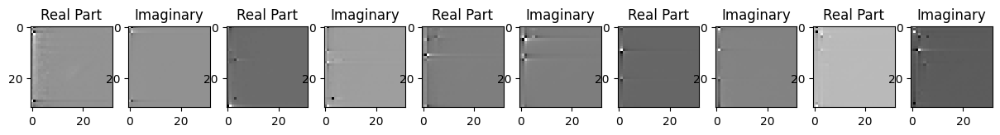

Saving model to: /content/drive/MyDrive/saved_model/_model_2_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.58088188972644
Correlation is  0.7543174028396606
Epoch-4 lr: 0.001
Loss:  6.0709912759193685e-06
torch.Size([5, 2, 32, 32])


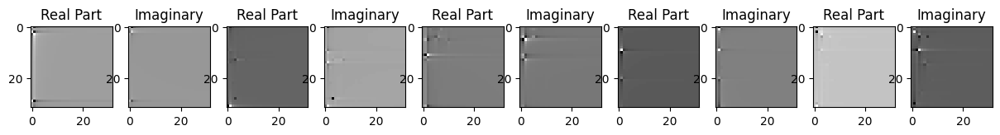

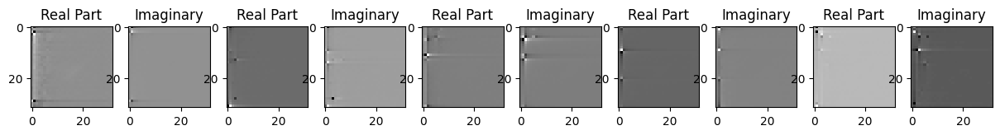

Saving model to: /content/drive/MyDrive/saved_model/_model_3_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.51987438843461
Correlation is  0.7541346549987793
Epoch-5 lr: 0.001
Loss:  5.909898391109891e-06
torch.Size([5, 2, 32, 32])


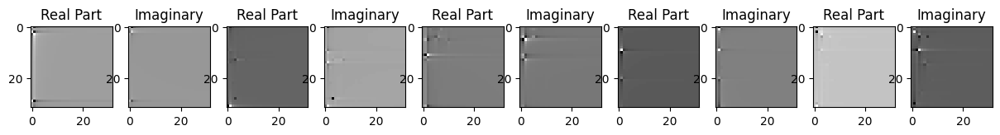

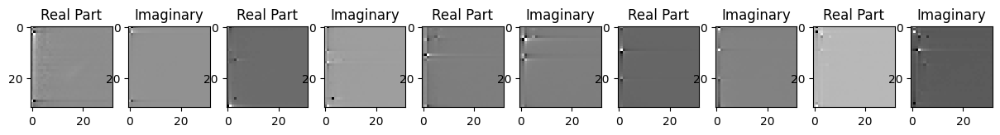

Saving model to: /content/drive/MyDrive/saved_model/_model_4_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.648646787735196
Correlation is  0.7545331120491028
Epoch-6 lr: 0.001
Loss:  5.89982755627716e-06
torch.Size([5, 2, 32, 32])


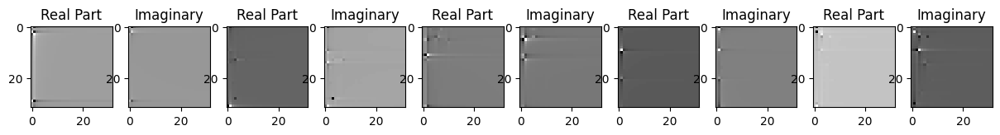

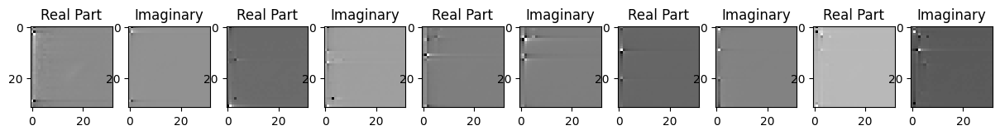

Saving model to: /content/drive/MyDrive/saved_model/_model_5_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.655445056554502
Correlation is  0.7546650171279907
Epoch-7 lr: 0.001
Loss:  5.856124516867567e-06
torch.Size([5, 2, 32, 32])


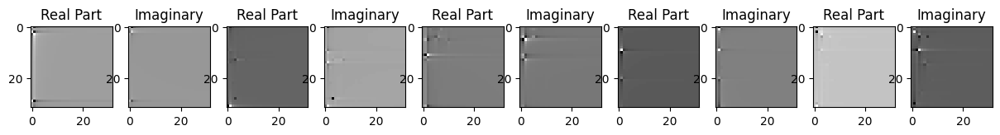

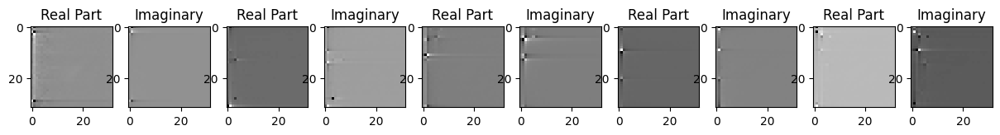

Saving model to: /content/drive/MyDrive/saved_model/_model_6_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.689997188572633
Correlation is  0.75469970703125
Epoch-8 lr: 0.001
Loss:  5.855542440258432e-06
torch.Size([5, 2, 32, 32])


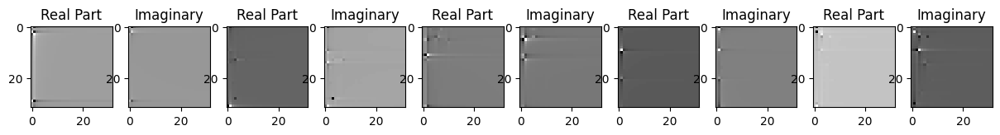

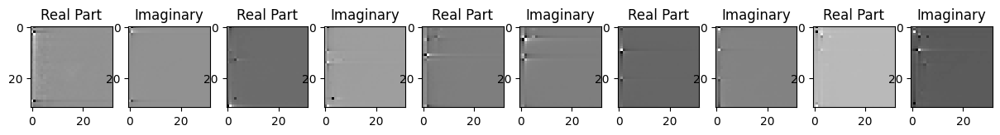

Saving model to: /content/drive/MyDrive/saved_model/_model_7_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.688717627672236
Correlation is  0.7546429634094238
Epoch-9 lr: 0.001
Loss:  5.871411303814966e-06
torch.Size([5, 2, 32, 32])


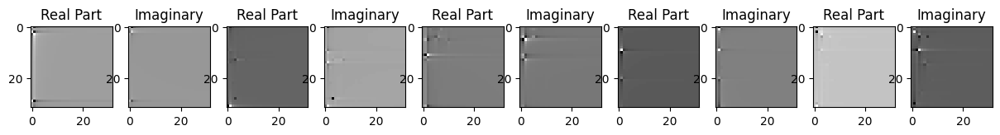

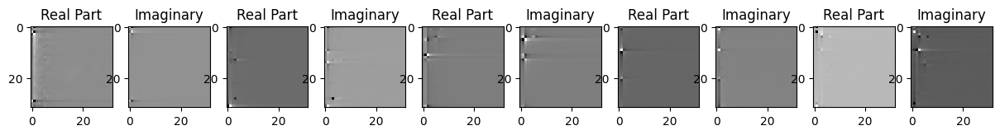

Saving model to: /content/drive/MyDrive/saved_model/_model_8_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.672782257057882
Correlation is  0.7544951438903809
Epoch-10 lr: 0.001
Loss:  5.9451763263496105e-06
torch.Size([5, 2, 32, 32])


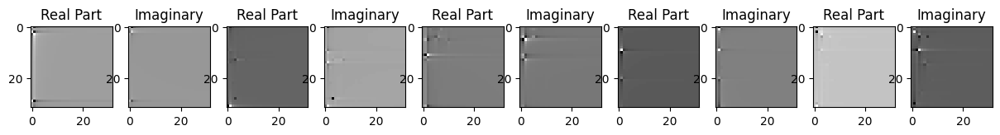

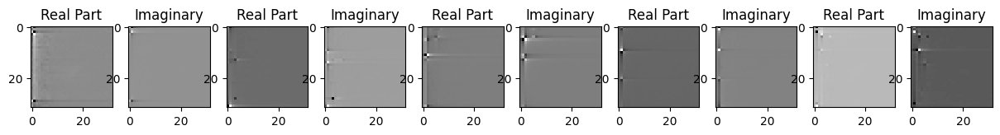

Saving model to: /content/drive/MyDrive/saved_model/_model_9_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.609207139020832
Correlation is  0.7542526721954346
Epoch-11 lr: 0.001
Loss:  6.062354714231333e-06
torch.Size([5, 2, 32, 32])


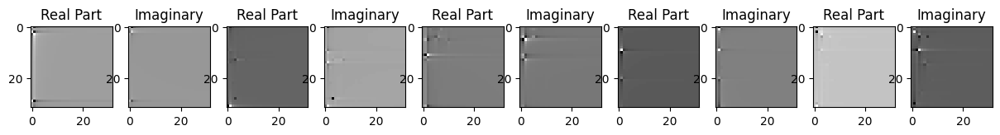

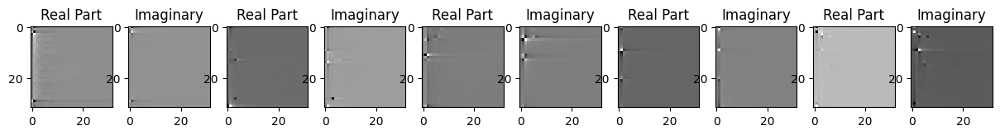

Saving model to: /content/drive/MyDrive/saved_model/_model_10_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.50877159118248
Correlation is  0.7539883255958557
Epoch-12 lr: 0.001
Loss:  5.97189773543505e-06
torch.Size([5, 2, 32, 32])


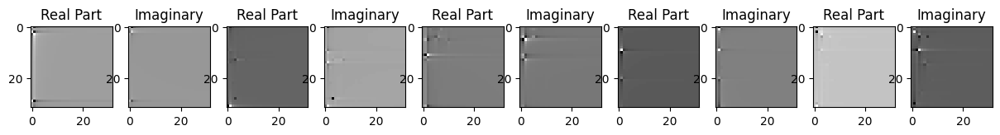

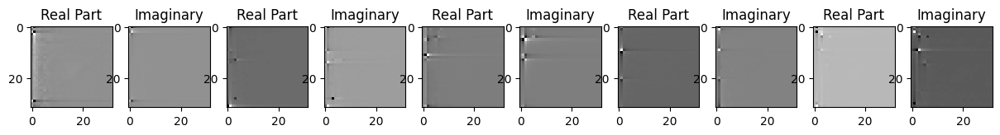

Saving model to: /content/drive/MyDrive/saved_model/_model_11_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.582927942524407
Correlation is  0.7541728615760803
Epoch-13 lr: 0.001
Loss:  5.9150584093004e-06
torch.Size([5, 2, 32, 32])


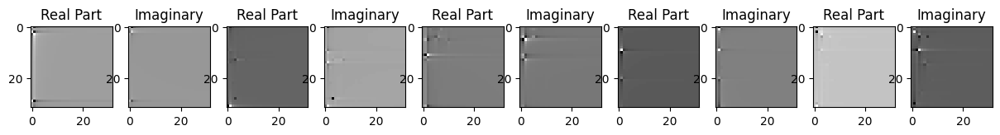

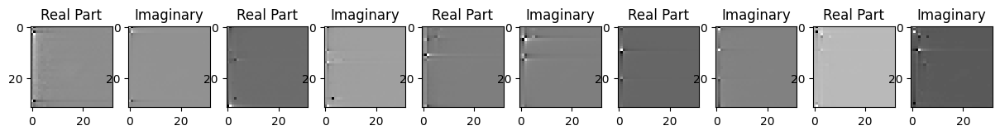

Saving model to: /content/drive/MyDrive/saved_model/_model_12_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.626253952275217
Correlation is  0.7542712688446045
Epoch-14 lr: 0.001
Loss:  5.874896942259511e-06
torch.Size([5, 2, 32, 32])


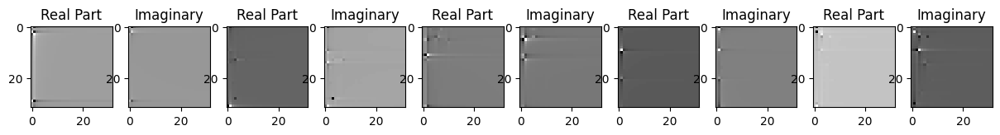

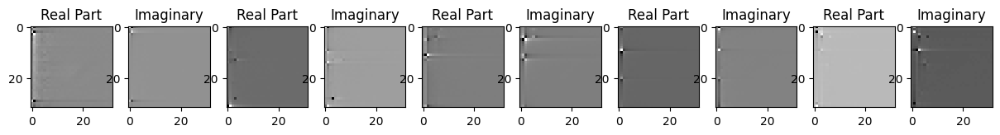

Saving model to: /content/drive/MyDrive/saved_model/_model_13_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.65869775345102
Correlation is  0.7543394565582275
Epoch-15 lr: 0.001
Loss:  5.835075171489734e-06
torch.Size([5, 2, 32, 32])


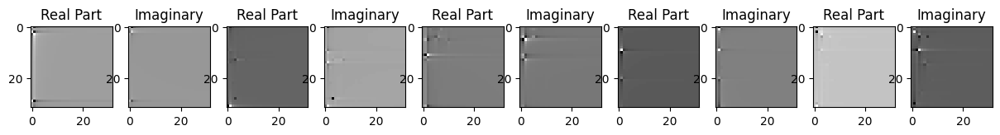

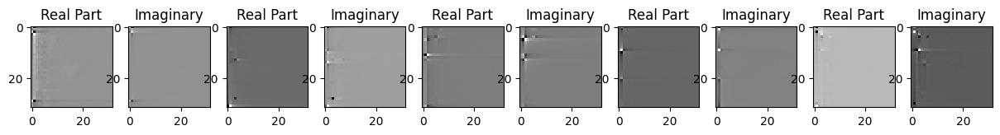

Saving model to: /content/drive/MyDrive/saved_model/_model_14_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.689068736586925
Correlation is  0.7544124126434326
Epoch-16 lr: 0.001
Loss:  5.787725513073383e-06
torch.Size([5, 2, 32, 32])


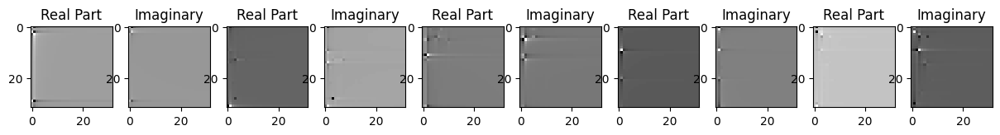

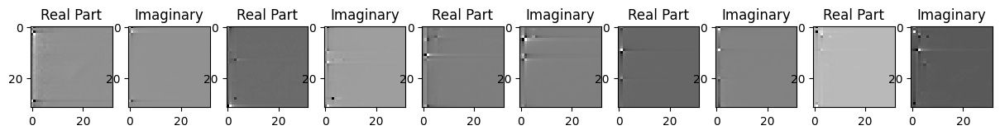

Saving model to: /content/drive/MyDrive/saved_model/_model_15_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.727121863703232
Correlation is  0.7544682621955872
Epoch-17 lr: 0.001
Loss:  5.744194822909776e-06
torch.Size([5, 2, 32, 32])


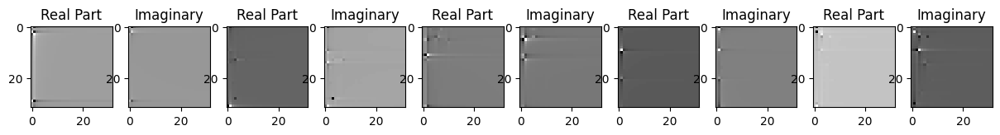

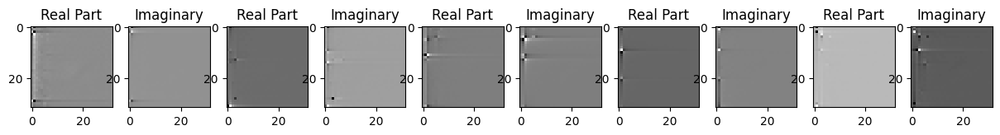

Saving model to: /content/drive/MyDrive/saved_model/_model_16_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.763099409833735
Correlation is  0.7545410990715027
Epoch-18 lr: 0.001
Loss:  5.742119810747681e-06
torch.Size([5, 2, 32, 32])


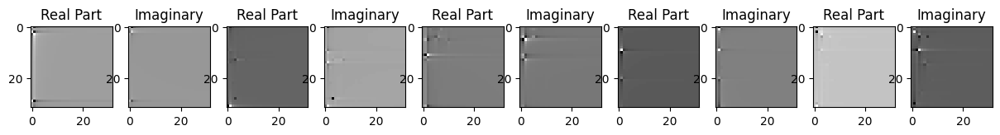

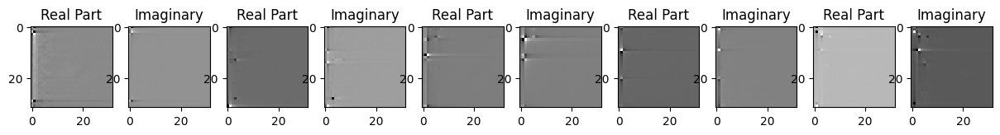

Saving model to: /content/drive/MyDrive/saved_model/_model_17_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.762172232117365
Correlation is  0.7545225620269775
Epoch-19 lr: 0.001
Loss:  5.75956619286444e-06
torch.Size([5, 2, 32, 32])


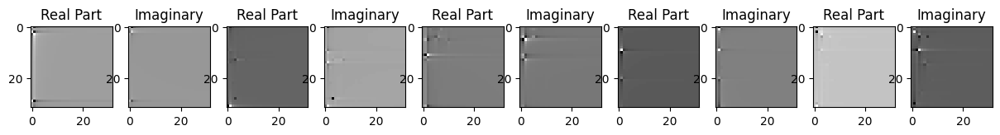

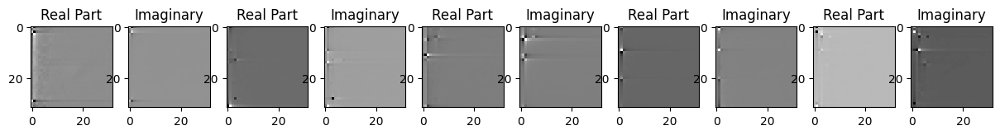

Saving model to: /content/drive/MyDrive/saved_model/_model_18_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.74511352449891
Correlation is  0.7544854283332825
Epoch-20 lr: 0.001
Loss:  5.719924047298264e-06
torch.Size([5, 2, 32, 32])


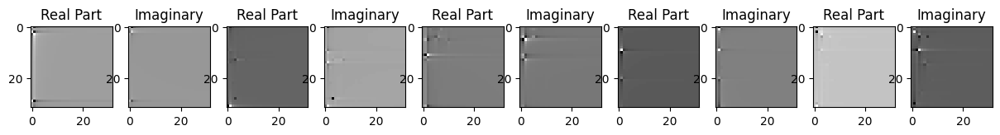

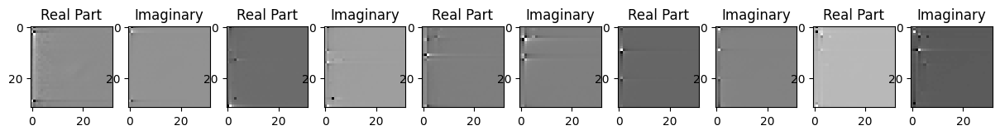

Saving model to: /content/drive/MyDrive/saved_model/_model_19_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.77752136883832
Correlation is  0.7545346021652222
Epoch-21 lr: 0.001
Loss:  5.6787744142638985e-06
torch.Size([5, 2, 32, 32])


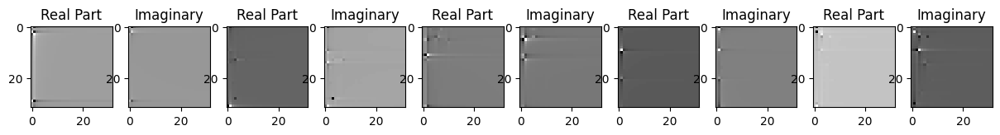

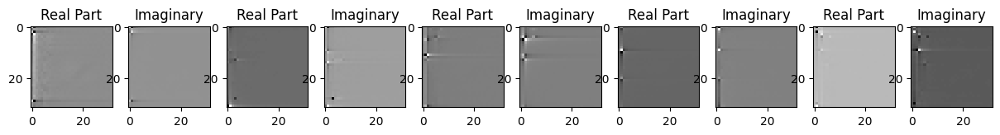

Saving model to: /content/drive/MyDrive/saved_model/_model_20_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.811765600303822
Correlation is  0.7546339631080627
Epoch-22 lr: 0.001
Loss:  5.6668422985239886e-06
torch.Size([5, 2, 32, 32])


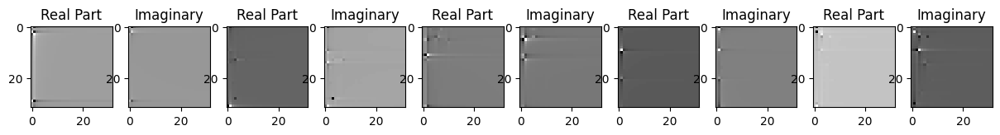

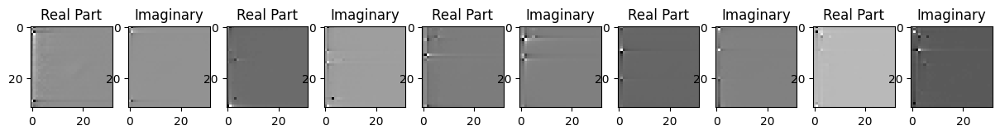

Saving model to: /content/drive/MyDrive/saved_model/_model_21_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.81925232211521
Correlation is  0.7546285390853882
Epoch-23 lr: 0.001
Loss:  5.635915385937551e-06
torch.Size([5, 2, 32, 32])


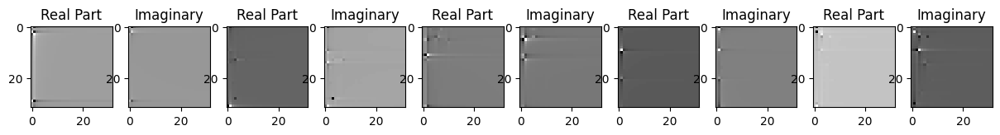

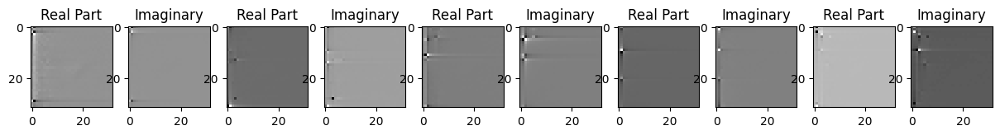

Saving model to: /content/drive/MyDrive/saved_model/_model_22_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.844590377384
Correlation is  0.7546708583831787
Epoch-24 lr: 0.001
Loss:  5.589388365478953e-06
torch.Size([5, 2, 32, 32])


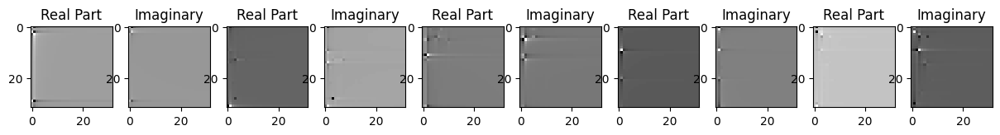

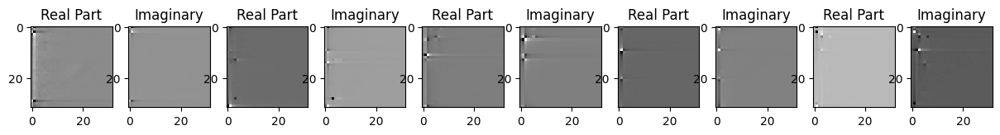

Saving model to: /content/drive/MyDrive/saved_model/_model_23_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.88509871884053
Correlation is  0.7547664046287537
Epoch-25 lr: 0.001
Loss:  5.651555511576589e-06
torch.Size([5, 2, 32, 32])


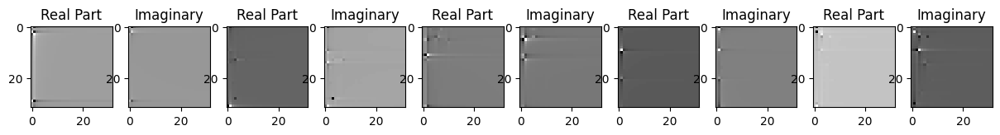

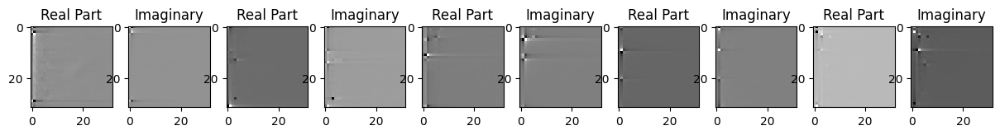

Saving model to: /content/drive/MyDrive/saved_model/_model_24_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.82791259228764
Correlation is  0.7546478509902954
Epoch-26 lr: 0.001
Loss:  5.627545760944486e-06
torch.Size([5, 2, 32, 32])


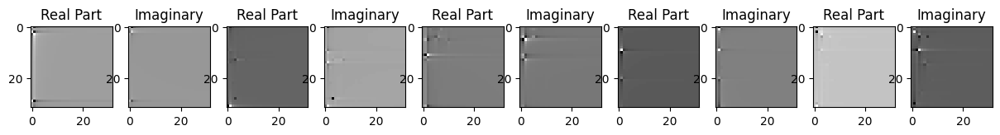

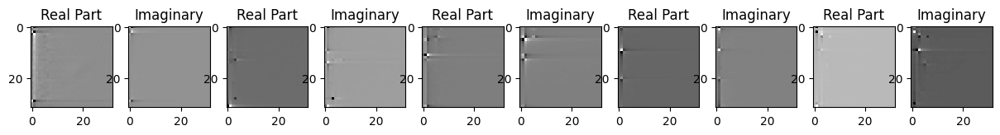

Saving model to: /content/drive/MyDrive/saved_model/_model_25_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.84820229751267
Correlation is  0.754686176776886
Epoch-27 lr: 0.001
Loss:  5.773838893219363e-06
torch.Size([5, 2, 32, 32])


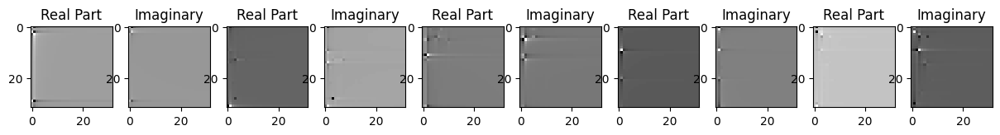

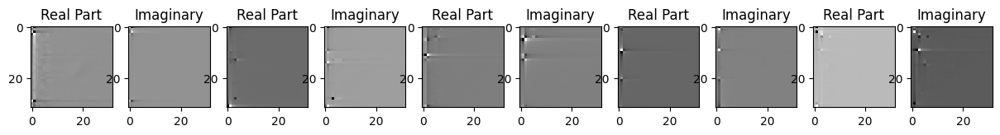

Saving model to: /content/drive/MyDrive/saved_model/_model_26_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.71987197890808
Correlation is  0.7543672919273376
Epoch-28 lr: 0.001
Loss:  5.854572918906342e-06
torch.Size([5, 2, 32, 32])


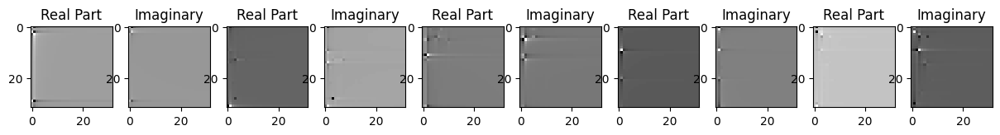

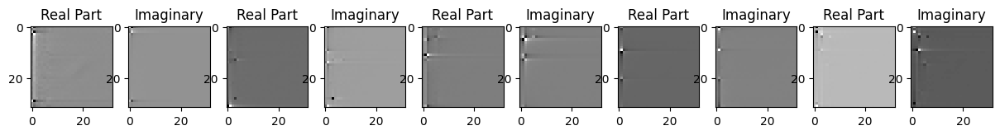

Saving model to: /content/drive/MyDrive/saved_model/_model_27_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.651020005574022
Correlation is  0.7541857957839966
Epoch-29 lr: 0.001
Loss:  5.8827454267884605e-06
torch.Size([5, 2, 32, 32])


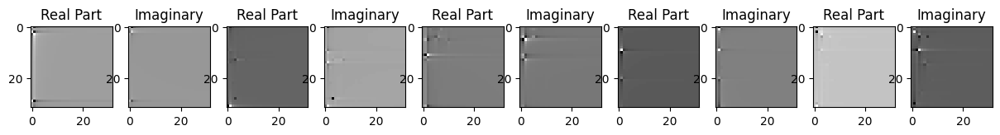

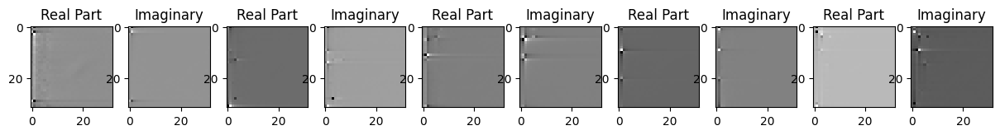

Saving model to: /content/drive/MyDrive/saved_model/_model_28_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.62695914247954
Correlation is  0.7542015314102173
Epoch-30 lr: 0.001
Loss:  5.860464625584427e-06
torch.Size([5, 2, 32, 32])


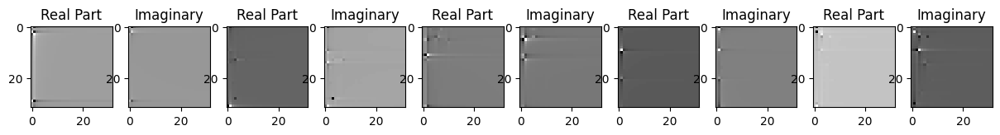

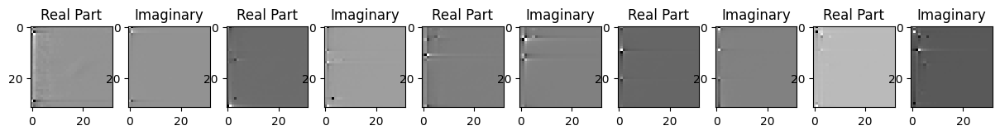

Saving model to: /content/drive/MyDrive/saved_model/_model_29_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.644587730348825
Correlation is  0.754210889339447
Epoch-31 lr: 0.001
Loss:  5.907555532758124e-06
torch.Size([5, 2, 32, 32])


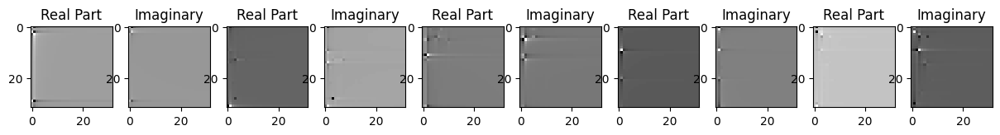

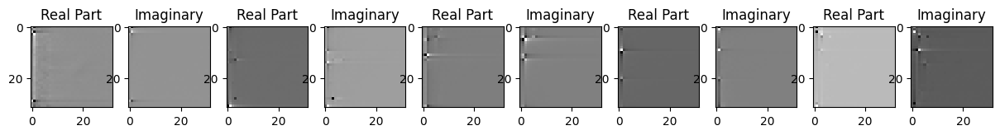

Saving model to: /content/drive/MyDrive/saved_model/_model_30_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.60393873903952
Correlation is  0.7541109919548035
Epoch-32 lr: 0.001
Loss:  5.8574996728566475e-06
torch.Size([5, 2, 32, 32])


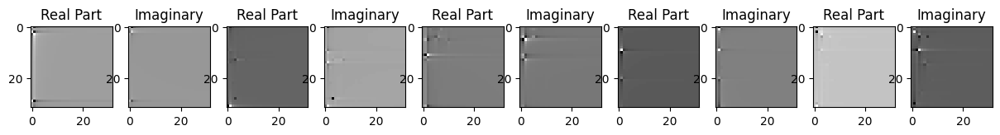

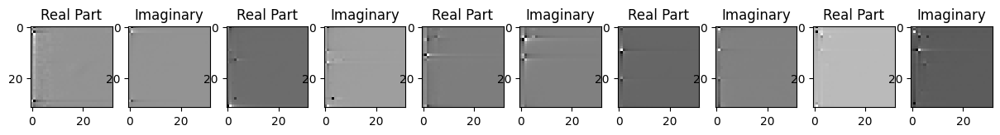

Saving model to: /content/drive/MyDrive/saved_model/_model_31_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.645432696731724
Correlation is  0.7541525363922119
Epoch-33 lr: 0.001
Loss:  5.796172445116099e-06
torch.Size([5, 2, 32, 32])


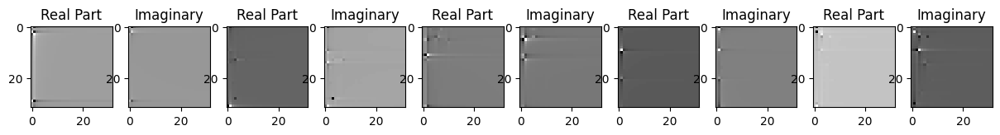

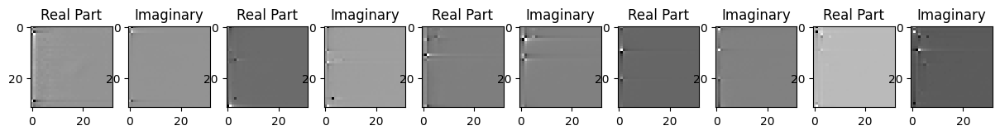

Saving model to: /content/drive/MyDrive/saved_model/_model_32_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.6954726294793
Correlation is  0.7542917132377625
Epoch-34 lr: 0.001
Loss:  5.714378403354203e-06
torch.Size([5, 2, 32, 32])


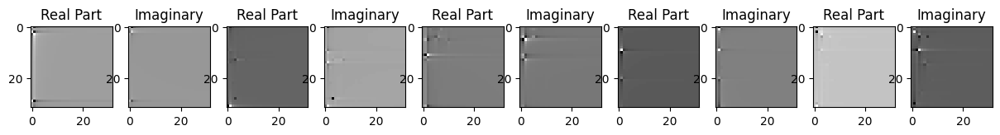

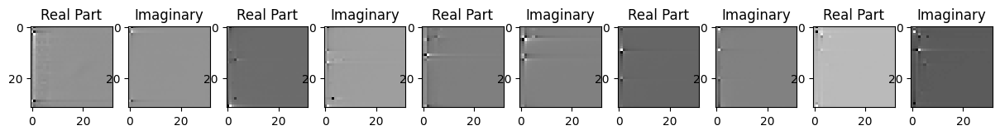

Saving model to: /content/drive/MyDrive/saved_model/_model_33_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.76449724274981
Correlation is  0.7544398307800293
Epoch-35 lr: 0.001
Loss:  5.79444940740359e-06
torch.Size([5, 2, 32, 32])


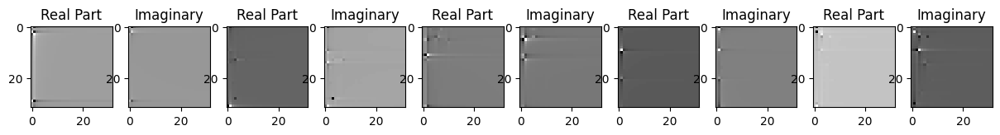

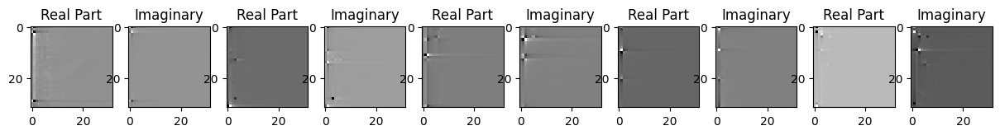

Saving model to: /content/drive/MyDrive/saved_model/_model_34_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.69535401957384
Correlation is  0.7542437314987183
Epoch-36 lr: 0.001
Loss:  5.919896466366481e-06
torch.Size([5, 2, 32, 32])


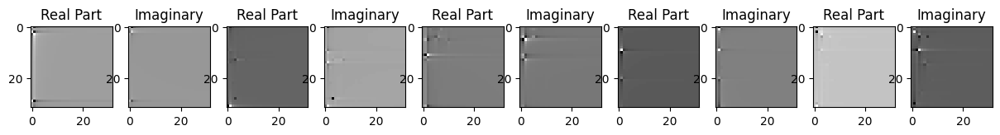

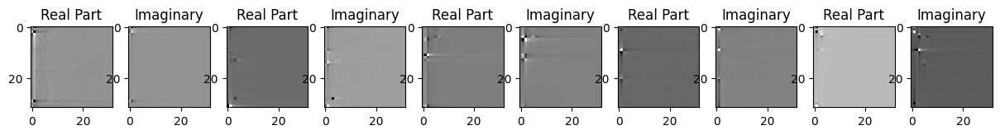

Saving model to: /content/drive/MyDrive/saved_model/_model_35_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.59098993050339
Correlation is  0.754105269908905
Epoch-37 lr: 0.001
Loss:  5.754818175773835e-06
torch.Size([5, 2, 32, 32])


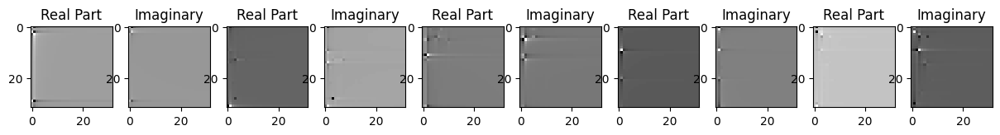

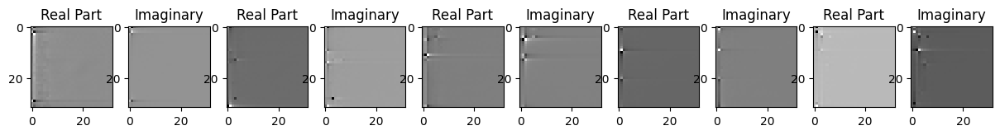

Saving model to: /content/drive/MyDrive/saved_model/_model_36_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.727887381638674
Correlation is  0.7543854117393494
Epoch-38 lr: 0.001
Loss:  5.73833312955685e-06
torch.Size([5, 2, 32, 32])


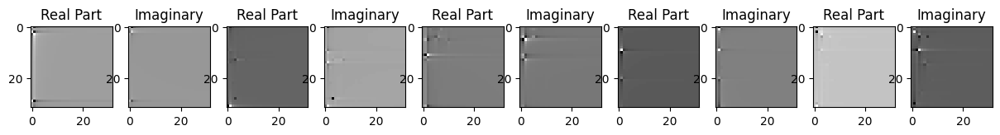

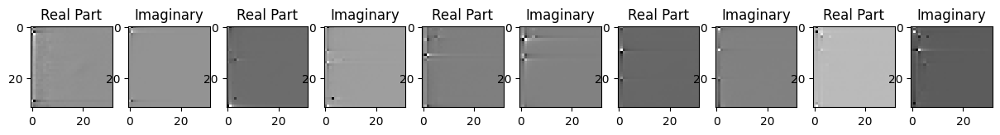

Saving model to: /content/drive/MyDrive/saved_model/_model_37_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.73923297319503
Correlation is  0.754467785358429
Epoch-39 lr: 0.001
Loss:  5.945270004303893e-06
torch.Size([5, 2, 32, 32])


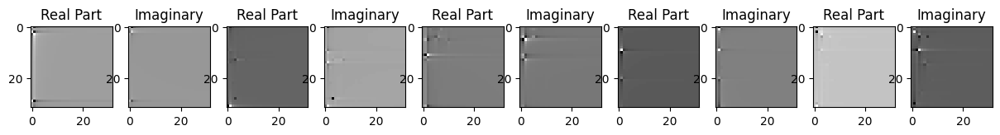

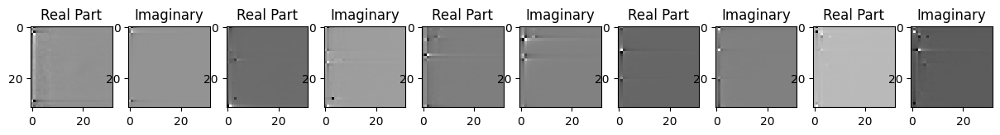

Saving model to: /content/drive/MyDrive/saved_model/_model_38_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.565917446799848
Correlation is  0.7540226578712463
Epoch-40 lr: 0.001
Loss:  5.855055405845633e-06
torch.Size([5, 2, 32, 32])


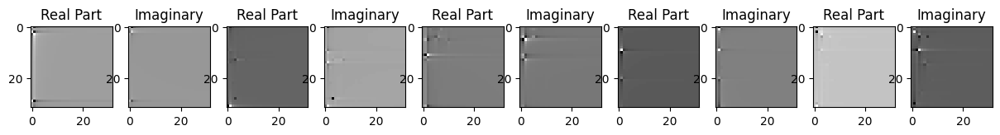

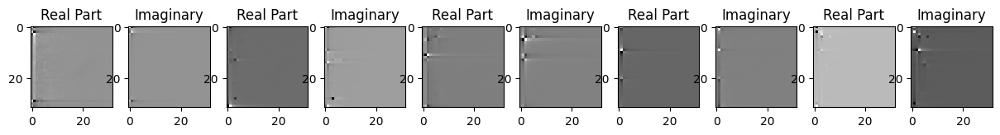

Saving model to: /content/drive/MyDrive/saved_model/_model_39_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.639789580561295
Correlation is  0.7542250752449036
Epoch-41 lr: 0.001
Loss:  5.7636152632767335e-06
torch.Size([5, 2, 32, 32])


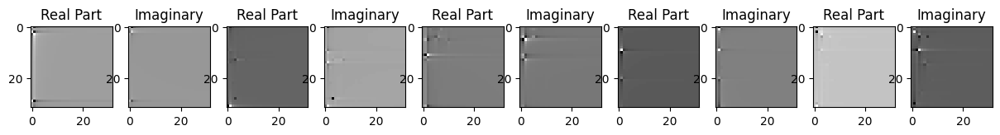

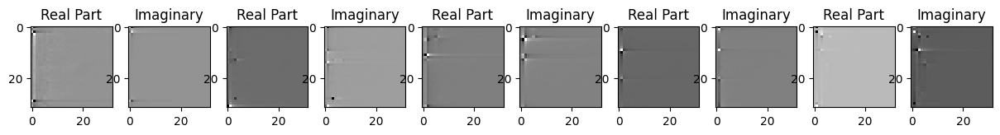

Saving model to: /content/drive/MyDrive/saved_model/_model_40_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.715738312013062
Correlation is  0.7543719410896301
Epoch-42 lr: 0.001
Loss:  5.6951639635371976e-06
torch.Size([5, 2, 32, 32])


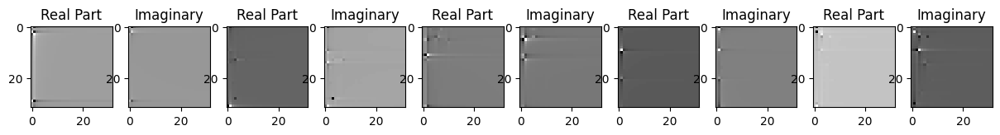

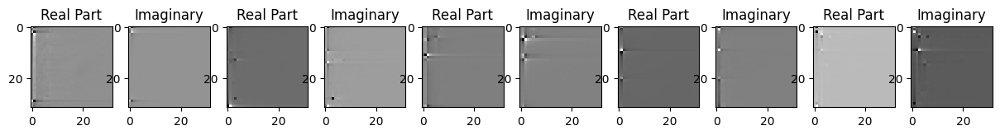

Saving model to: /content/drive/MyDrive/saved_model/_model_41_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.772604959970487
Correlation is  0.7545034885406494
Epoch-43 lr: 0.001
Loss:  5.805855835205875e-06
torch.Size([5, 2, 32, 32])


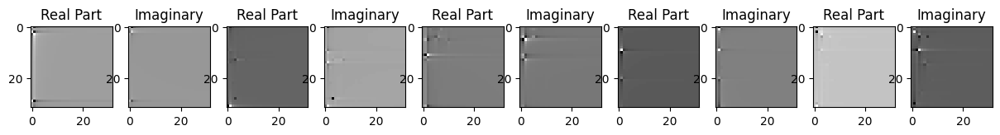

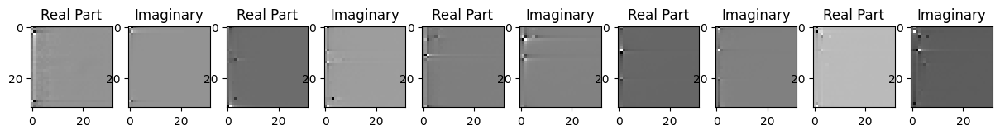

Saving model to: /content/drive/MyDrive/saved_model/_model_42_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.6769578346459
Correlation is  0.7542569041252136
Epoch-44 lr: 0.001
Loss:  5.702835096599301e-06
torch.Size([5, 2, 32, 32])


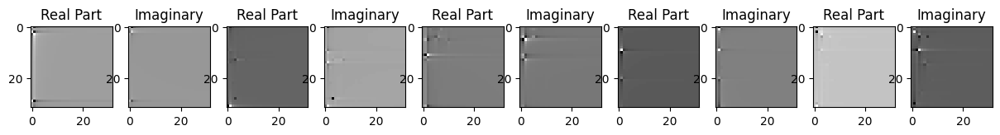

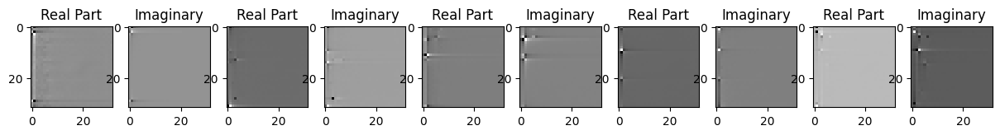

Saving model to: /content/drive/MyDrive/saved_model/_model_43_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.764376428369204
Correlation is  0.7544070482254028
Epoch-45 lr: 0.001
Loss:  5.719662567571504e-06
torch.Size([5, 2, 32, 32])


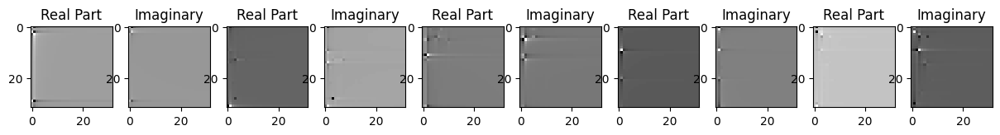

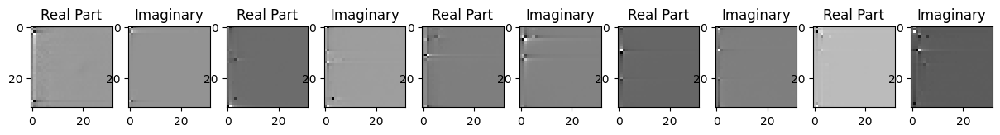

Saving model to: /content/drive/MyDrive/saved_model/_model_44_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.748742164814026
Correlation is  0.7542811036109924
Epoch-46 lr: 0.001
Loss:  5.469975803862326e-06
torch.Size([5, 2, 32, 32])


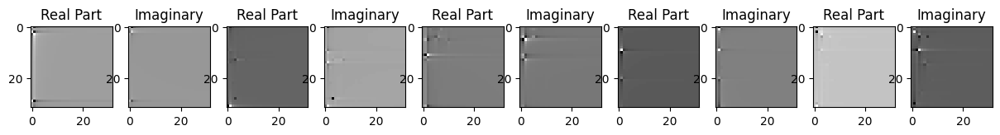

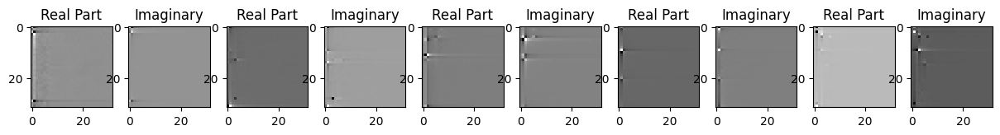

Saving model to: /content/drive/MyDrive/saved_model/_model_45_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.966804509840532
Correlation is  0.7546582818031311
Epoch-47 lr: 0.001
Loss:  5.437681920739124e-06
torch.Size([5, 2, 32, 32])


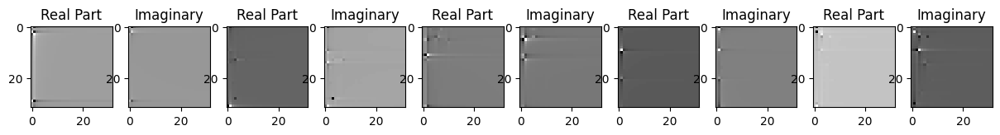

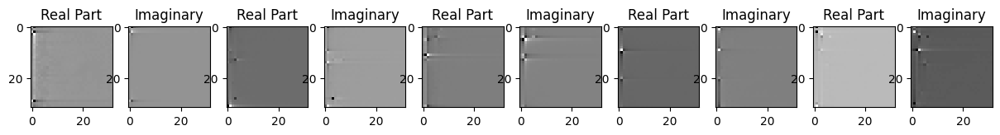

Saving model to: /content/drive/MyDrive/saved_model/_model_46_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.995126557407215
Correlation is  0.7546924352645874
Epoch-48 lr: 0.001
Loss:  5.382163180911448e-06
torch.Size([5, 2, 32, 32])


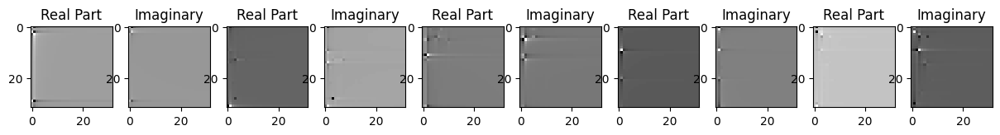

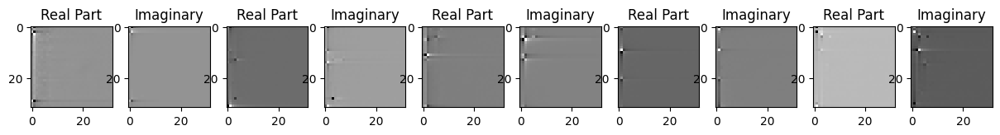

Saving model to: /content/drive/MyDrive/saved_model/_model_47_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.04412337814087
Correlation is  0.754725456237793
Epoch-49 lr: 0.001
Loss:  5.406492164183874e-06
torch.Size([5, 2, 32, 32])


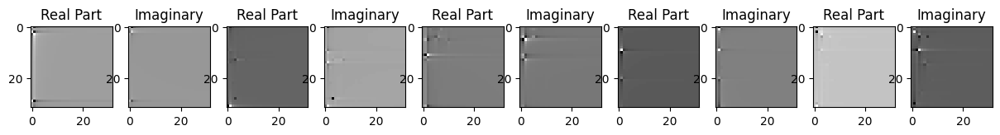

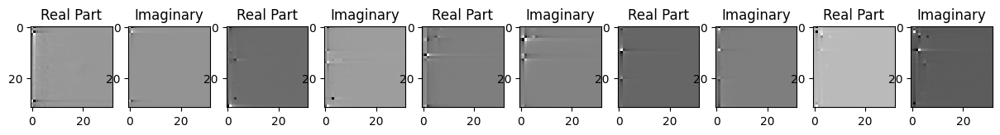

Saving model to: /content/drive/MyDrive/saved_model/_model_48_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.02161634834968
Correlation is  0.754685640335083
Epoch-50 lr: 0.001
Loss:  5.404139756137738e-06
torch.Size([5, 2, 32, 32])


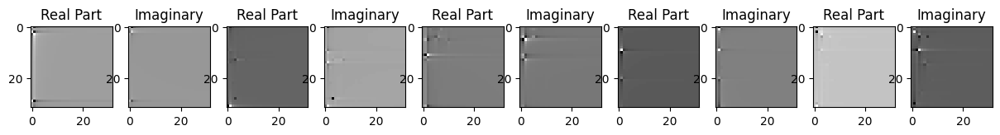

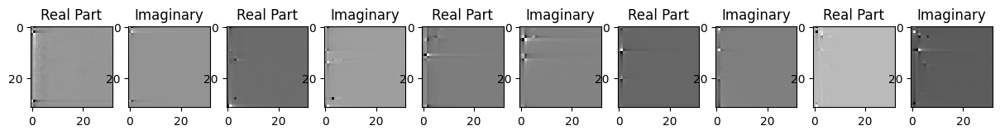

Saving model to: /content/drive/MyDrive/saved_model/_model_49_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.022430414364734
Correlation is  0.7546433210372925
Epoch-51 lr: 0.001
Loss:  5.517490080819698e-06
torch.Size([5, 2, 32, 32])


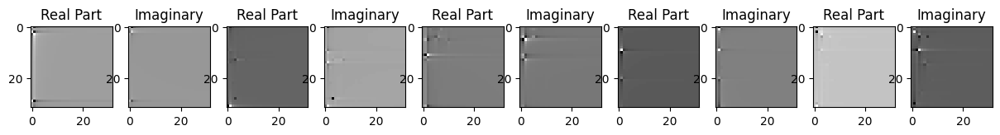

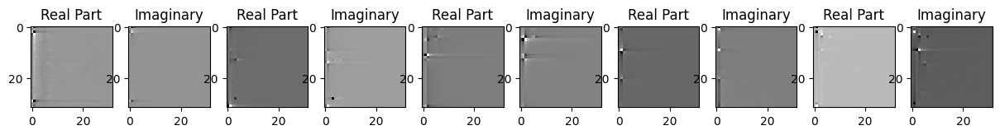

Saving model to: /content/drive/MyDrive/saved_model/_model_50_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.918860482713736
Correlation is  0.7543950080871582
Epoch-52 lr: 0.001
Loss:  5.650613729812903e-06
torch.Size([5, 2, 32, 32])


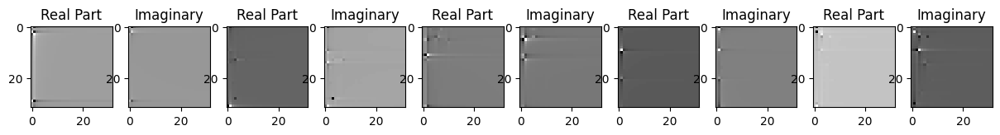

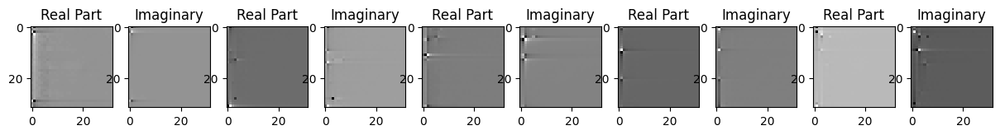

Saving model to: /content/drive/MyDrive/saved_model/_model_51_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.801937681671387
Correlation is  0.7541995048522949
Epoch-53 lr: 0.001
Loss:  5.60829539608676e-06
torch.Size([5, 2, 32, 32])


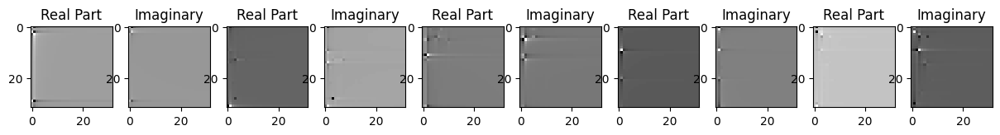

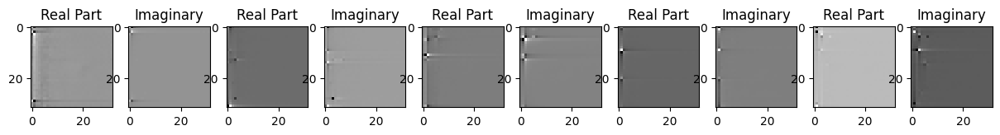

Saving model to: /content/drive/MyDrive/saved_model/_model_52_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.835683361362992
Correlation is  0.7543251514434814
Epoch-54 lr: 0.001
Loss:  5.676777163898805e-06
torch.Size([5, 2, 32, 32])


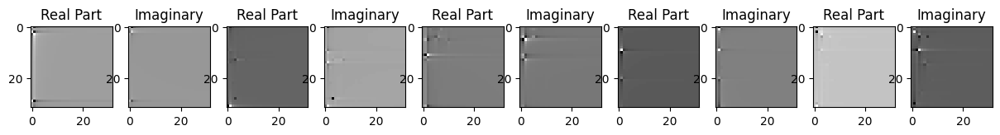

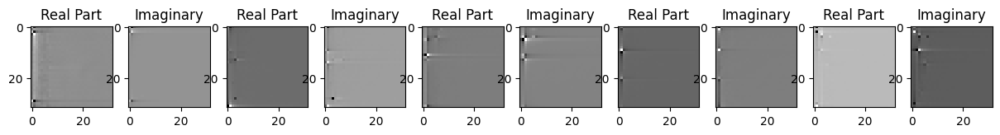

Saving model to: /content/drive/MyDrive/saved_model/_model_53_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.776215152731087
Correlation is  0.7542003989219666
Epoch-55 lr: 0.001
Loss:  5.483786935656099e-06
torch.Size([5, 2, 32, 32])


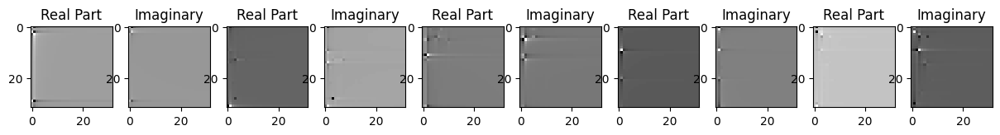

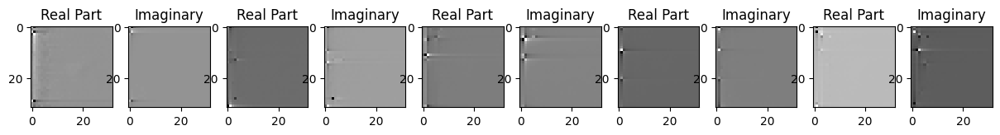

Saving model to: /content/drive/MyDrive/saved_model/_model_54_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -18.94307422681306
Correlation is  0.754574716091156
Epoch-56 lr: 0.001
Loss:  5.397950644692173e-06
torch.Size([5, 2, 32, 32])


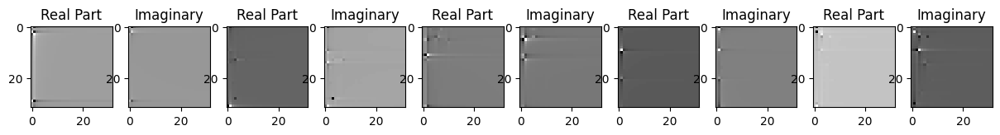

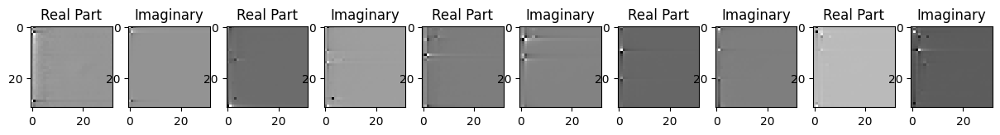

Saving model to: /content/drive/MyDrive/saved_model/_model_55_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.01946195720885
Correlation is  0.7546702027320862
Epoch-57 lr: 0.001
Loss:  5.407692697190214e-06
torch.Size([5, 2, 32, 32])


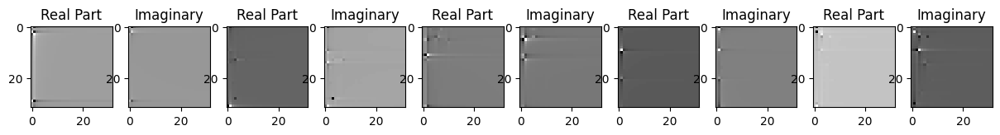

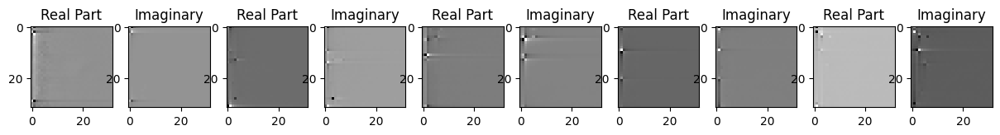

Saving model to: /content/drive/MyDrive/saved_model/_model_56_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.01055843421069
Correlation is  0.7546110153198242
Epoch-58 lr: 0.001
Loss:  5.279813194647431e-06
torch.Size([5, 2, 32, 32])


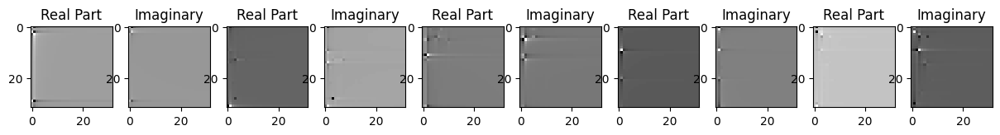

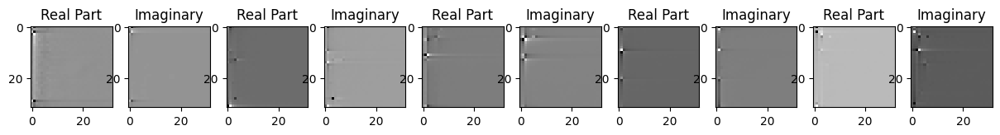

Saving model to: /content/drive/MyDrive/saved_model/_model_57_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.127227392426224
Correlation is  0.7547800540924072
Epoch-59 lr: 0.001
Loss:  5.31391606273246e-06
torch.Size([5, 2, 32, 32])


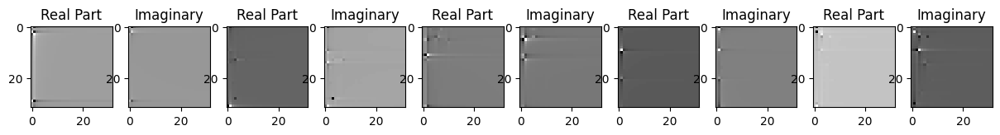

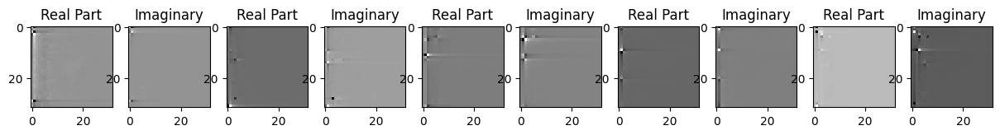

Saving model to: /content/drive/MyDrive/saved_model/_model_58_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.09374297941265
Correlation is  0.7546492218971252
Epoch-60 lr: 0.001
Loss:  5.197598511585966e-06
torch.Size([5, 2, 32, 32])


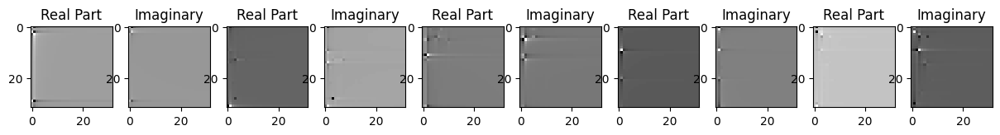

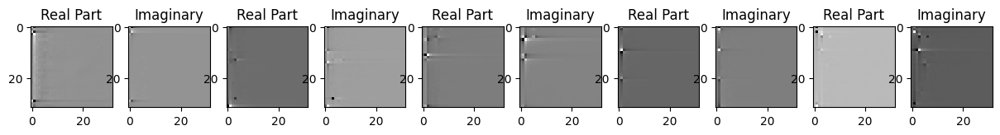

Saving model to: /content/drive/MyDrive/saved_model/_model_59_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.201853094876363
Correlation is  0.7548883557319641
Epoch-61 lr: 0.001
Loss:  5.140382199897431e-06
torch.Size([5, 2, 32, 32])


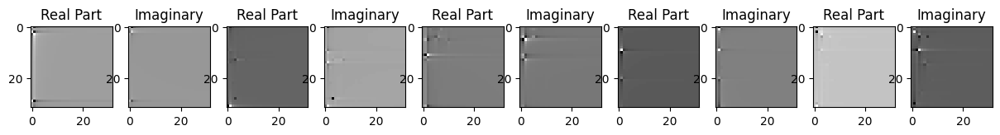

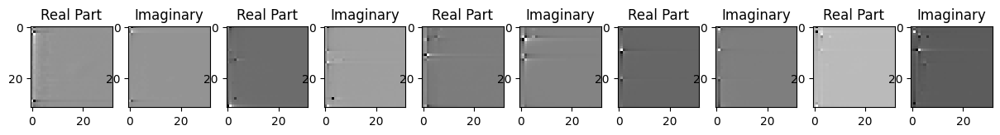

Saving model to: /content/drive/MyDrive/saved_model/_model_60_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.25497948671138
Correlation is  0.7549620270729065
Epoch-62 lr: 0.001
Loss:  5.204587068874389e-06
torch.Size([5, 2, 32, 32])


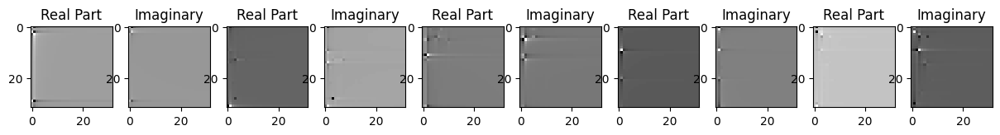

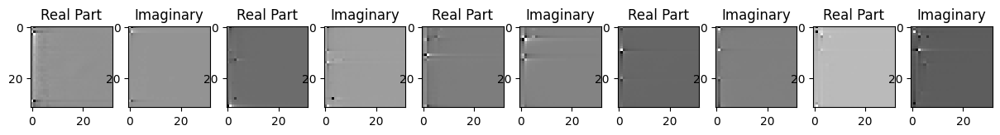

Saving model to: /content/drive/MyDrive/saved_model/_model_61_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.192932503758758
Correlation is  0.7547803521156311
Epoch-63 lr: 0.001
Loss:  5.174550551600987e-06
torch.Size([5, 2, 32, 32])


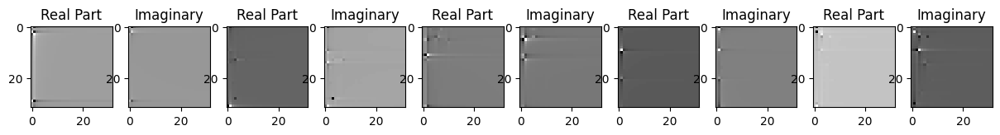

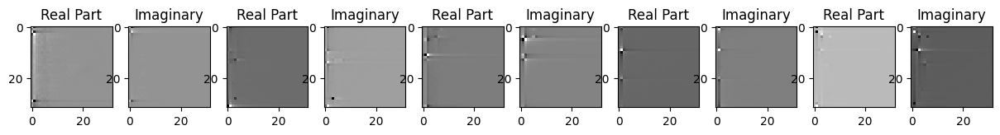

Saving model to: /content/drive/MyDrive/saved_model/_model_62_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.219536529139567
Correlation is  0.7549006342887878
Epoch-64 lr: 0.001
Loss:  5.1260685722809285e-06
torch.Size([5, 2, 32, 32])


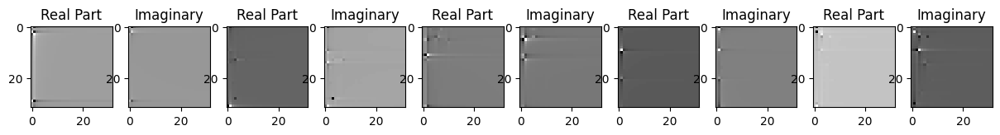

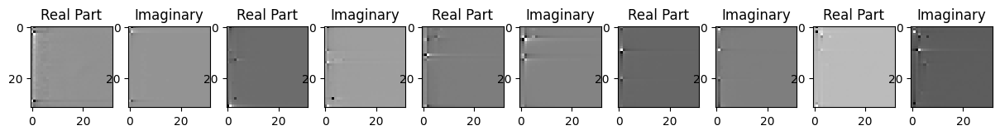

Saving model to: /content/drive/MyDrive/saved_model/_model_63_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.263341352061204
Correlation is  0.7550883889198303
Epoch-65 lr: 0.001
Loss:  5.186891485209344e-06
torch.Size([5, 2, 32, 32])


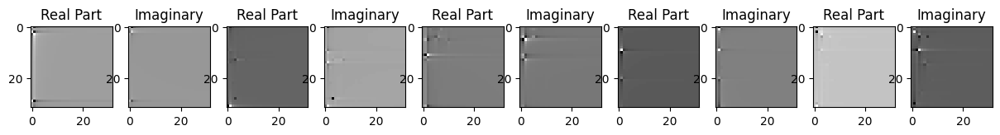

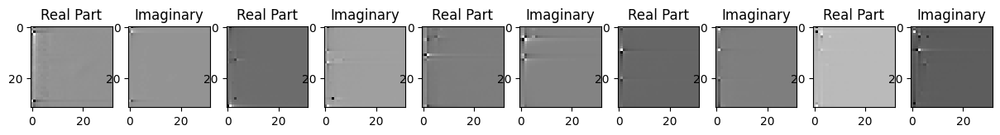

Saving model to: /content/drive/MyDrive/saved_model/_model_64_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.20525912796007
Correlation is  0.7550234794616699
Epoch-66 lr: 0.001
Loss:  5.235323442320805e-06
torch.Size([5, 2, 32, 32])


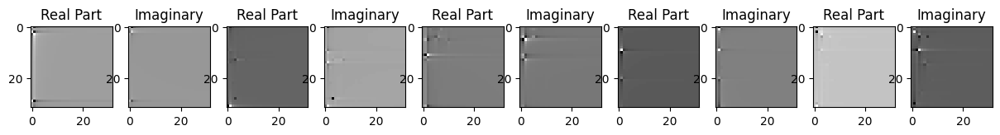

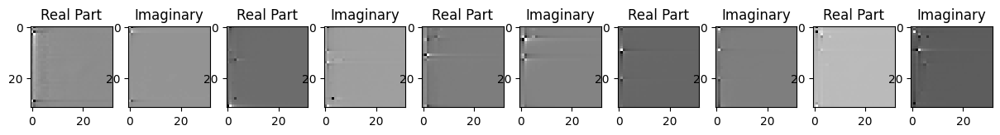

Saving model to: /content/drive/MyDrive/saved_model/_model_65_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.15925957847335
Correlation is  0.7548945546150208
Epoch-67 lr: 0.001
Loss:  5.267670985631412e-06
torch.Size([5, 2, 32, 32])


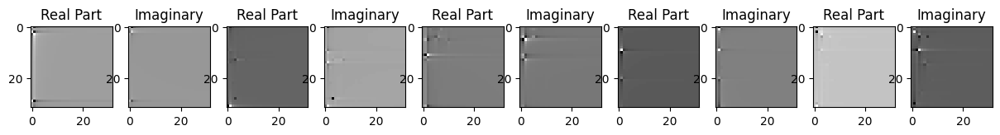

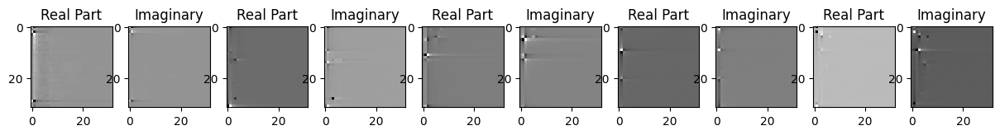

Saving model to: /content/drive/MyDrive/saved_model/_model_66_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.127801423445117
Correlation is  0.754904568195343
Epoch-68 lr: 0.001
Loss:  5.154799509909935e-06
torch.Size([5, 2, 32, 32])


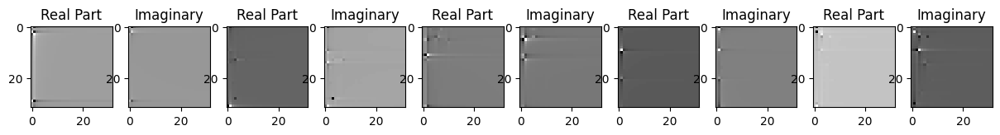

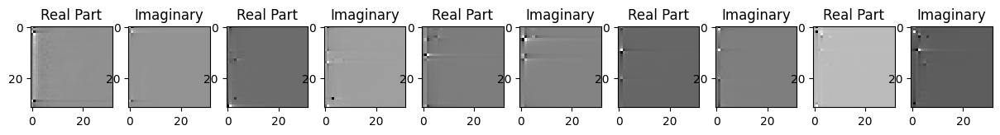

Saving model to: /content/drive/MyDrive/saved_model/_model_67_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.232657542465883
Correlation is  0.7551255822181702
Epoch-69 lr: 0.001
Loss:  5.1282231652294286e-06
torch.Size([5, 2, 32, 32])


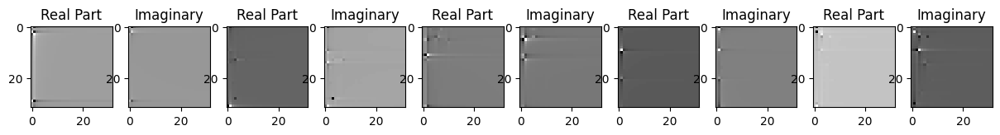

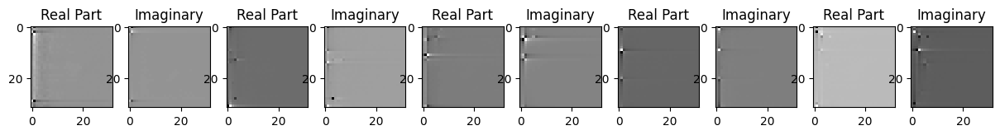

Saving model to: /content/drive/MyDrive/saved_model/_model_68_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.25803398612186
Correlation is  0.755251944065094
Epoch-70 lr: 0.001
Loss:  5.109538051328855e-06
torch.Size([5, 2, 32, 32])


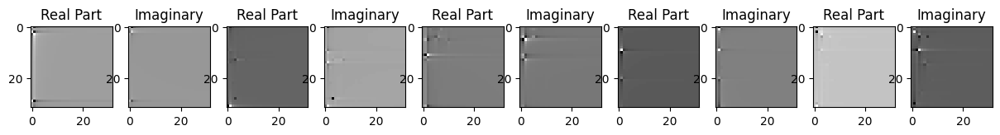

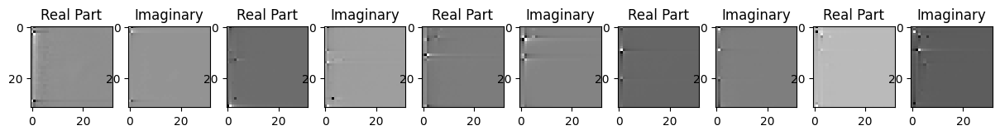

Saving model to: /content/drive/MyDrive/saved_model/_model_69_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.276493203672665
Correlation is  0.7552915811538696
Epoch-71 lr: 0.001
Loss:  5.023349331167992e-06
torch.Size([5, 2, 32, 32])


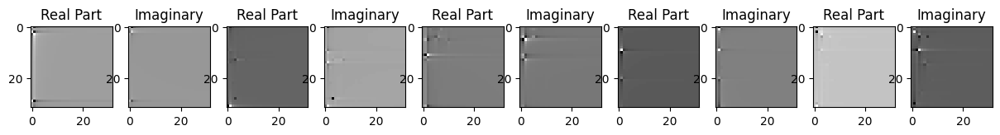

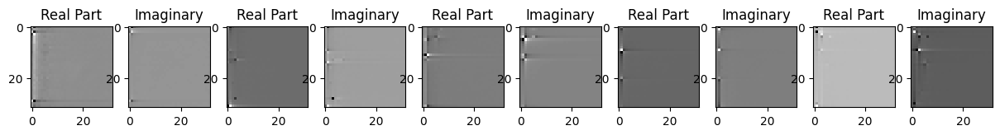

Saving model to: /content/drive/MyDrive/saved_model/_model_70_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.35964507518308
Correlation is  0.7554461359977722
Epoch-72 lr: 0.001
Loss:  5.039791176386643e-06
torch.Size([5, 2, 32, 32])


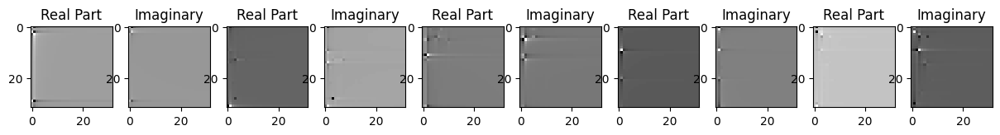

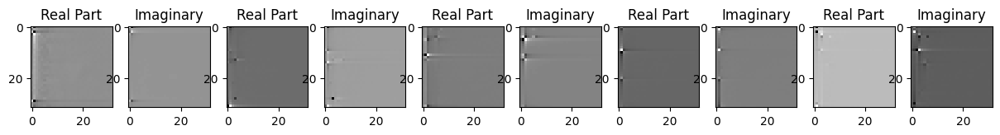

Saving model to: /content/drive/MyDrive/saved_model/_model_71_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.34218321147525
Correlation is  0.7553157210350037
Epoch-73 lr: 0.001
Loss:  4.9517889237904456e-06
torch.Size([5, 2, 32, 32])


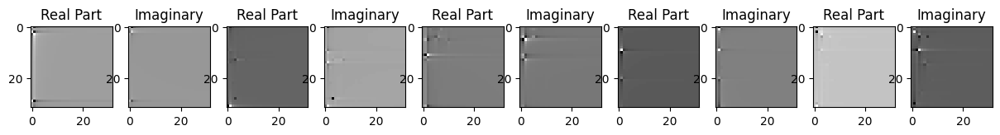

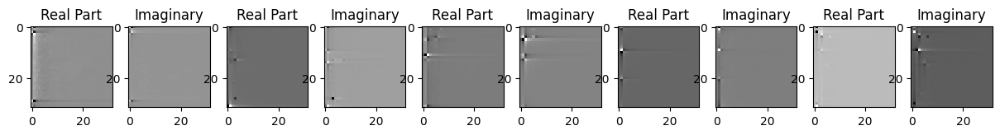

Saving model to: /content/drive/MyDrive/saved_model/_model_72_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.42836855197011
Correlation is  0.7554672360420227
Epoch-74 lr: 0.001
Loss:  4.9254904297413304e-06
torch.Size([5, 2, 32, 32])


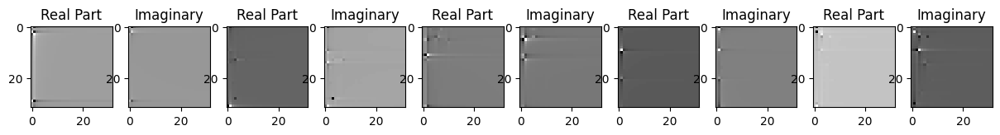

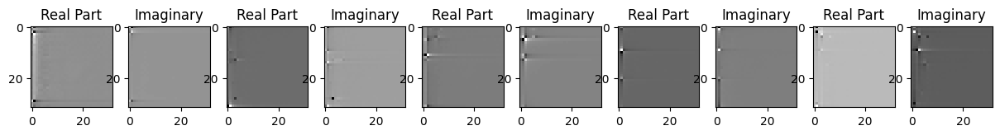

Saving model to: /content/drive/MyDrive/saved_model/_model_73_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.454571546857814
Correlation is  0.7555258870124817
Epoch-75 lr: 0.001
Loss:  4.896611244475935e-06
torch.Size([5, 2, 32, 32])


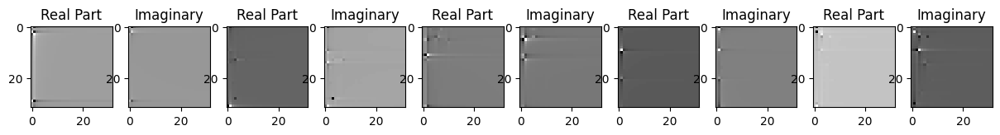

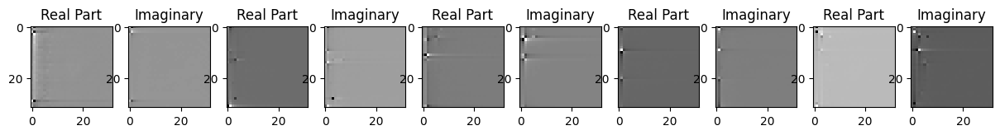

Saving model to: /content/drive/MyDrive/saved_model/_model_74_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.48420659480109
Correlation is  0.7555266618728638
Epoch-76 lr: 0.001
Loss:  4.867910774919437e-06
torch.Size([5, 2, 32, 32])


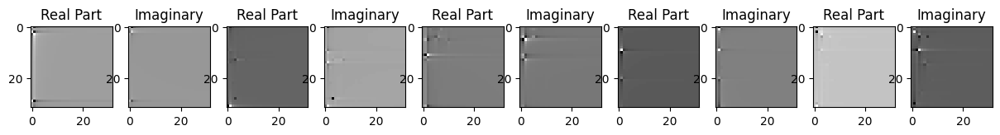

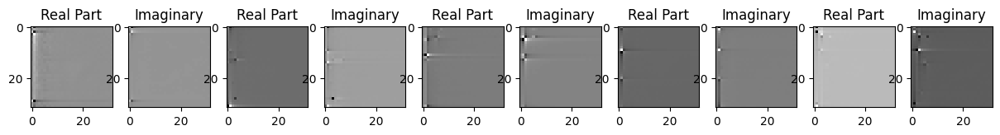

Saving model to: /content/drive/MyDrive/saved_model/_model_75_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.511747935245918
Correlation is  0.7555996179580688
Epoch-77 lr: 0.001
Loss:  4.861482466367306e-06
torch.Size([5, 2, 32, 32])


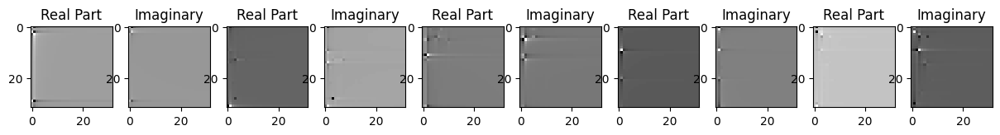

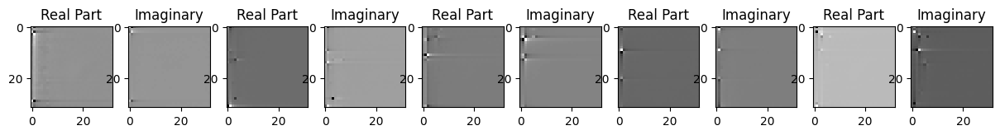

Saving model to: /content/drive/MyDrive/saved_model/_model_76_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.517945596619775
Correlation is  0.7555563449859619
Epoch-78 lr: 0.001
Loss:  4.836714197153924e-06
torch.Size([5, 2, 32, 32])


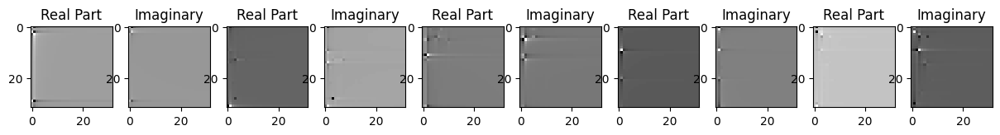

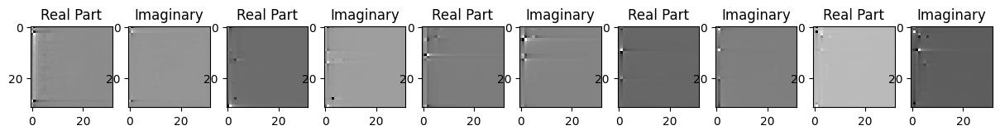

Saving model to: /content/drive/MyDrive/saved_model/_model_77_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.542381670898475
Correlation is  0.7556155323982239
Epoch-79 lr: 0.001
Loss:  4.834356786886929e-06
torch.Size([5, 2, 32, 32])


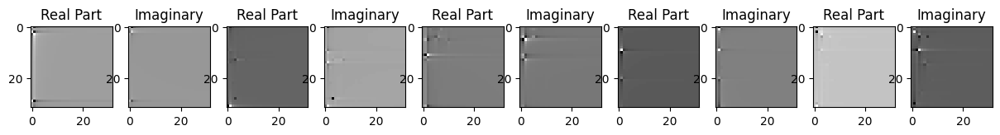

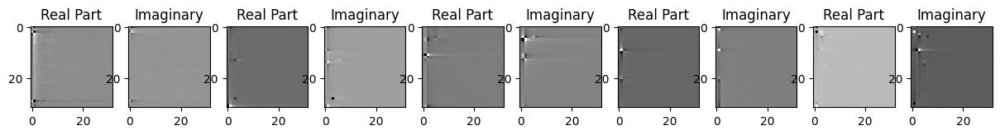

Saving model to: /content/drive/MyDrive/saved_model/_model_78_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.543923195769764
Correlation is  0.7556729316711426
Epoch-80 lr: 0.001
Loss:  4.836399511987111e-06
torch.Size([5, 2, 32, 32])


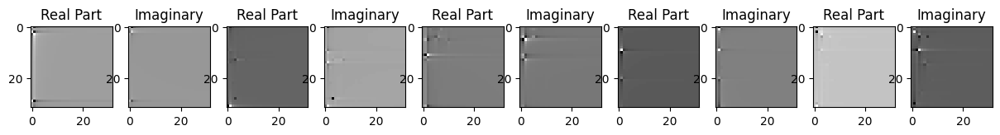

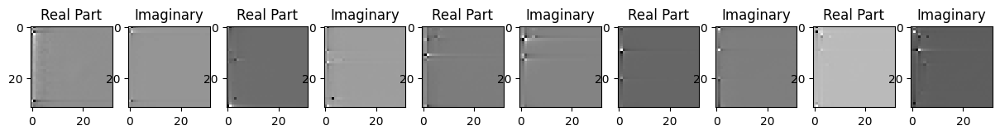

Saving model to: /content/drive/MyDrive/saved_model/_model_79_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.540944402499846
Correlation is  0.7556865811347961
Epoch-81 lr: 0.001
Loss:  4.79202572023496e-06
torch.Size([5, 2, 32, 32])


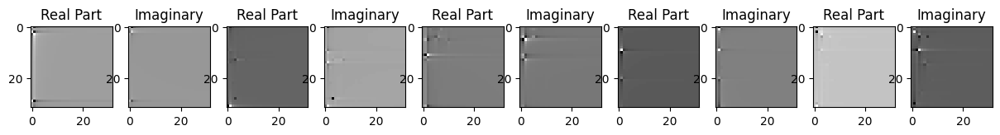

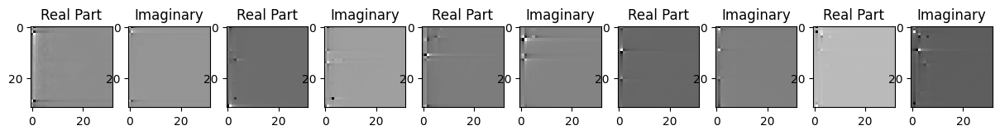

Saving model to: /content/drive/MyDrive/saved_model/_model_80_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.585967643787267
Correlation is  0.755720853805542
Epoch-82 lr: 0.001
Loss:  4.783758413395844e-06
torch.Size([5, 2, 32, 32])


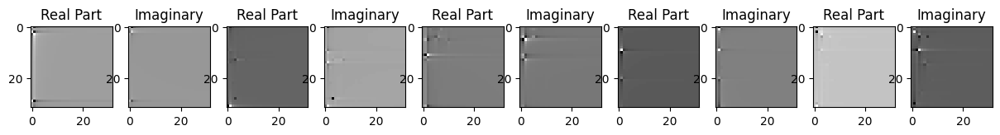

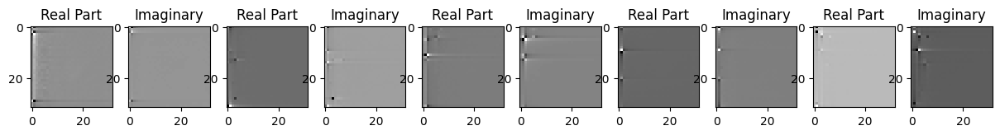

Saving model to: /content/drive/MyDrive/saved_model/_model_81_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.594893279423932
Correlation is  0.7557918429374695
Epoch-83 lr: 0.001
Loss:  4.781758889293997e-06
torch.Size([5, 2, 32, 32])


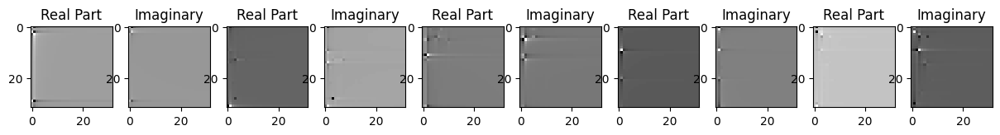

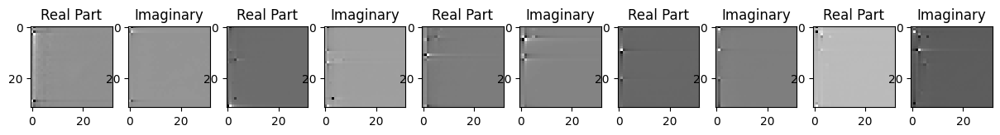

Saving model to: /content/drive/MyDrive/saved_model/_model_82_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.596489312003303
Correlation is  0.7557289004325867
Epoch-84 lr: 0.001
Loss:  4.774769422510872e-06
torch.Size([5, 2, 32, 32])


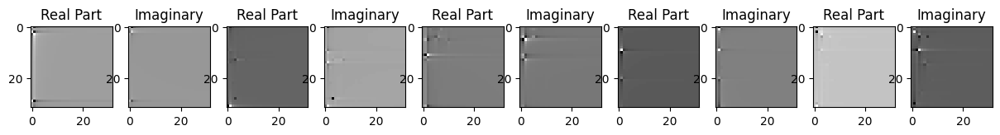

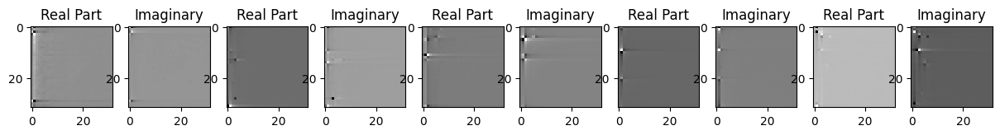

Saving model to: /content/drive/MyDrive/saved_model/_model_83_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.603227412170195
Correlation is  0.7557238340377808
Epoch-85 lr: 0.001
Loss:  4.7610838009859435e-06
torch.Size([5, 2, 32, 32])


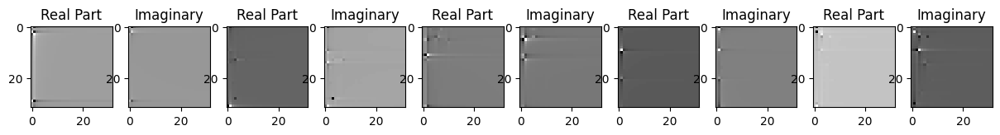

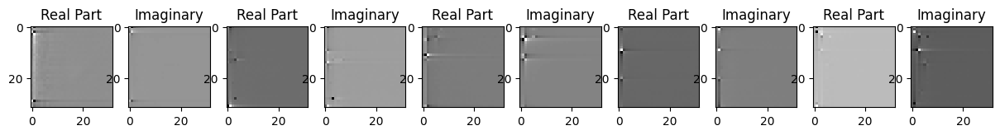

Saving model to: /content/drive/MyDrive/saved_model/_model_84_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.617434616282907
Correlation is  0.7557520270347595
Epoch-86 lr: 0.001
Loss:  4.80981088912813e-06
torch.Size([5, 2, 32, 32])


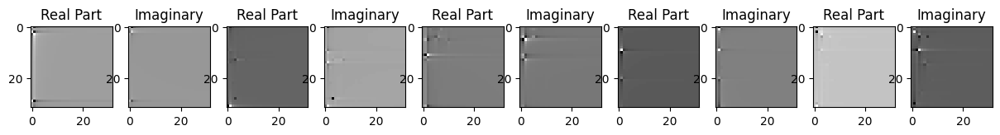

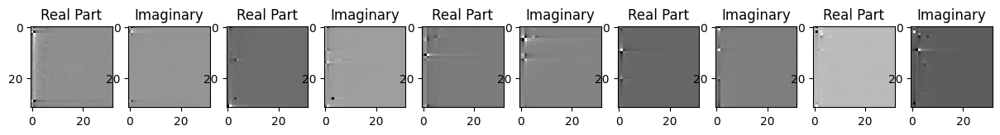

Saving model to: /content/drive/MyDrive/saved_model/_model_85_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.56741437650955
Correlation is  0.7556660175323486
Epoch-87 lr: 0.001
Loss:  4.766225174535066e-06
torch.Size([5, 2, 32, 32])


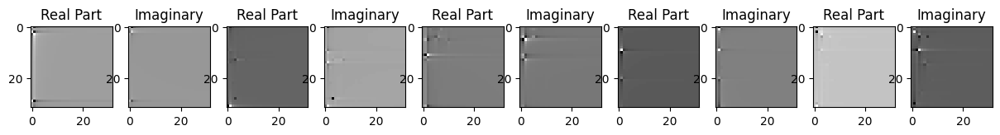

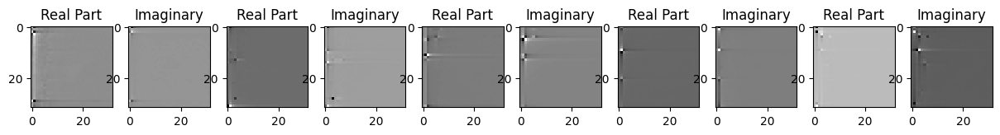

Saving model to: /content/drive/MyDrive/saved_model/_model_86_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.611070144991256
Correlation is  0.7556890845298767
Epoch-88 lr: 0.001
Loss:  4.779721166414674e-06
torch.Size([5, 2, 32, 32])


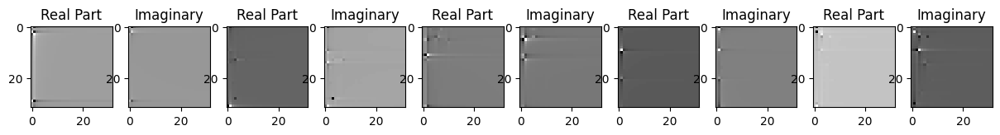

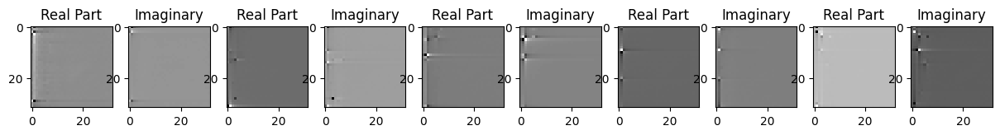

Saving model to: /content/drive/MyDrive/saved_model/_model_87_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.598247432342003
Correlation is  0.7557226419448853
Epoch-89 lr: 0.001
Loss:  4.76151308248518e-06
torch.Size([5, 2, 32, 32])


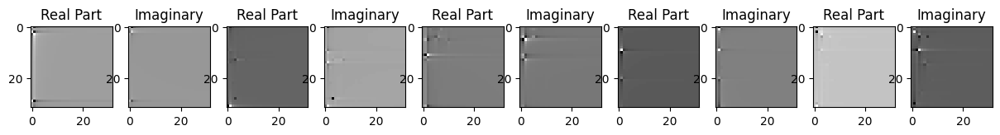

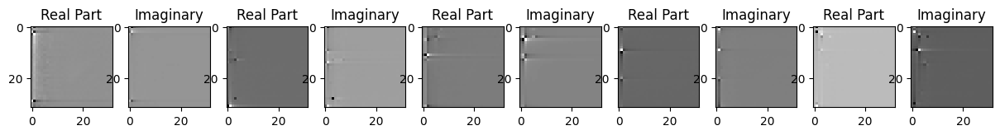

Saving model to: /content/drive/MyDrive/saved_model/_model_88_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.616227399843513
Correlation is  0.7557256817817688
Epoch-90 lr: 0.001
Loss:  4.7584485400875565e-06
torch.Size([5, 2, 32, 32])


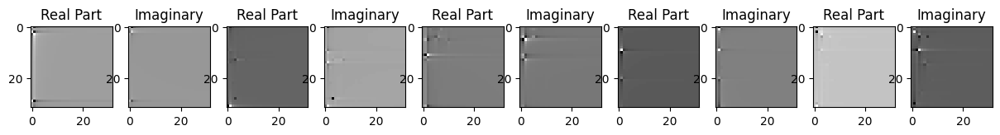

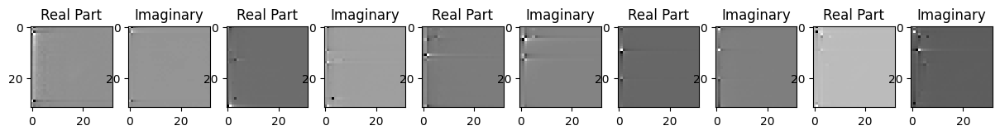

Saving model to: /content/drive/MyDrive/saved_model/_model_89_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.617982788507863
Correlation is  0.7557289600372314
Epoch-91 lr: 0.001
Loss:  4.790311777469469e-06
torch.Size([5, 2, 32, 32])


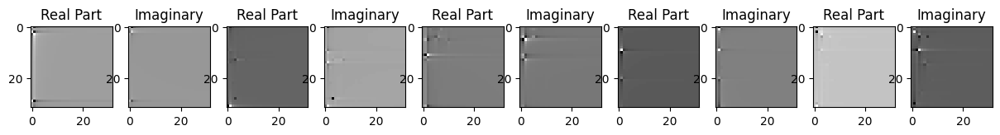

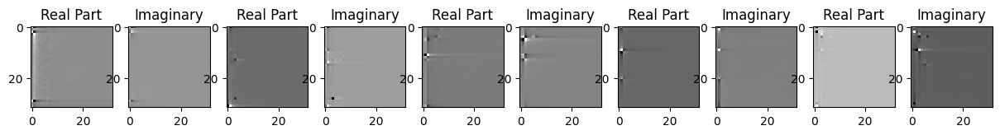

Saving model to: /content/drive/MyDrive/saved_model/_model_90_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.584925736788577
Correlation is  0.7556938529014587
Epoch-92 lr: 0.001
Loss:  4.740833901450969e-06
torch.Size([5, 2, 32, 32])


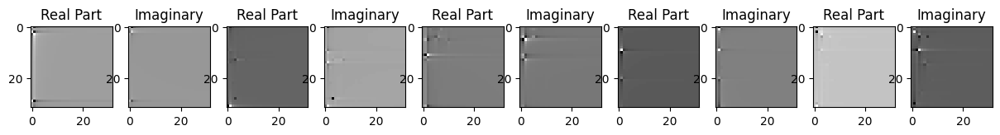

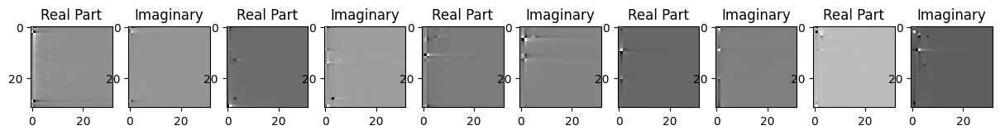

Saving model to: /content/drive/MyDrive/saved_model/_model_91_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.635672135983647
Correlation is  0.7557670474052429
Epoch-93 lr: 0.001
Loss:  4.718137915915577e-06
torch.Size([5, 2, 32, 32])


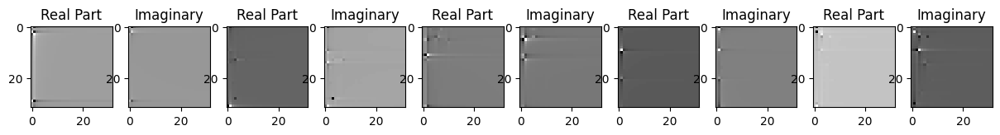

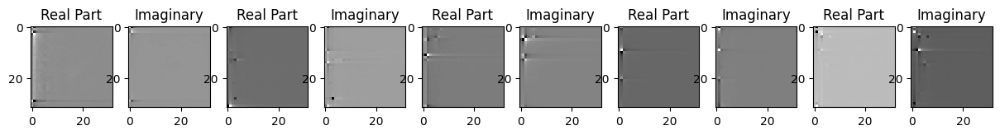

Saving model to: /content/drive/MyDrive/saved_model/_model_92_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.659401112712935
Correlation is  0.7557525634765625
Epoch-94 lr: 0.001
Loss:  4.801871000381652e-06
torch.Size([5, 2, 32, 32])


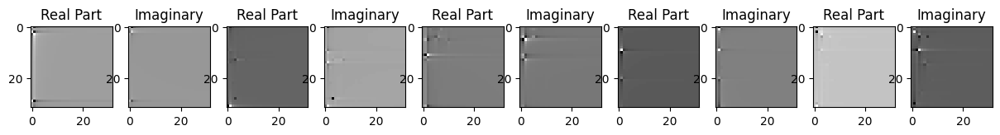

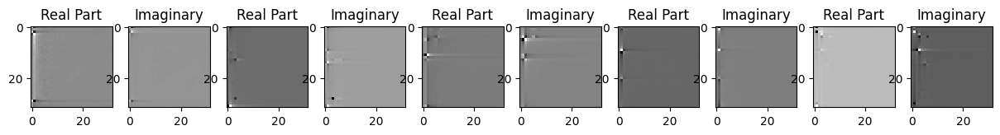

Saving model to: /content/drive/MyDrive/saved_model/_model_93_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.572716862681954
Correlation is  0.7556530237197876
Epoch-95 lr: 0.001
Loss:  4.830572834180202e-06
torch.Size([5, 2, 32, 32])


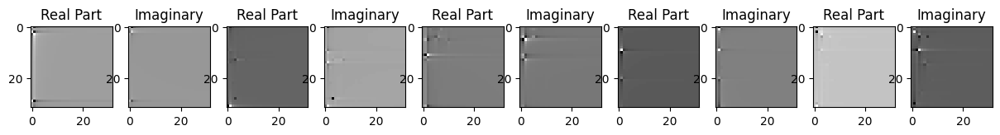

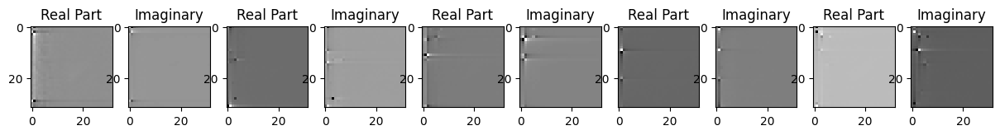

Saving model to: /content/drive/MyDrive/saved_model/_model_94_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.543275426531345
Correlation is  0.7556033730506897
Epoch-96 lr: 0.001
Loss:  4.779348728334298e-06
torch.Size([5, 2, 32, 32])


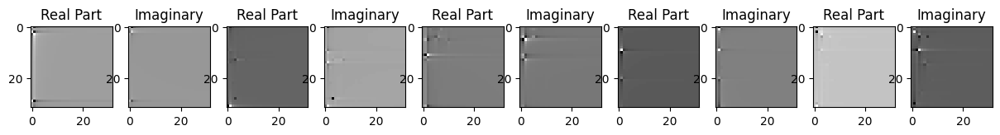

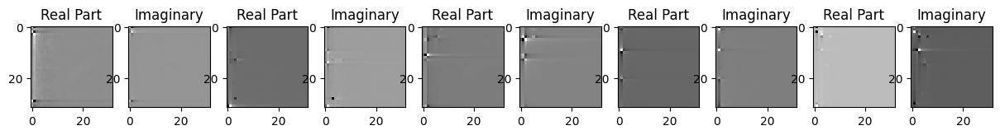

Saving model to: /content/drive/MyDrive/saved_model/_model_95_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.596125537432997
Correlation is  0.7556641697883606
Epoch-97 lr: 0.001
Loss:  4.773549790115794e-06
torch.Size([5, 2, 32, 32])


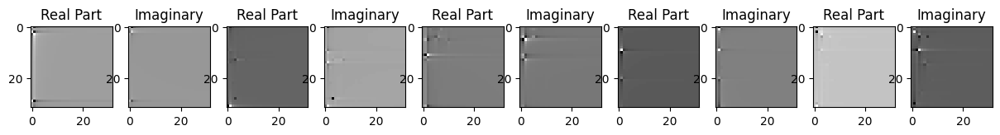

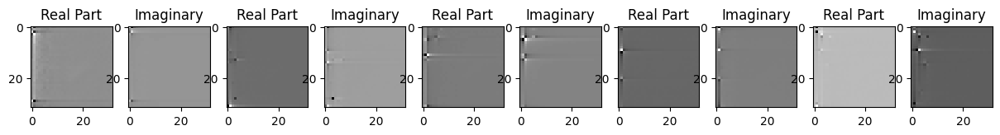

Saving model to: /content/drive/MyDrive/saved_model/_model_96_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.601083158816962
Correlation is  0.7557395100593567
Epoch-98 lr: 0.001
Loss:  4.780470590048935e-06
torch.Size([5, 2, 32, 32])


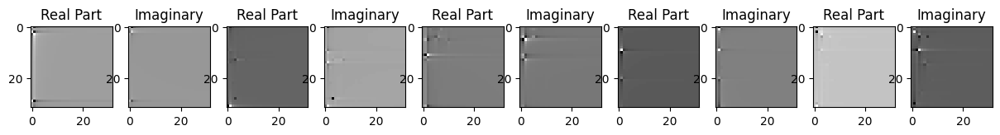

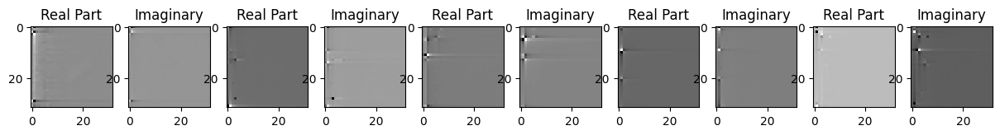

Saving model to: /content/drive/MyDrive/saved_model/_model_97_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.593738723344686
Correlation is  0.7556579113006592
Epoch-99 lr: 0.001
Loss:  4.713531325251097e-06
torch.Size([5, 2, 32, 32])


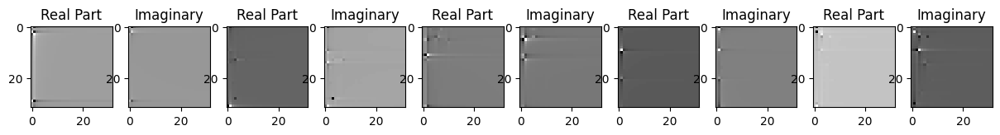

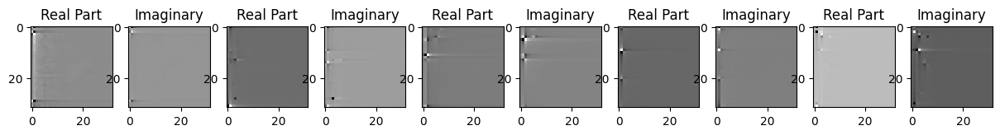

Saving model to: /content/drive/MyDrive/saved_model/_model_98_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.661893145642104
Correlation is  0.7557154893875122
Epoch-100 lr: 0.001
Loss:  4.732249180960935e-06
torch.Size([5, 2, 32, 32])


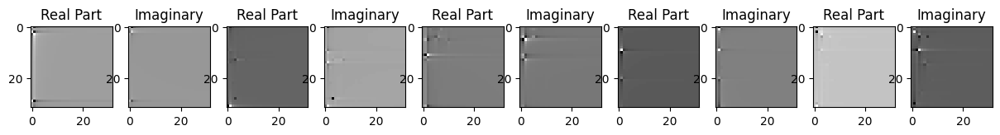

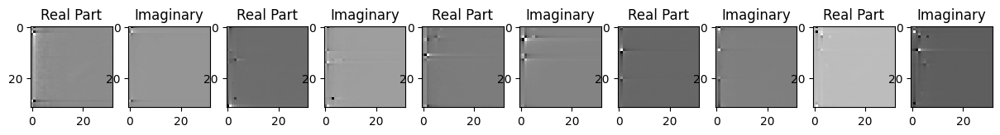

Saving model to: /content/drive/MyDrive/saved_model/_model_99_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.640604759792996
Correlation is  0.7556775212287903
Epoch-101 lr: 0.0009000000000000001
Loss:  4.504440312302904e-06
torch.Size([5, 2, 32, 32])


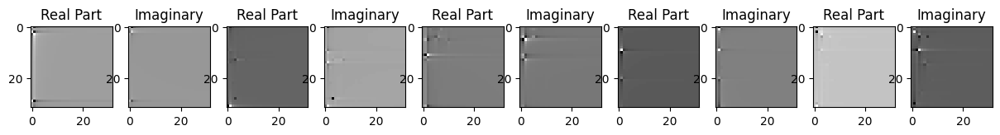

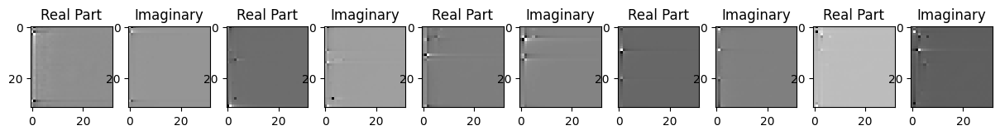

Saving model to: /content/drive/MyDrive/saved_model/_model_100_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.879027099109237
Correlation is  0.7561243176460266
Epoch-102 lr: 0.0009000000000000001
Loss:  4.508413439907599e-06
torch.Size([5, 2, 32, 32])


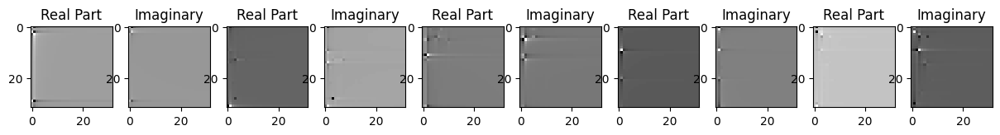

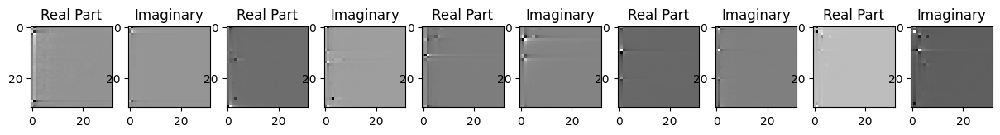

Saving model to: /content/drive/MyDrive/saved_model/_model_101_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.87389839003079
Correlation is  0.7561660408973694
Epoch-103 lr: 0.0009000000000000001
Loss:  4.491832896746928e-06
torch.Size([5, 2, 32, 32])


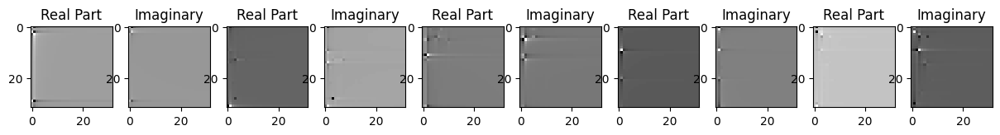

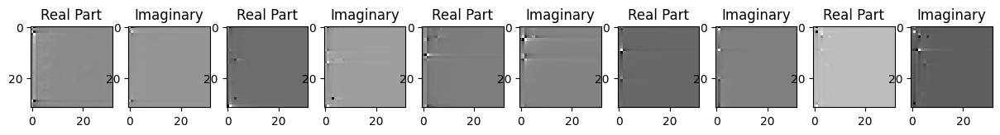

Saving model to: /content/drive/MyDrive/saved_model/_model_102_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.890475496991385
Correlation is  0.7562031745910645
Epoch-104 lr: 0.0009000000000000001
Loss:  4.471549345907988e-06
torch.Size([5, 2, 32, 32])


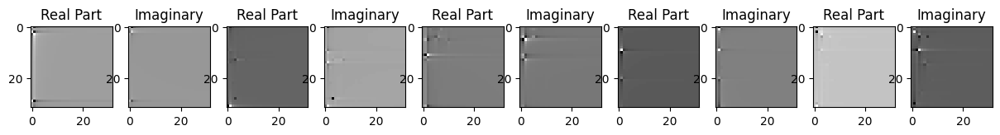

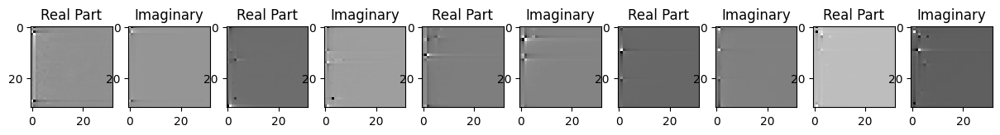

Saving model to: /content/drive/MyDrive/saved_model/_model_103_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.913245166250576
Correlation is  0.7561906576156616
Epoch-105 lr: 0.0009000000000000001
Loss:  4.454027475730982e-06
torch.Size([5, 2, 32, 32])


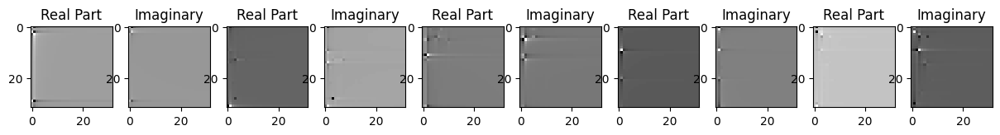

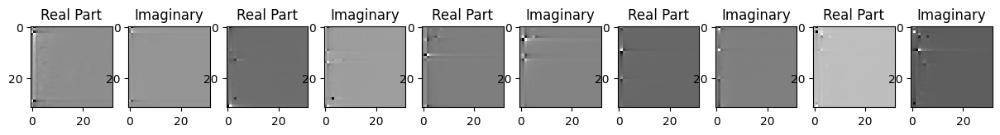

Saving model to: /content/drive/MyDrive/saved_model/_model_104_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.933362521956944
Correlation is  0.7562081813812256
Epoch-106 lr: 0.0009000000000000001
Loss:  4.437312327354448e-06
torch.Size([5, 2, 32, 32])


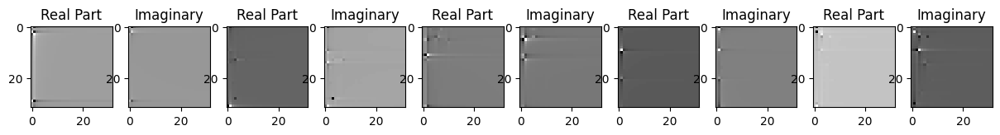

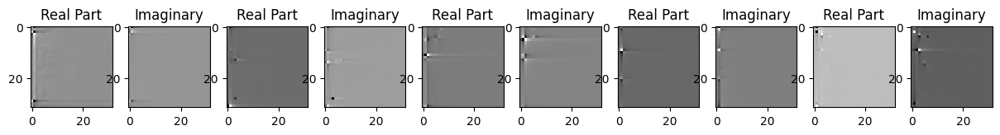

Saving model to: /content/drive/MyDrive/saved_model/_model_105_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.94975357997344
Correlation is  0.7562119960784912
Epoch-107 lr: 0.0009000000000000001
Loss:  4.423365680850111e-06
torch.Size([5, 2, 32, 32])


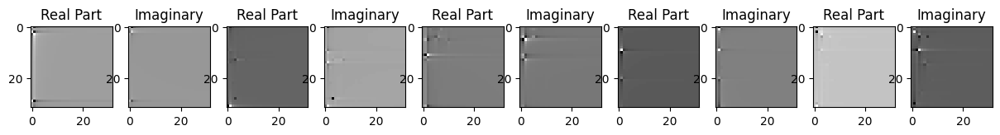

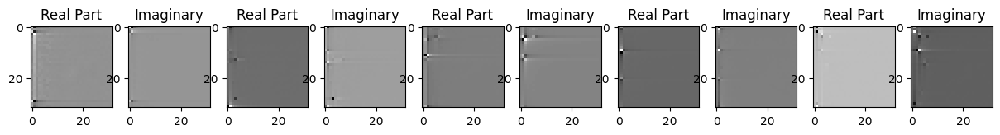

Saving model to: /content/drive/MyDrive/saved_model/_model_106_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.9649070114327
Correlation is  0.7561860084533691
Epoch-108 lr: 0.0009000000000000001
Loss:  4.392747996462276e-06
torch.Size([5, 2, 32, 32])


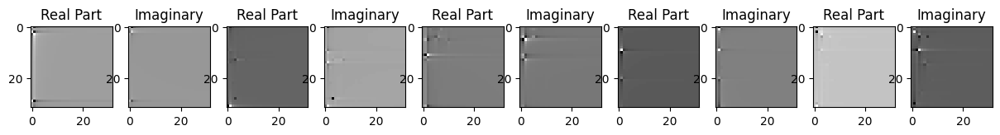

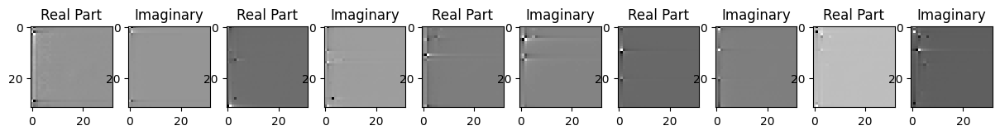

Saving model to: /content/drive/MyDrive/saved_model/_model_107_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -19.99805908322295
Correlation is  0.7562119364738464
Epoch-109 lr: 0.0009000000000000001
Loss:  4.369281214167131e-06
torch.Size([5, 2, 32, 32])


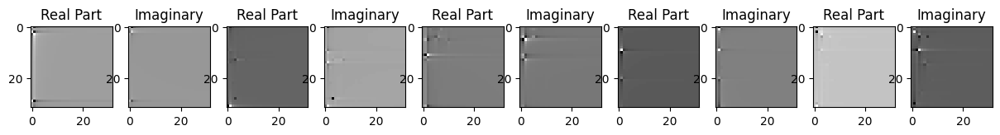

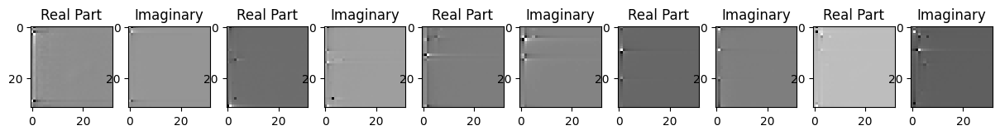

Saving model to: /content/drive/MyDrive/saved_model/_model_108_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.025283247386643
Correlation is  0.7562635540962219
Epoch-110 lr: 0.0009000000000000001
Loss:  4.388656634546351e-06
torch.Size([5, 2, 32, 32])


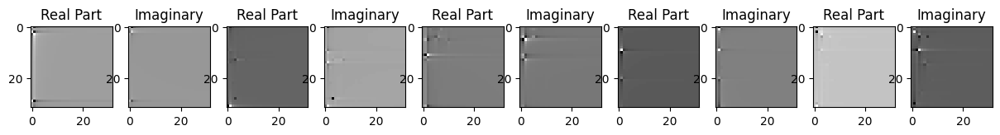

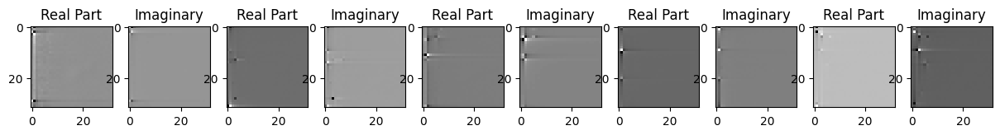

Saving model to: /content/drive/MyDrive/saved_model/_model_109_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.002009960406987
Correlation is  0.7562101483345032
Epoch-111 lr: 0.0009000000000000001
Loss:  4.36690015703789e-06
torch.Size([5, 2, 32, 32])


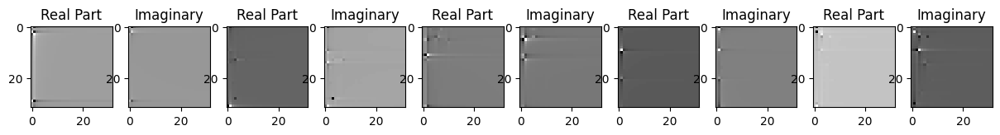

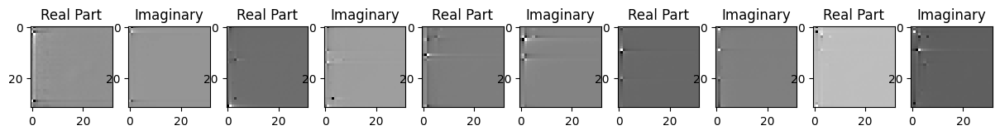

Saving model to: /content/drive/MyDrive/saved_model/_model_110_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.02647949175816
Correlation is  0.7562597393989563
Epoch-112 lr: 0.0009000000000000001
Loss:  4.361847913969541e-06
torch.Size([5, 2, 32, 32])


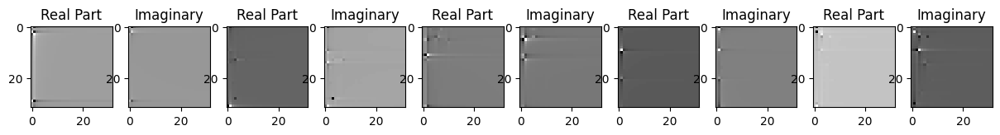

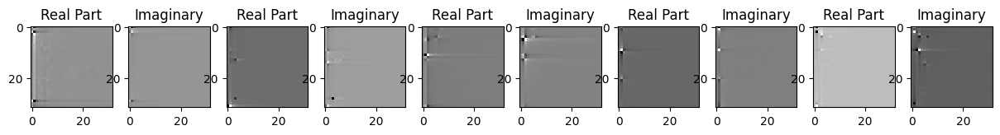

Saving model to: /content/drive/MyDrive/saved_model/_model_111_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.031988501098255
Correlation is  0.756260335445404
Epoch-113 lr: 0.0009000000000000001
Loss:  4.3423037823231425e-06
torch.Size([5, 2, 32, 32])


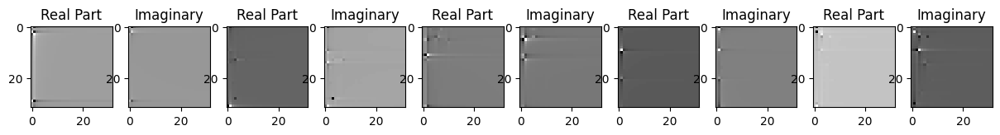

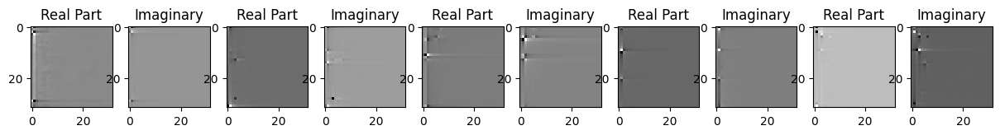

Saving model to: /content/drive/MyDrive/saved_model/_model_112_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.052455207565476
Correlation is  0.7562904357910156
Epoch-114 lr: 0.0009000000000000001
Loss:  4.3372892832849175e-06
torch.Size([5, 2, 32, 32])


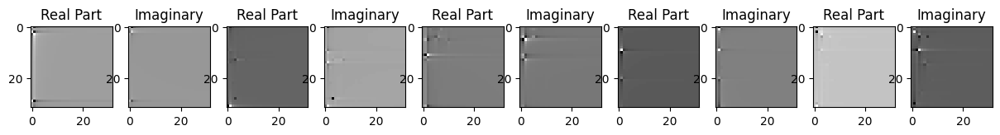

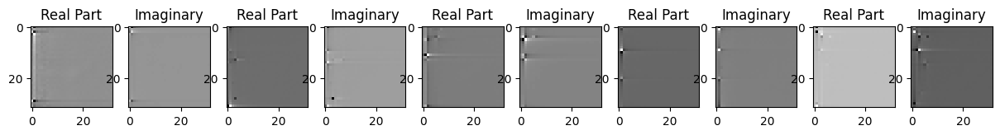

Saving model to: /content/drive/MyDrive/saved_model/_model_113_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.057525100909075
Correlation is  0.7563275098800659
Epoch-115 lr: 0.0009000000000000001
Loss:  4.337260634201812e-06
torch.Size([5, 2, 32, 32])


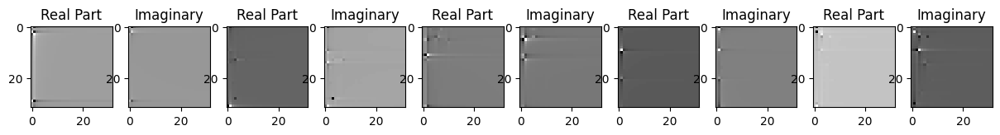

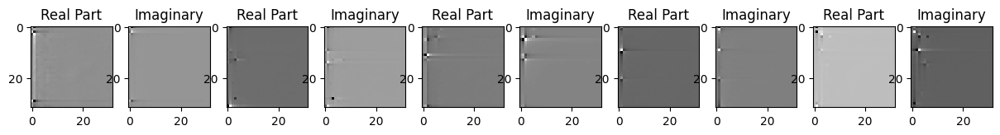

Saving model to: /content/drive/MyDrive/saved_model/_model_114_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.056228902954242
Correlation is  0.7562576532363892
Epoch-116 lr: 0.0009000000000000001
Loss:  4.337103746365756e-06
torch.Size([5, 2, 32, 32])


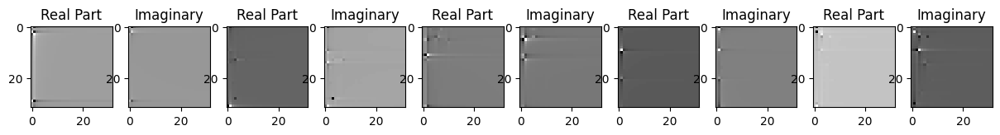

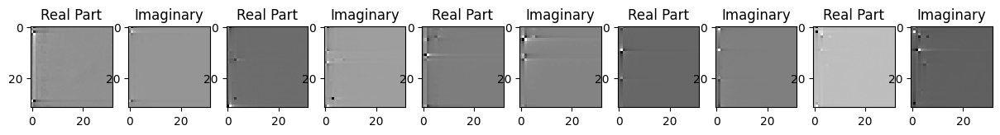

Saving model to: /content/drive/MyDrive/saved_model/_model_115_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.055852778815293
Correlation is  0.7562543749809265
Epoch-117 lr: 0.0009000000000000001
Loss:  4.305421043682145e-06
torch.Size([5, 2, 32, 32])


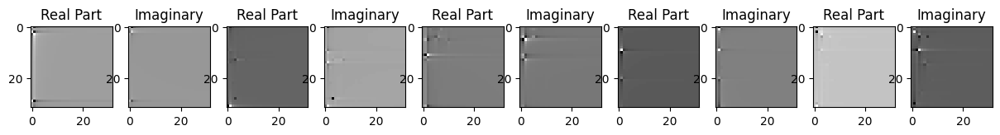

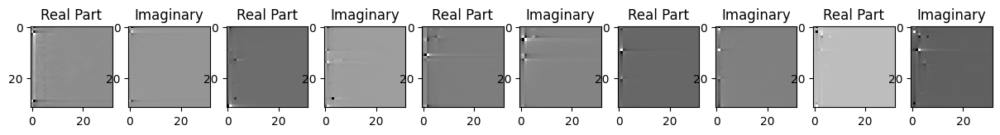

Saving model to: /content/drive/MyDrive/saved_model/_model_116_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.09299509253001
Correlation is  0.7563090920448303
Epoch-118 lr: 0.0009000000000000001
Loss:  4.298952717363136e-06
torch.Size([5, 2, 32, 32])


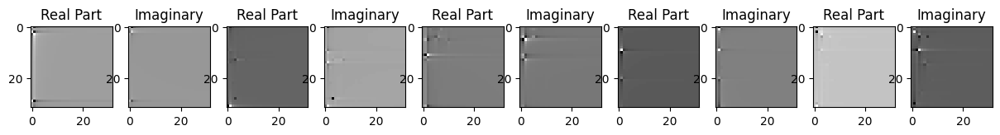

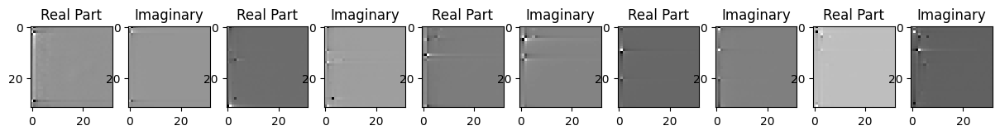

Saving model to: /content/drive/MyDrive/saved_model/_model_117_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.099843867574293
Correlation is  0.7563475966453552
Epoch-119 lr: 0.0009000000000000001
Loss:  4.293721303838538e-06
torch.Size([5, 2, 32, 32])


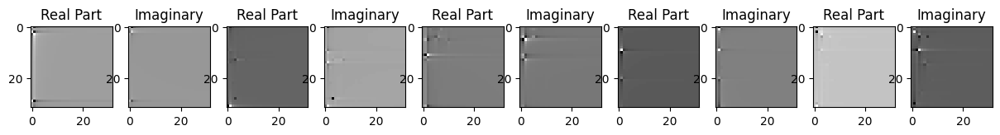

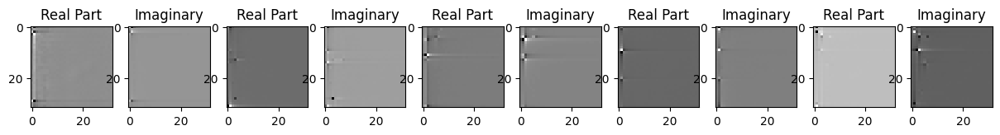

Saving model to: /content/drive/MyDrive/saved_model/_model_118_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.104451908491882
Correlation is  0.7563585638999939
Epoch-120 lr: 0.0009000000000000001
Loss:  4.284701390133705e-06
torch.Size([5, 2, 32, 32])


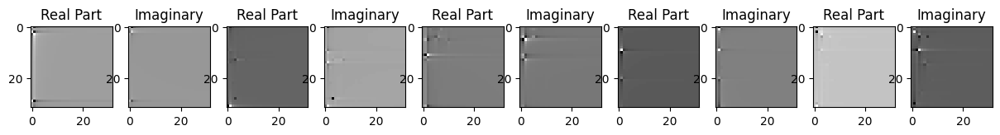

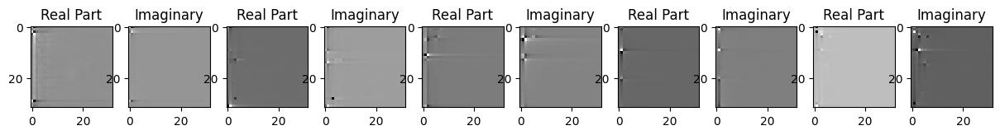

Saving model to: /content/drive/MyDrive/saved_model/_model_119_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.114524367246553
Correlation is  0.7563919425010681
Epoch-121 lr: 0.0009000000000000001
Loss:  4.311808879720047e-06
torch.Size([5, 2, 32, 32])


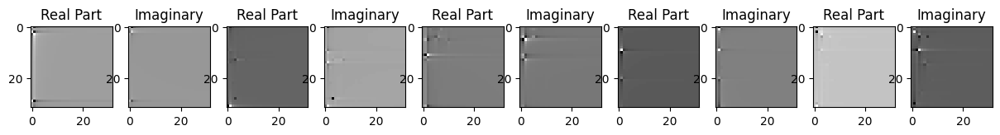

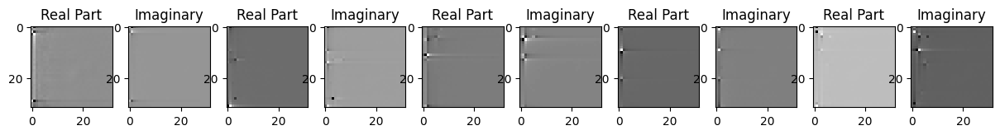

Saving model to: /content/drive/MyDrive/saved_model/_model_120_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.08278975322429
Correlation is  0.7563546895980835
Epoch-122 lr: 0.0009000000000000001
Loss:  4.284248007024871e-06
torch.Size([5, 2, 32, 32])


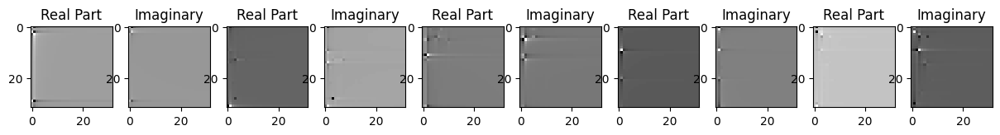

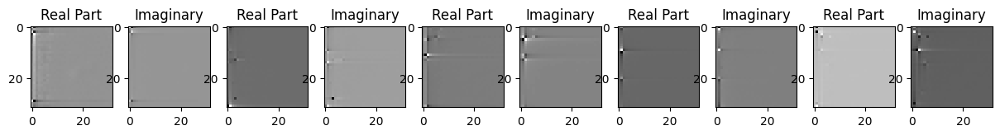

Saving model to: /content/drive/MyDrive/saved_model/_model_121_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.113377941417475
Correlation is  0.7563963532447815
Epoch-123 lr: 0.0009000000000000001
Loss:  4.281331257516285e-06
torch.Size([5, 2, 32, 32])


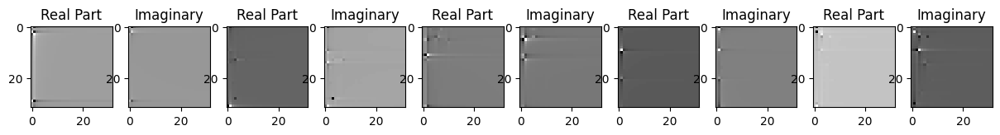

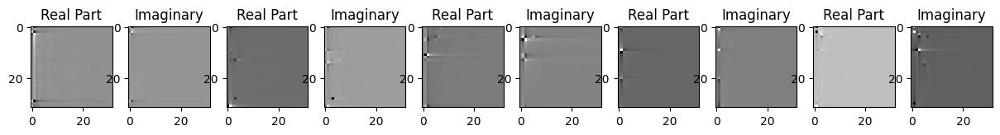

Saving model to: /content/drive/MyDrive/saved_model/_model_122_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.11557971188796
Correlation is  0.756331205368042
Epoch-124 lr: 0.0009000000000000001
Loss:  4.24423933509388e-06
torch.Size([5, 2, 32, 32])


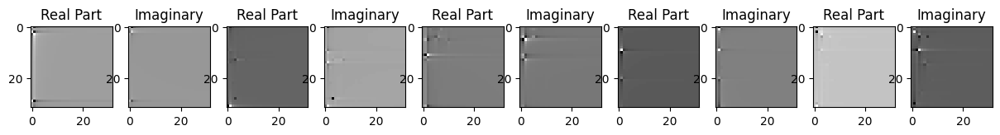

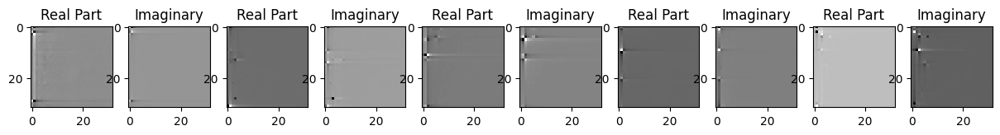

Saving model to: /content/drive/MyDrive/saved_model/_model_123_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.160244383660174
Correlation is  0.7564123868942261
Epoch-125 lr: 0.0009000000000000001
Loss:  4.251425707479939e-06
torch.Size([5, 2, 32, 32])


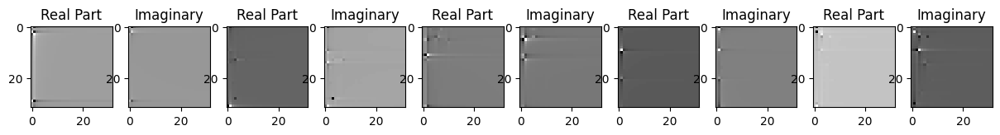

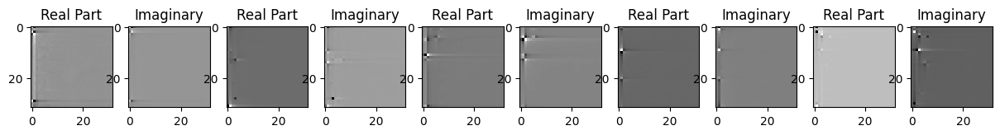

Saving model to: /content/drive/MyDrive/saved_model/_model_124_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.15020445937654
Correlation is  0.7564074993133545
Epoch-126 lr: 0.0009000000000000001
Loss:  4.228617399348877e-06
torch.Size([5, 2, 32, 32])


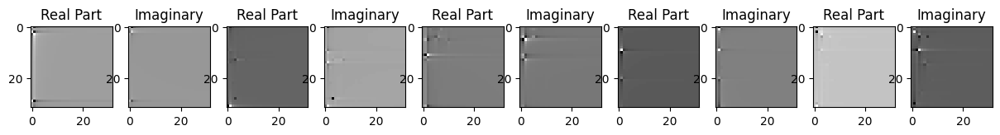

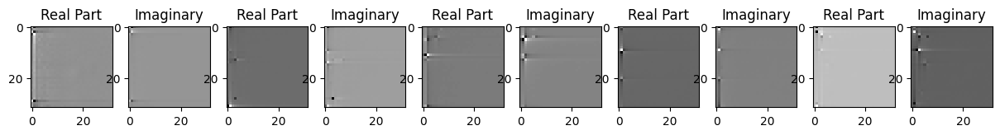

Saving model to: /content/drive/MyDrive/saved_model/_model_125_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.176288204693613
Correlation is  0.7564359903335571
Epoch-127 lr: 0.0009000000000000001
Loss:  4.188579168840079e-06
torch.Size([5, 2, 32, 32])


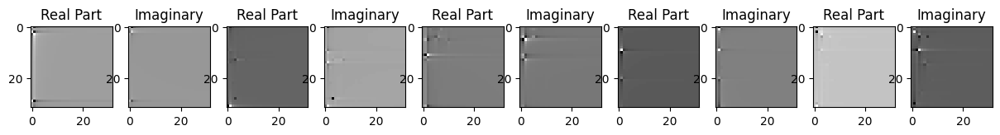

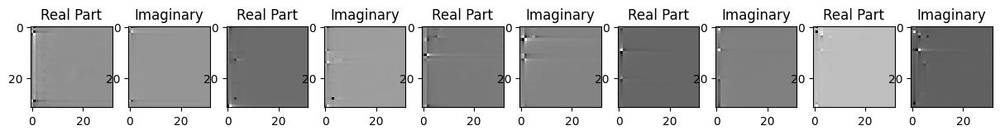

Saving model to: /content/drive/MyDrive/saved_model/_model_126_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.22331036615496
Correlation is  0.7564566135406494
Epoch-128 lr: 0.0009000000000000001
Loss:  4.177735718258191e-06
torch.Size([5, 2, 32, 32])


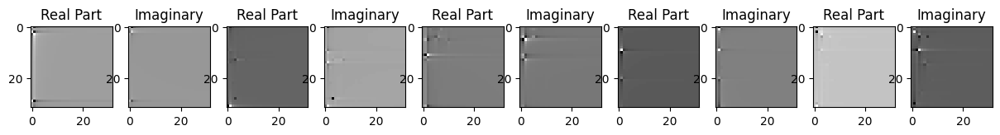

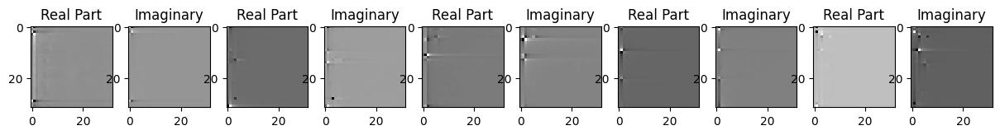

Saving model to: /content/drive/MyDrive/saved_model/_model_127_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.233280210789452
Correlation is  0.7564651370048523
Epoch-129 lr: 0.0009000000000000001
Loss:  4.169540716247866e-06
torch.Size([5, 2, 32, 32])


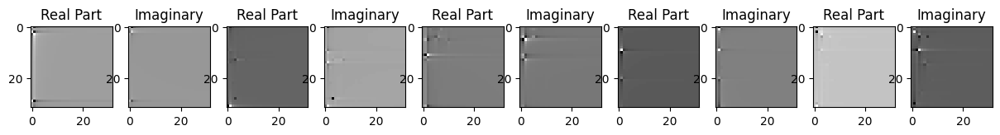

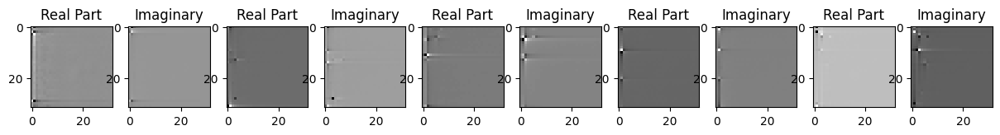

Saving model to: /content/drive/MyDrive/saved_model/_model_128_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.24191930980966
Correlation is  0.7564805746078491
Epoch-130 lr: 0.0009000000000000001
Loss:  4.1487787711957935e-06
torch.Size([5, 2, 32, 32])


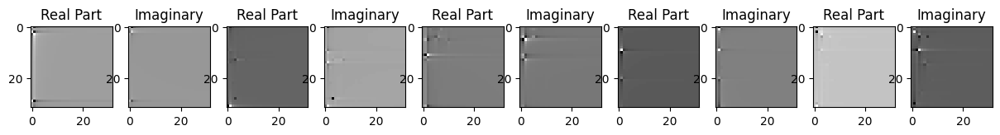

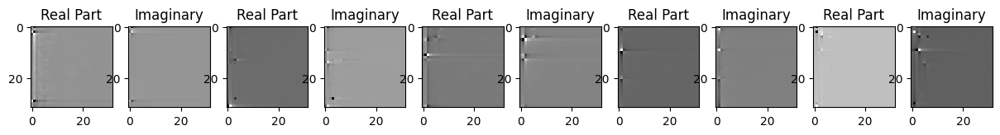

Saving model to: /content/drive/MyDrive/saved_model/_model_129_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.264751377503927
Correlation is  0.756508469581604
Epoch-131 lr: 0.0009000000000000001
Loss:  4.1146372495859396e-06
torch.Size([5, 2, 32, 32])


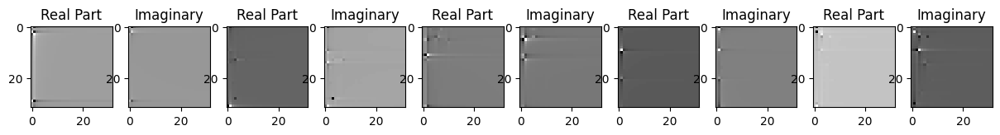

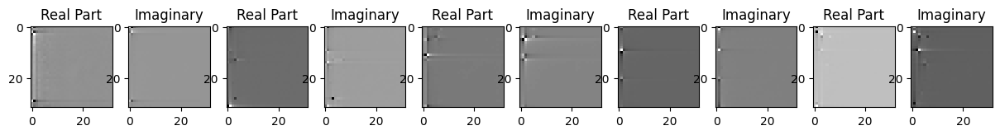

Saving model to: /content/drive/MyDrive/saved_model/_model_130_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.30455336525012
Correlation is  0.7565392255783081
Epoch-132 lr: 0.0009000000000000001
Loss:  4.091499249625485e-06
torch.Size([5, 2, 32, 32])


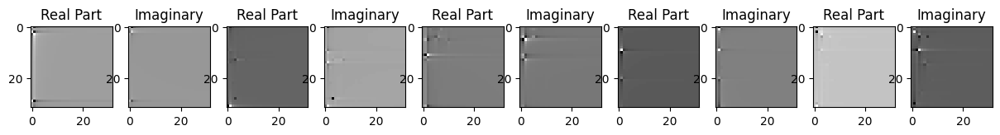

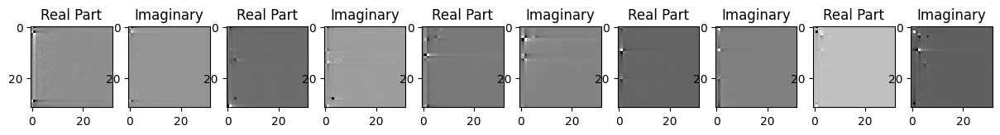

Saving model to: /content/drive/MyDrive/saved_model/_model_131_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.333313734387275
Correlation is  0.756581723690033
Epoch-133 lr: 0.0009000000000000001
Loss:  4.10204347645049e-06
torch.Size([5, 2, 32, 32])


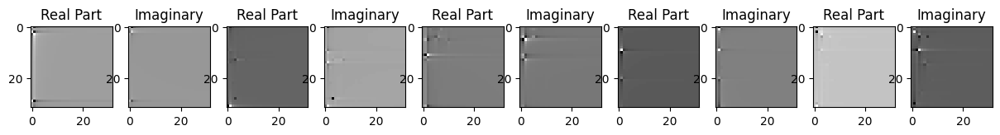

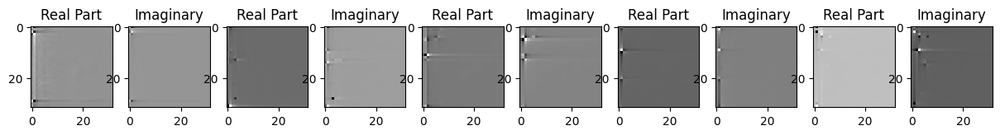

Saving model to: /content/drive/MyDrive/saved_model/_model_132_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.31919486447668
Correlation is  0.7565788626670837
Epoch-134 lr: 0.0009000000000000001
Loss:  4.0597446968604345e-06
torch.Size([5, 2, 32, 32])


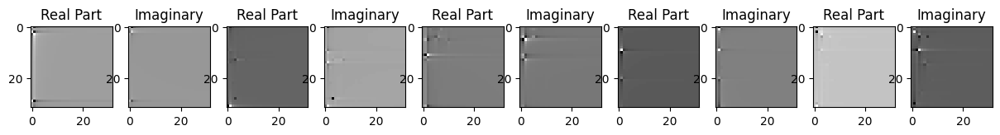

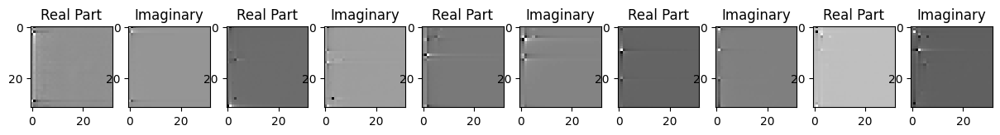

Saving model to: /content/drive/MyDrive/saved_model/_model_133_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.368780675016716
Correlation is  0.7565769553184509
Epoch-135 lr: 0.0009000000000000001
Loss:  4.075138349435292e-06
torch.Size([5, 2, 32, 32])


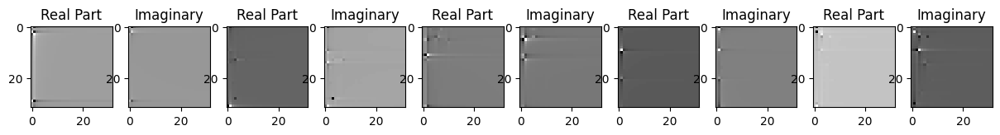

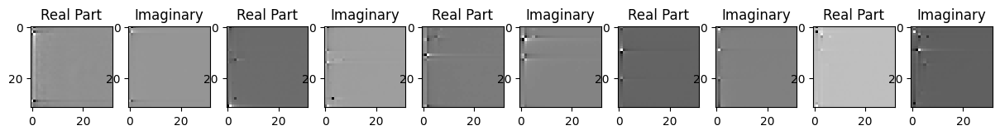

Saving model to: /content/drive/MyDrive/saved_model/_model_134_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.34817319281096
Correlation is  0.7565721869468689
Epoch-136 lr: 0.0009000000000000001
Loss:  4.0430186345474795e-06
torch.Size([5, 2, 32, 32])


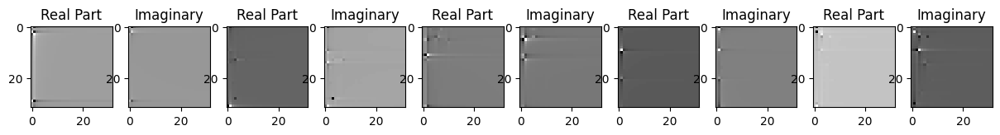

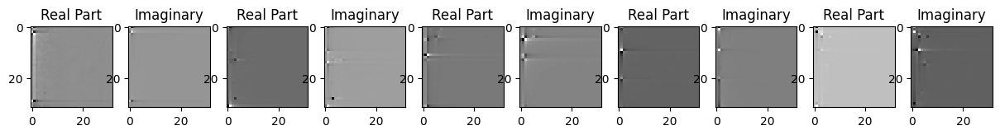

Saving model to: /content/drive/MyDrive/saved_model/_model_135_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.38783915379217
Correlation is  0.7566102743148804
Epoch-137 lr: 0.0009000000000000001
Loss:  4.010227712569758e-06
torch.Size([5, 2, 32, 32])


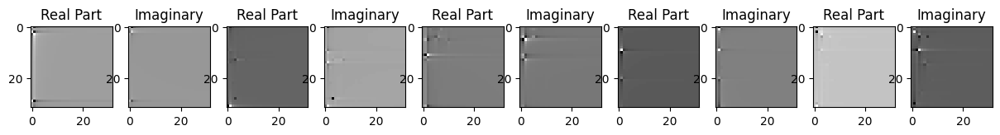

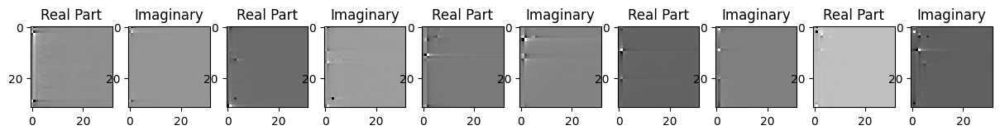

Saving model to: /content/drive/MyDrive/saved_model/_model_136_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.426250809525047
Correlation is  0.7566649317741394
Epoch-138 lr: 0.0009000000000000001
Loss:  4.0243699004349764e-06
torch.Size([5, 2, 32, 32])


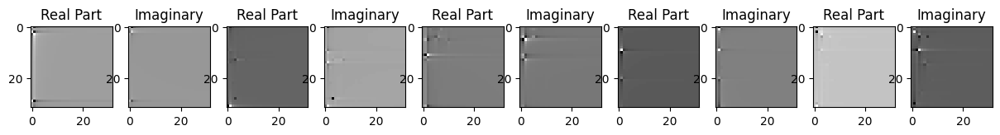

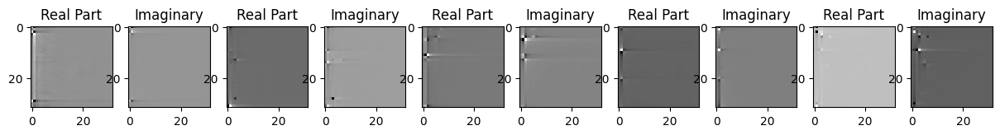

Saving model to: /content/drive/MyDrive/saved_model/_model_137_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.406504143931343
Correlation is  0.7566074132919312
Epoch-139 lr: 0.0009000000000000001
Loss:  4.0081322367768735e-06
torch.Size([5, 2, 32, 32])


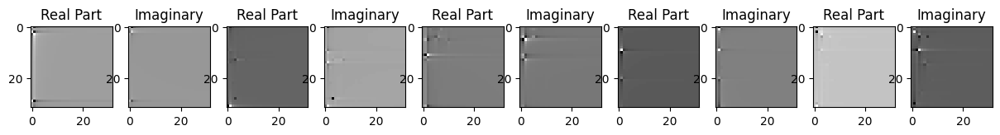

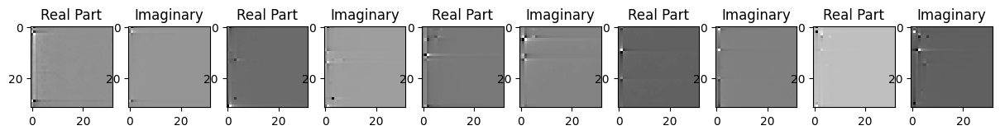

Saving model to: /content/drive/MyDrive/saved_model/_model_138_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.425388876448434
Correlation is  0.7566520571708679
Epoch-140 lr: 0.0009000000000000001
Loss:  3.983511760452529e-06
torch.Size([5, 2, 32, 32])


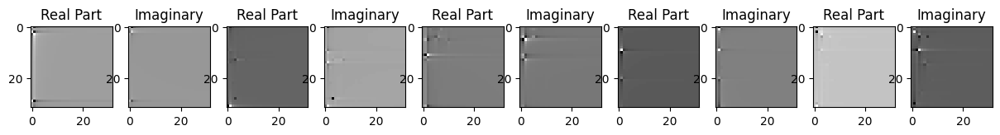

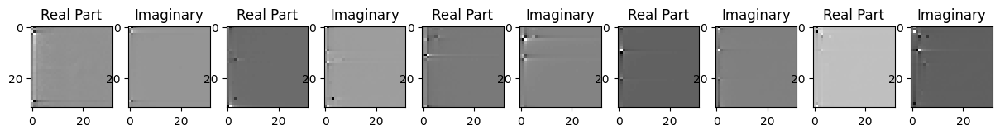

Saving model to: /content/drive/MyDrive/saved_model/_model_139_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.455245081636203
Correlation is  0.7566325068473816
Epoch-141 lr: 0.0009000000000000001
Loss:  3.993924110545777e-06
torch.Size([5, 2, 32, 32])


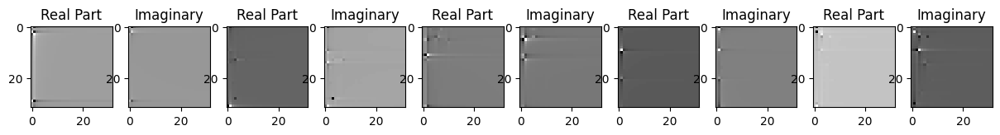

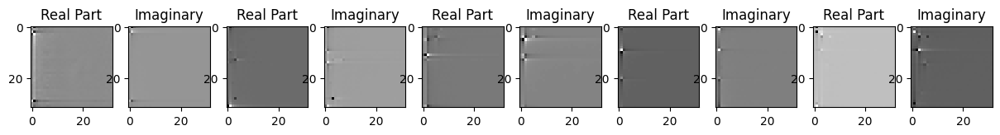

Saving model to: /content/drive/MyDrive/saved_model/_model_140_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.441134952509344
Correlation is  0.7566421627998352
Epoch-142 lr: 0.0009000000000000001
Loss:  3.976855168730253e-06
torch.Size([5, 2, 32, 32])


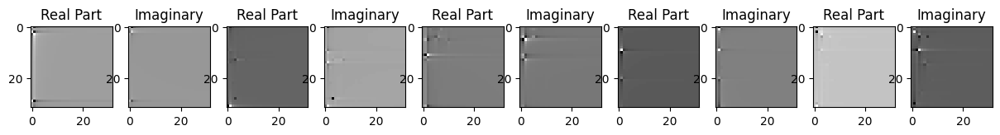

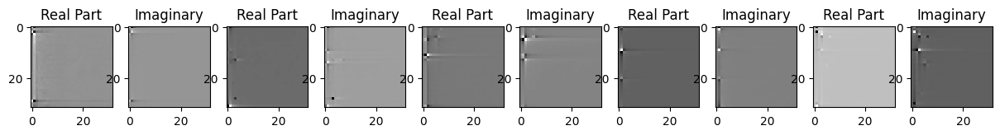

Saving model to: /content/drive/MyDrive/saved_model/_model_141_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.45989871016723
Correlation is  0.7566528916358948
Epoch-143 lr: 0.0009000000000000001
Loss:  3.957812623411883e-06
torch.Size([5, 2, 32, 32])


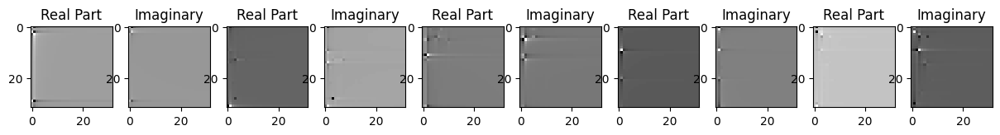

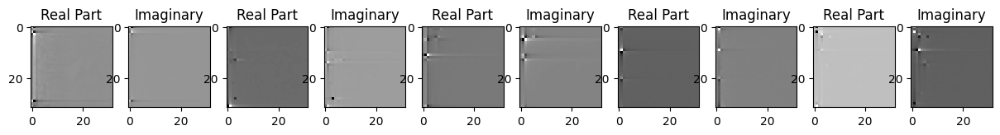

Saving model to: /content/drive/MyDrive/saved_model/_model_142_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.484440557163815
Correlation is  0.7566367983818054
Epoch-144 lr: 0.0009000000000000001
Loss:  3.970527359342668e-06
torch.Size([5, 2, 32, 32])


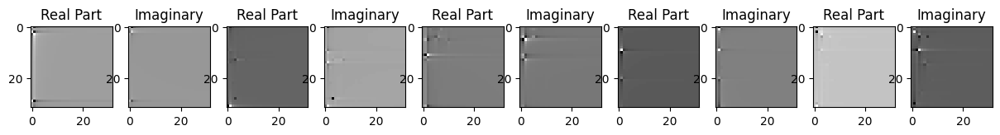

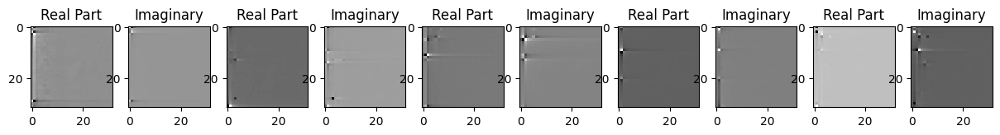

Saving model to: /content/drive/MyDrive/saved_model/_model_143_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.46644379456536
Correlation is  0.7566208839416504
Epoch-145 lr: 0.0009000000000000001
Loss:  3.932876552426023e-06
torch.Size([5, 2, 32, 32])


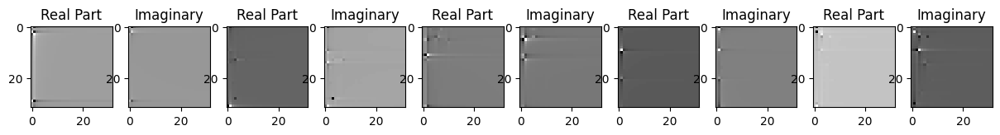

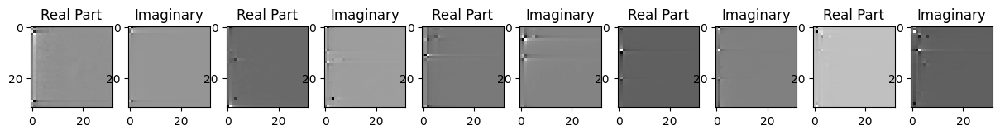

Saving model to: /content/drive/MyDrive/saved_model/_model_144_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.513712073514387
Correlation is  0.7566428780555725
Epoch-146 lr: 0.0009000000000000001
Loss:  3.948441190004814e-06
torch.Size([5, 2, 32, 32])


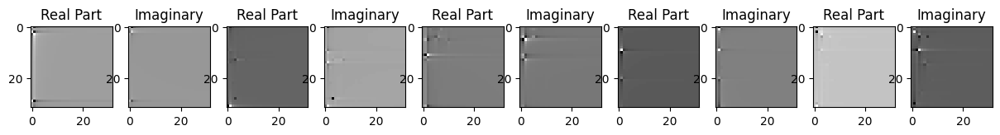

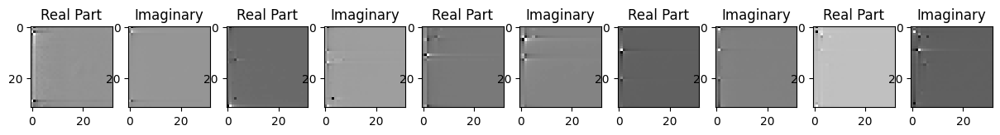

Saving model to: /content/drive/MyDrive/saved_model/_model_145_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.491625590533317
Correlation is  0.7565622925758362
Epoch-147 lr: 0.0009000000000000001
Loss:  3.9686678974248935e-06
torch.Size([5, 2, 32, 32])


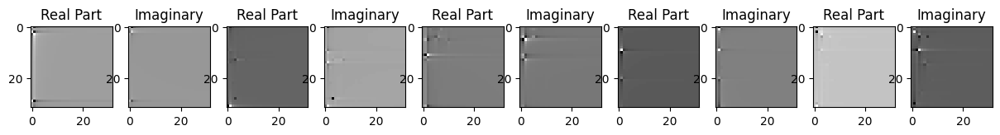

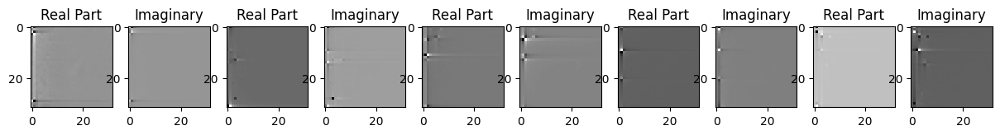

Saving model to: /content/drive/MyDrive/saved_model/_model_146_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.465620222993675
Correlation is  0.7564939856529236
Epoch-148 lr: 0.0009000000000000001
Loss:  4.002775767730782e-06
torch.Size([5, 2, 32, 32])


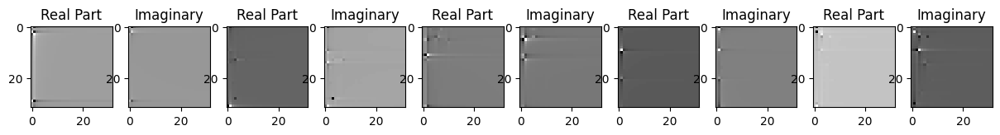

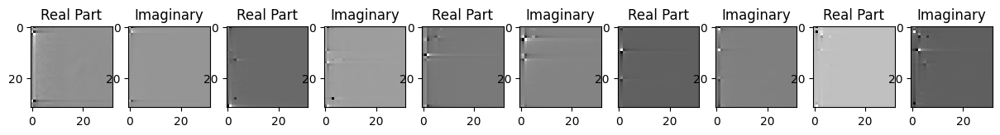

Saving model to: /content/drive/MyDrive/saved_model/_model_147_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.422692648206294
Correlation is  0.7563669681549072
Epoch-149 lr: 0.0009000000000000001
Loss:  4.064693712280132e-06
torch.Size([5, 2, 32, 32])


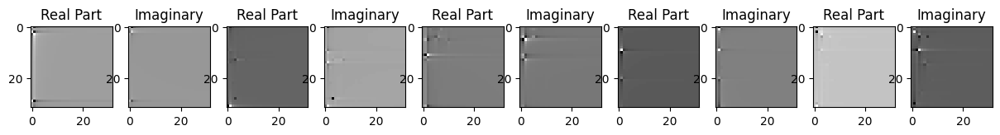

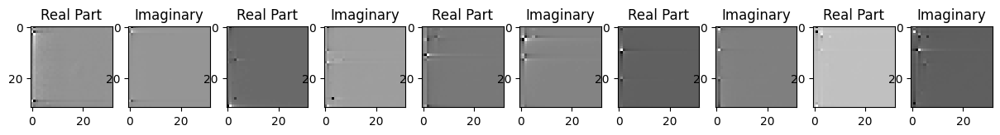

Saving model to: /content/drive/MyDrive/saved_model/_model_148_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.345526216064656
Correlation is  0.7562136650085449
Epoch-150 lr: 0.0009000000000000001
Loss:  4.086703938810388e-06
torch.Size([5, 2, 32, 32])


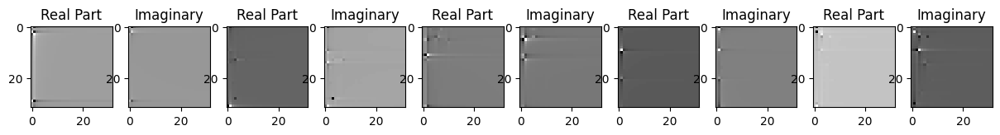

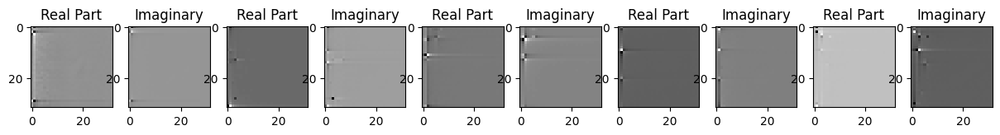

Saving model to: /content/drive/MyDrive/saved_model/_model_149_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.31882312112419
Correlation is  0.756192684173584
Epoch-151 lr: 0.0009000000000000001
Loss:  4.061360868945485e-06
torch.Size([5, 2, 32, 32])


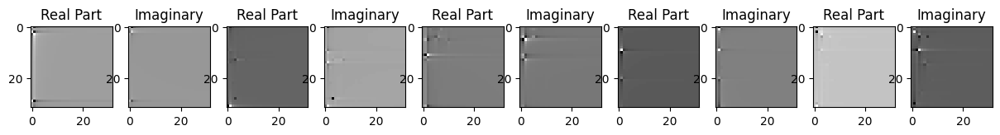

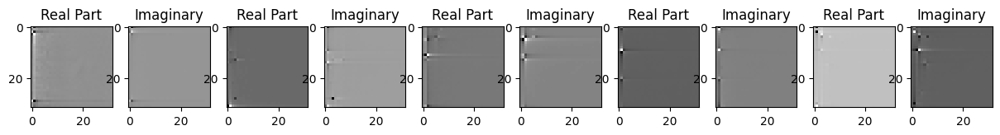

Saving model to: /content/drive/MyDrive/saved_model/_model_150_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.34741775059694
Correlation is  0.756259560585022
Epoch-152 lr: 0.0009000000000000001
Loss:  4.042238288093358e-06
torch.Size([5, 2, 32, 32])


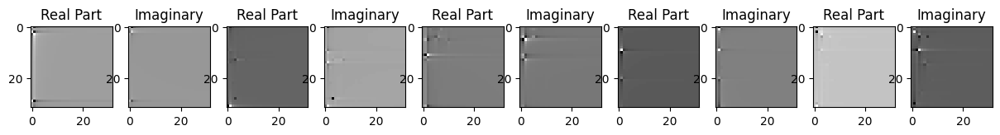

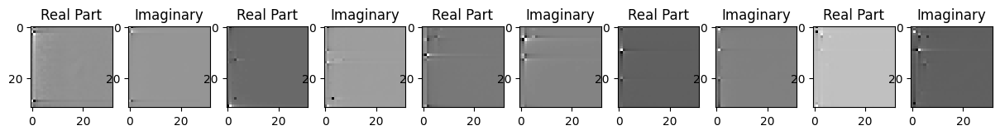

Saving model to: /content/drive/MyDrive/saved_model/_model_151_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.371684195375188
Correlation is  0.7562869787216187
Epoch-153 lr: 0.0009000000000000001
Loss:  4.043070930492831e-06
torch.Size([5, 2, 32, 32])


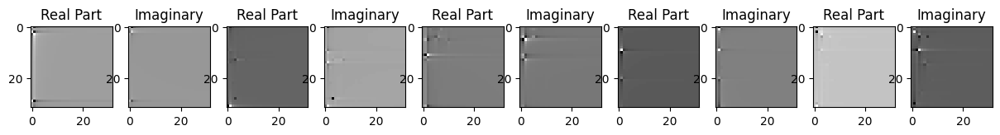

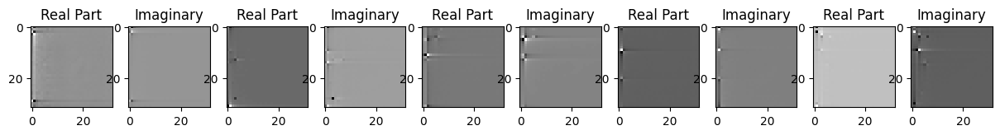

Saving model to: /content/drive/MyDrive/saved_model/_model_152_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.3693090839791
Correlation is  0.7562358379364014
Epoch-154 lr: 0.0009000000000000001
Loss:  4.027387149108108e-06
torch.Size([5, 2, 32, 32])


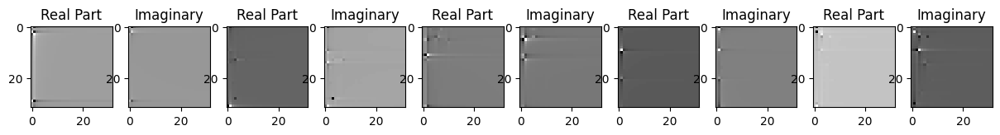

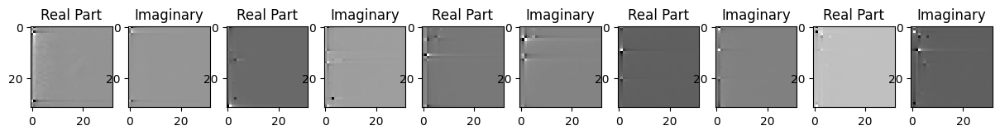

Saving model to: /content/drive/MyDrive/saved_model/_model_153_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.385578957348788
Correlation is  0.7562838792800903
Epoch-155 lr: 0.0009000000000000001
Loss:  4.014946171082556e-06
torch.Size([5, 2, 32, 32])


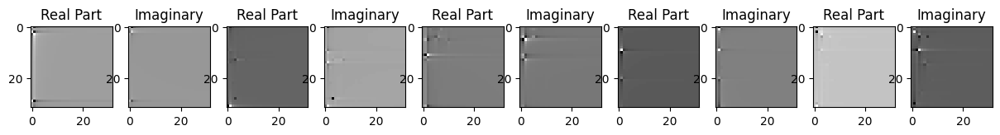

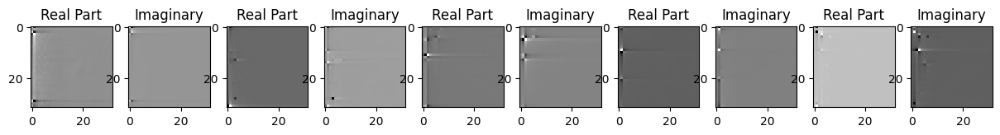

Saving model to: /content/drive/MyDrive/saved_model/_model_154_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.400990348340894
Correlation is  0.7562525272369385
Epoch-156 lr: 0.0009000000000000001
Loss:  3.991359790234128e-06
torch.Size([5, 2, 32, 32])


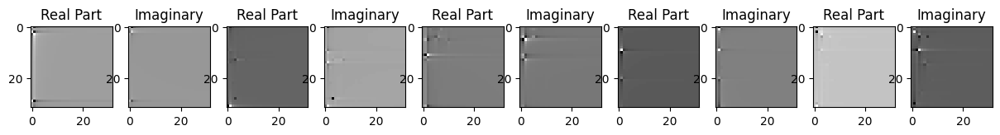

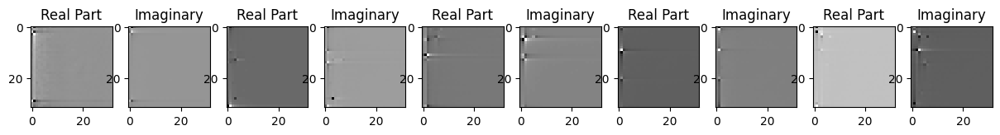

Saving model to: /content/drive/MyDrive/saved_model/_model_155_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.430129393817722
Correlation is  0.7563311457633972
Epoch-157 lr: 0.0009000000000000001
Loss:  3.995688985014567e-06
torch.Size([5, 2, 32, 32])


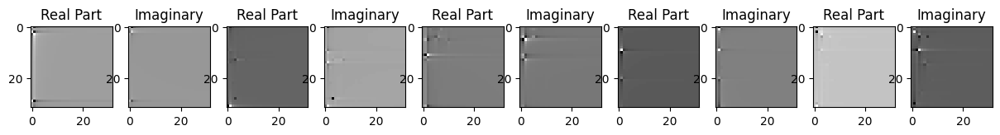

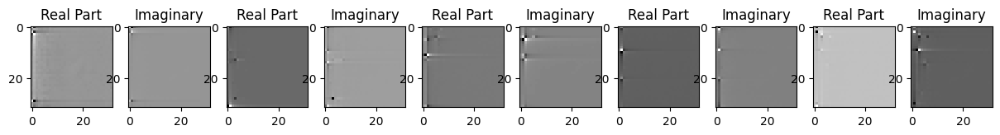

Saving model to: /content/drive/MyDrive/saved_model/_model_156_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.42267927380678
Correlation is  0.7563485503196716
Epoch-158 lr: 0.0009000000000000001
Loss:  3.984947397839278e-06
torch.Size([5, 2, 32, 32])


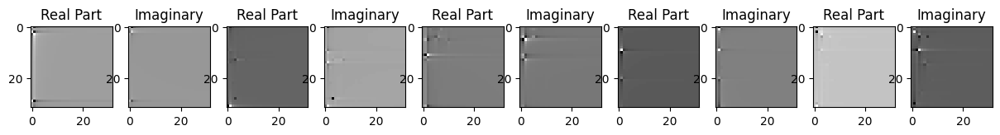

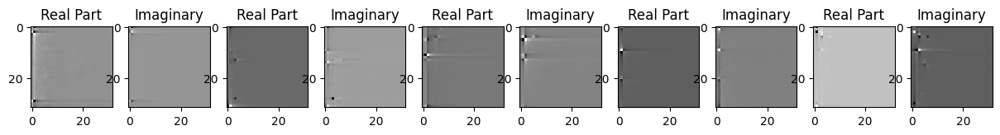

Saving model to: /content/drive/MyDrive/saved_model/_model_157_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.437219692797836
Correlation is  0.7563090324401855
Epoch-159 lr: 0.0009000000000000001
Loss:  3.95839606426307e-06
torch.Size([5, 2, 32, 32])


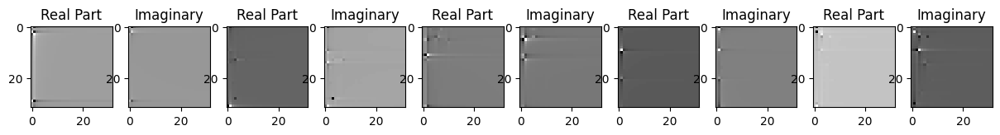

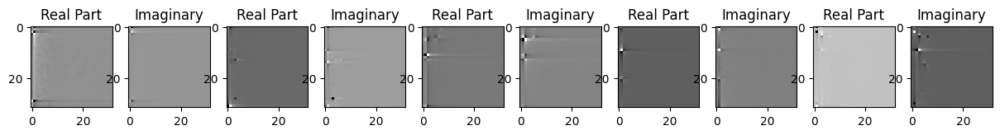

Saving model to: /content/drive/MyDrive/saved_model/_model_158_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.468156278692547
Correlation is  0.756439208984375
Epoch-160 lr: 0.0009000000000000001
Loss:  3.946154265577206e-06
torch.Size([5, 2, 32, 32])


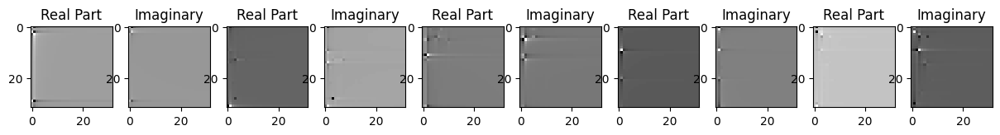

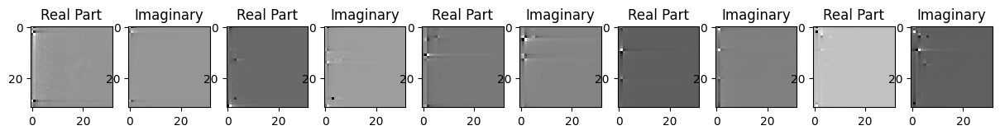

Saving model to: /content/drive/MyDrive/saved_model/_model_159_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.4837627654738
Correlation is  0.7564473152160645
Epoch-161 lr: 0.0009000000000000001
Loss:  3.9367691897496115e-06
torch.Size([5, 2, 32, 32])


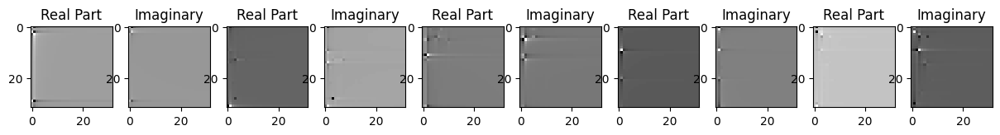

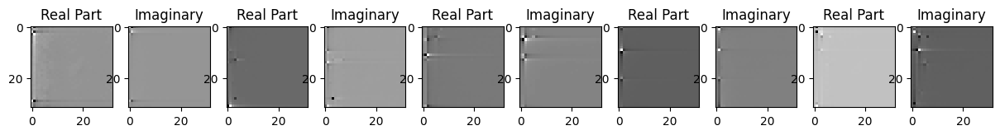

Saving model to: /content/drive/MyDrive/saved_model/_model_160_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.493892726951792
Correlation is  0.7564622759819031
Epoch-162 lr: 0.0009000000000000001
Loss:  3.914933131454745e-06
torch.Size([5, 2, 32, 32])


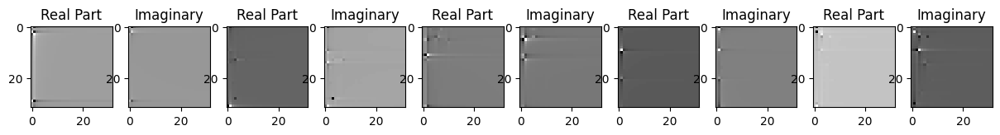

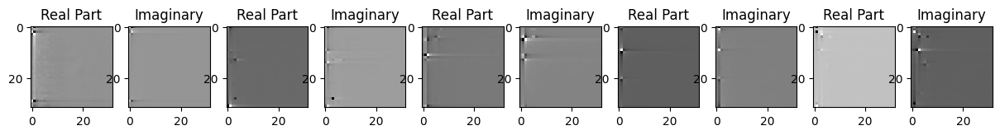

Saving model to: /content/drive/MyDrive/saved_model/_model_161_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.52145240026451
Correlation is  0.7565122842788696
Epoch-163 lr: 0.0009000000000000001
Loss:  3.913000909960829e-06
torch.Size([5, 2, 32, 32])


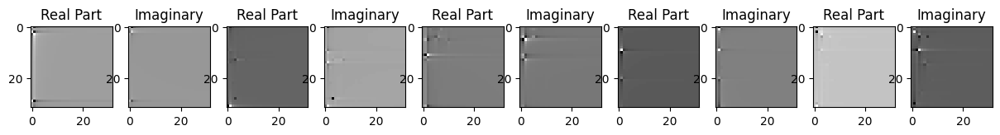

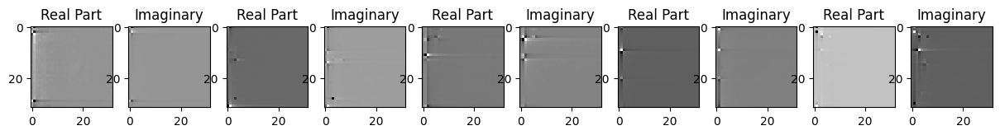

Saving model to: /content/drive/MyDrive/saved_model/_model_162_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.520852256133814
Correlation is  0.7565816044807434
Epoch-164 lr: 0.0009000000000000001
Loss:  3.91912135455641e-06
torch.Size([5, 2, 32, 32])


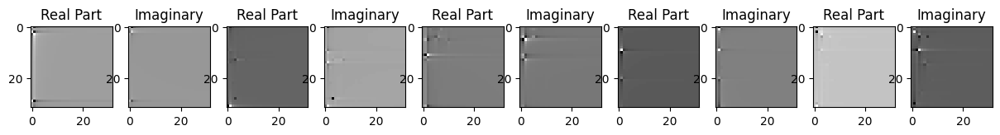

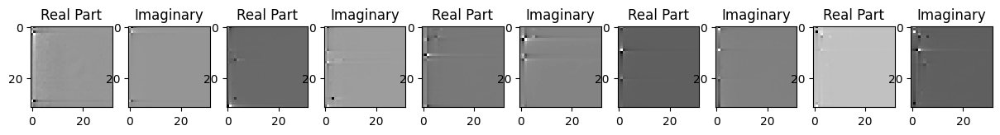

Saving model to: /content/drive/MyDrive/saved_model/_model_163_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.51339112991535
Correlation is  0.7564999461174011
Epoch-165 lr: 0.0009000000000000001
Loss:  3.91180128644919e-06
torch.Size([5, 2, 32, 32])


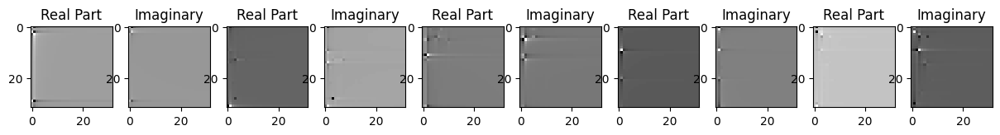

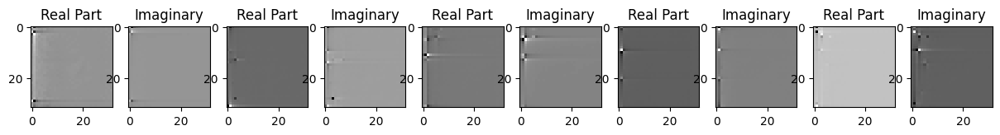

Saving model to: /content/drive/MyDrive/saved_model/_model_164_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.52085316814404
Correlation is  0.7565501928329468
Epoch-166 lr: 0.0009000000000000001
Loss:  3.877685685438337e-06
torch.Size([5, 2, 32, 32])


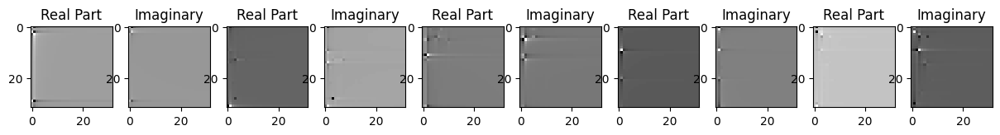

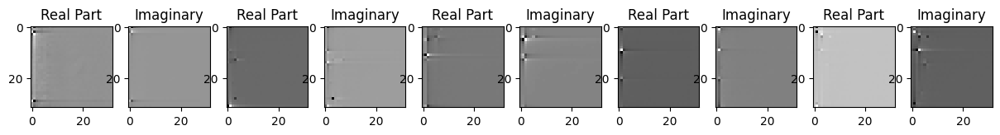

Saving model to: /content/drive/MyDrive/saved_model/_model_165_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.564979851292385
Correlation is  0.7566268444061279
Epoch-167 lr: 0.0009000000000000001
Loss:  3.876552909787279e-06
torch.Size([5, 2, 32, 32])


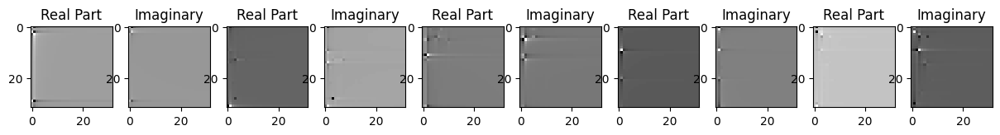

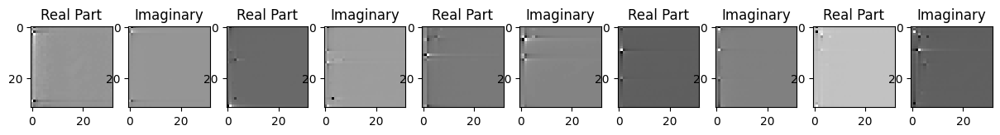

Saving model to: /content/drive/MyDrive/saved_model/_model_166_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.564295822034314
Correlation is  0.7566501498222351
Epoch-168 lr: 0.0009000000000000001
Loss:  3.8679859244439285e-06
torch.Size([5, 2, 32, 32])


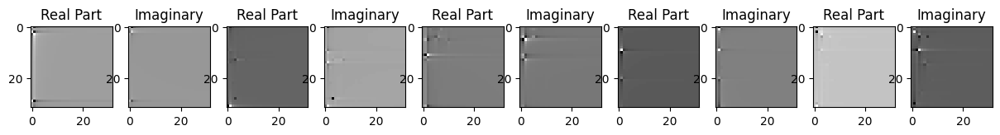

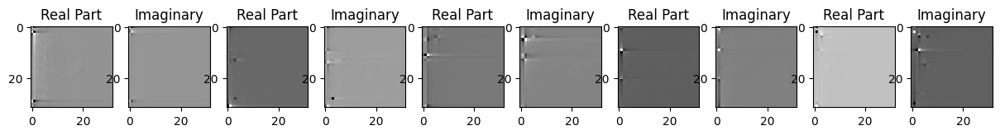

Saving model to: /content/drive/MyDrive/saved_model/_model_167_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.574088854621635
Correlation is  0.756682276725769
Epoch-169 lr: 0.0009000000000000001
Loss:  3.870260115945712e-06
torch.Size([5, 2, 32, 32])


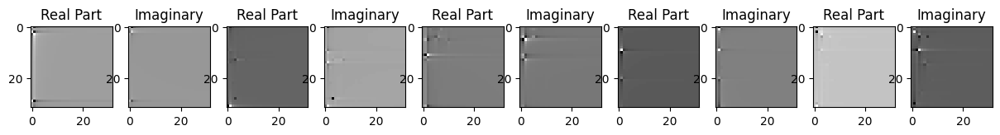

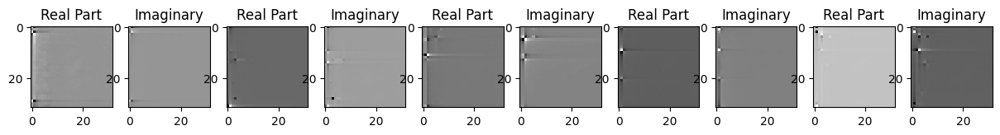

Saving model to: /content/drive/MyDrive/saved_model/_model_168_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.56997030535338
Correlation is  0.7566669583320618
Epoch-170 lr: 0.0009000000000000001
Loss:  3.870707587338984e-06
torch.Size([5, 2, 32, 32])


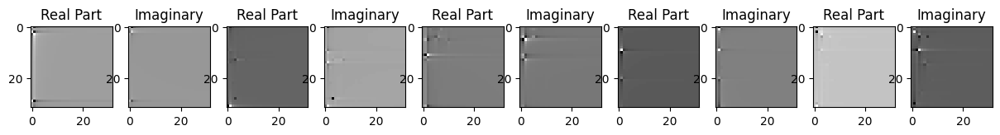

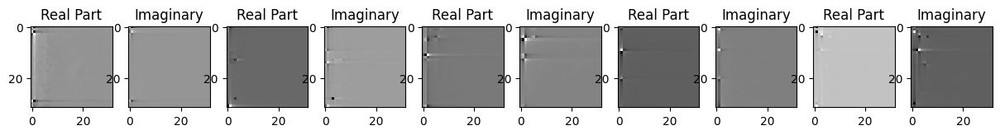

Saving model to: /content/drive/MyDrive/saved_model/_model_169_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.56919326687618
Correlation is  0.7566736936569214
Epoch-171 lr: 0.0009000000000000001
Loss:  3.861535788018955e-06
torch.Size([5, 2, 32, 32])


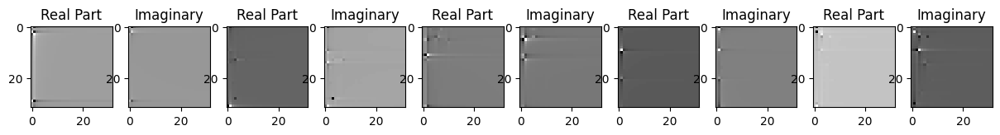

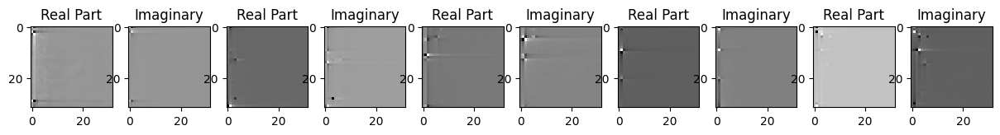

Saving model to: /content/drive/MyDrive/saved_model/_model_170_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.581402600690563
Correlation is  0.7567319869995117
Epoch-172 lr: 0.0009000000000000001
Loss:  3.860765900753904e-06
torch.Size([5, 2, 32, 32])


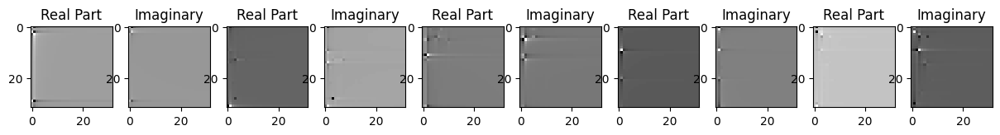

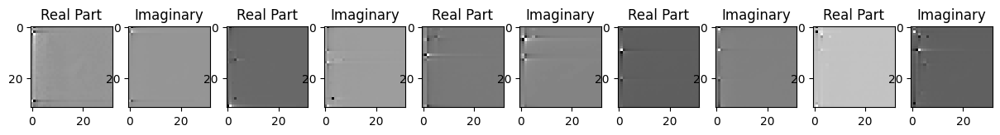

Saving model to: /content/drive/MyDrive/saved_model/_model_171_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.580745107252596
Correlation is  0.7567020058631897
Epoch-173 lr: 0.0009000000000000001
Loss:  3.8579805732297245e-06
torch.Size([5, 2, 32, 32])


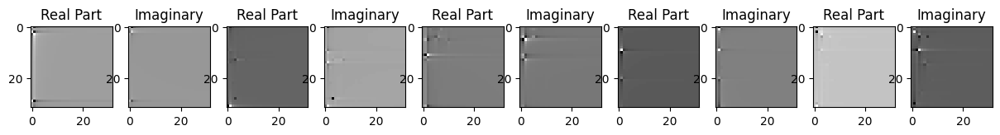

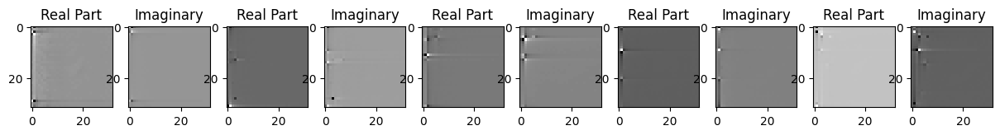

Saving model to: /content/drive/MyDrive/saved_model/_model_172_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.583374753221943
Correlation is  0.7567852139472961
Epoch-174 lr: 0.0009000000000000001
Loss:  3.877685685438337e-06
torch.Size([5, 2, 32, 32])


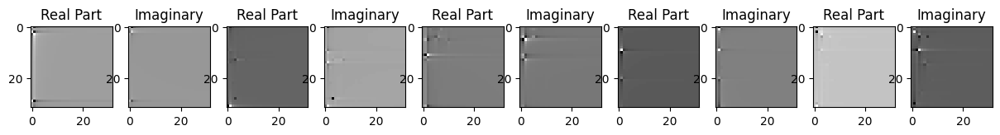

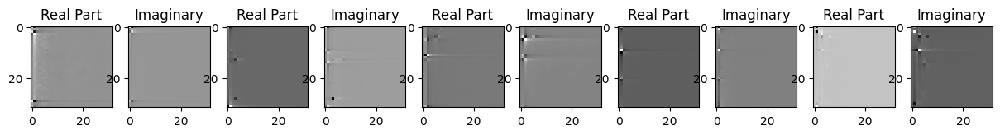

Saving model to: /content/drive/MyDrive/saved_model/_model_173_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.556713312158422
Correlation is  0.7567231059074402
Epoch-175 lr: 0.0009000000000000001
Loss:  3.865778580802726e-06
torch.Size([5, 2, 32, 32])


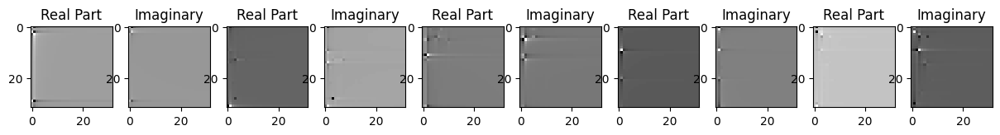

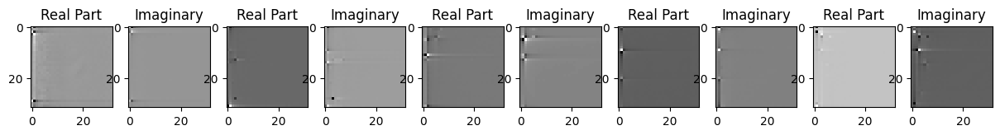

Saving model to: /content/drive/MyDrive/saved_model/_model_174_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.571014568872926
Correlation is  0.7567773461341858
Epoch-176 lr: 0.0009000000000000001
Loss:  3.883492809109157e-06
torch.Size([5, 2, 32, 32])


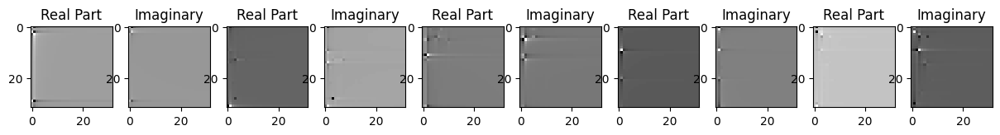

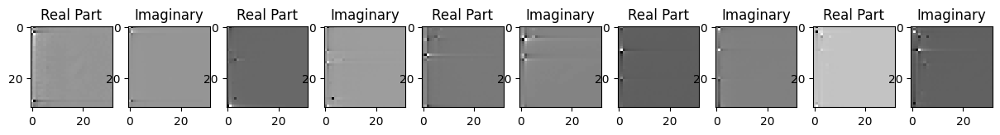

Saving model to: /content/drive/MyDrive/saved_model/_model_175_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.546166682531
Correlation is  0.7568486332893372
Epoch-177 lr: 0.0009000000000000001
Loss:  3.889120307576377e-06
torch.Size([5, 2, 32, 32])


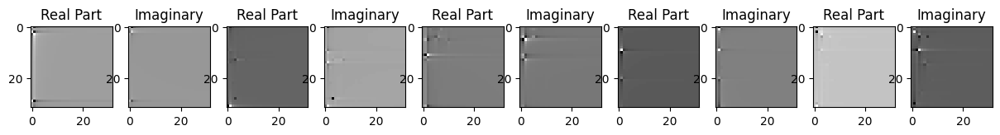

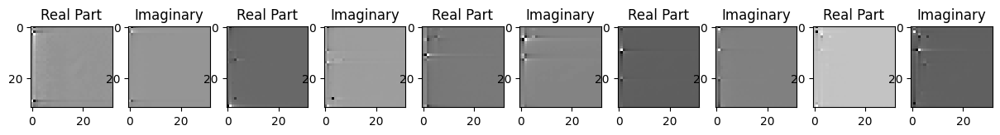

Saving model to: /content/drive/MyDrive/saved_model/_model_176_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.538151929953266
Correlation is  0.7568422555923462
Epoch-178 lr: 0.0009000000000000001
Loss:  3.9258466131286696e-06
torch.Size([5, 2, 32, 32])


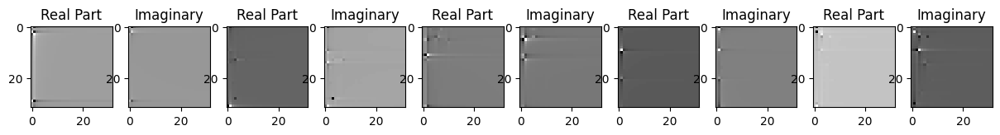

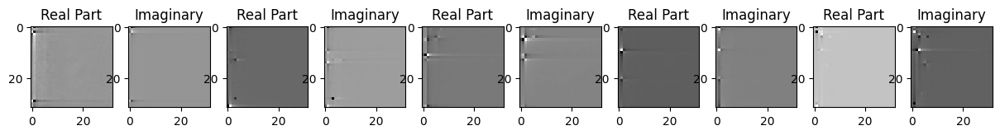

Saving model to: /content/drive/MyDrive/saved_model/_model_177_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.49108480596809
Correlation is  0.756831169128418
Epoch-179 lr: 0.0009000000000000001
Loss:  3.9756687328917906e-06
torch.Size([5, 2, 32, 32])


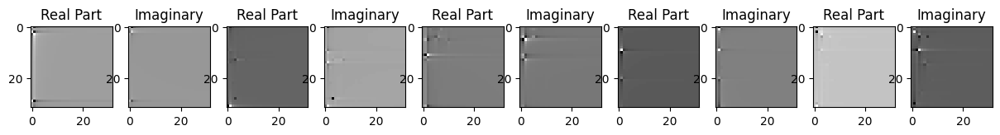

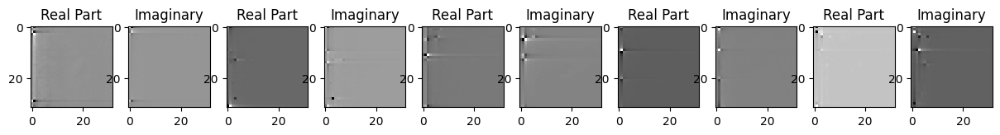

Saving model to: /content/drive/MyDrive/saved_model/_model_178_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.425687321490784
Correlation is  0.7568488121032715
Epoch-180 lr: 0.0009000000000000001
Loss:  3.997463409177726e-06
torch.Size([5, 2, 32, 32])


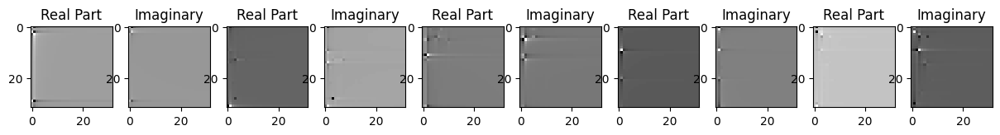

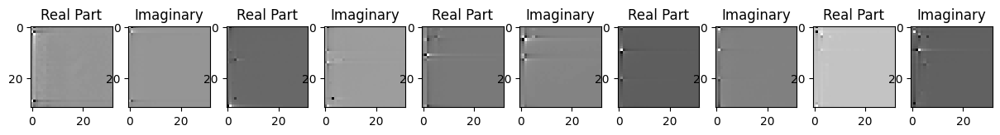

Saving model to: /content/drive/MyDrive/saved_model/_model_179_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.398675859754256
Correlation is  0.7568413615226746
Epoch-181 lr: 0.0009000000000000001
Loss:  4.032827746414114e-06
torch.Size([5, 2, 32, 32])


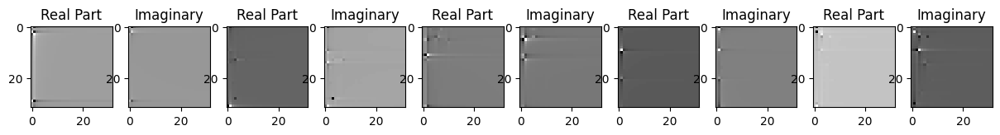

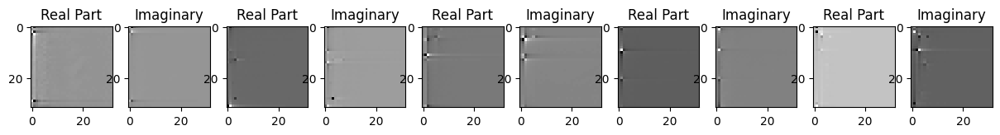

Saving model to: /content/drive/MyDrive/saved_model/_model_180_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.35382916025452
Correlation is  0.7568535804748535
Epoch-182 lr: 0.0009000000000000001
Loss:  3.98028532799799e-06
torch.Size([5, 2, 32, 32])


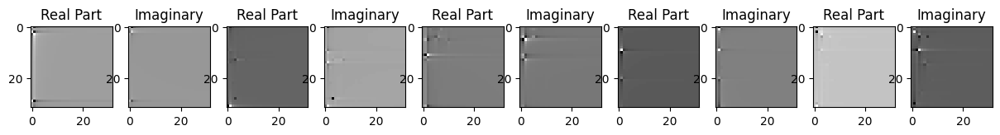

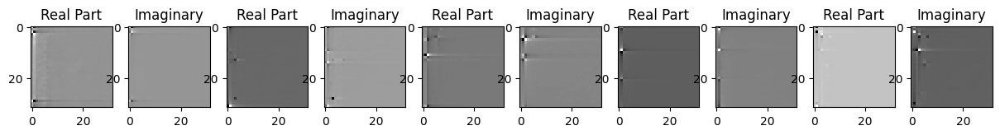

Saving model to: /content/drive/MyDrive/saved_model/_model_181_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.41906568296314
Correlation is  0.7568575739860535
Epoch-183 lr: 0.0009000000000000001
Loss:  4.00392400479177e-06
torch.Size([5, 2, 32, 32])


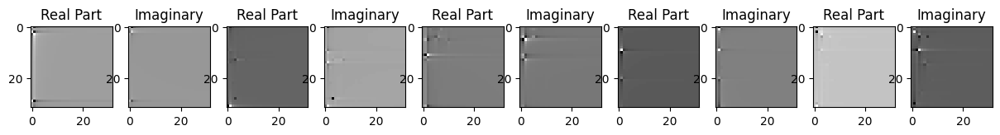

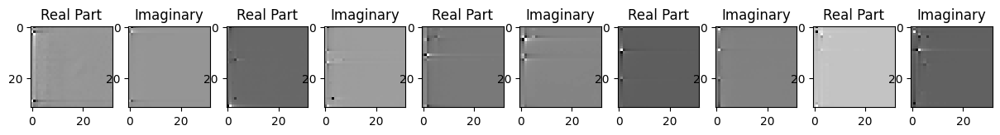

Saving model to: /content/drive/MyDrive/saved_model/_model_182_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.389101520238068
Correlation is  0.7568633556365967
Epoch-184 lr: 0.0009000000000000001
Loss:  4.0051600080914795e-06
torch.Size([5, 2, 32, 32])


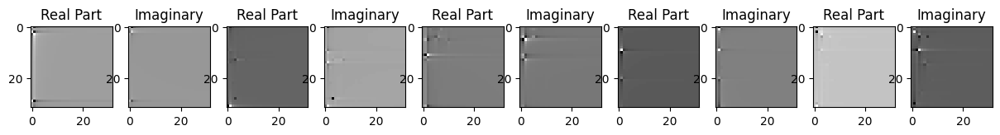

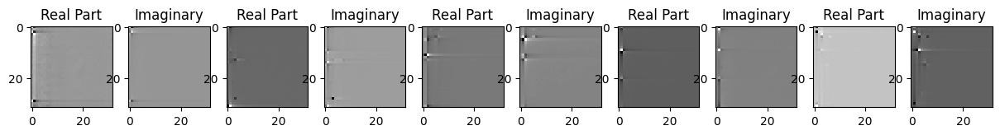

Saving model to: /content/drive/MyDrive/saved_model/_model_183_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.387622456441406
Correlation is  0.7568592429161072
Epoch-185 lr: 0.0009000000000000001
Loss:  3.990844106738223e-06
torch.Size([5, 2, 32, 32])


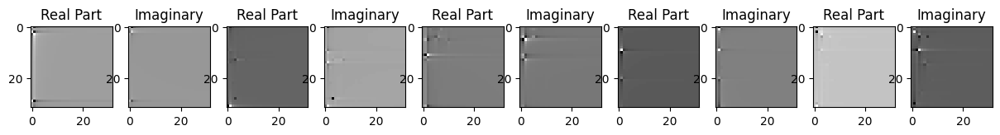

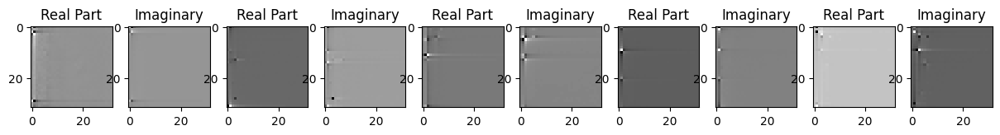

Saving model to: /content/drive/MyDrive/saved_model/_model_184_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.403293643870995
Correlation is  0.7568843364715576
Epoch-186 lr: 0.0009000000000000001
Loss:  4.0054965211311355e-06
torch.Size([5, 2, 32, 32])


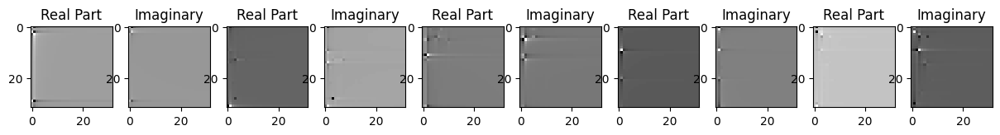

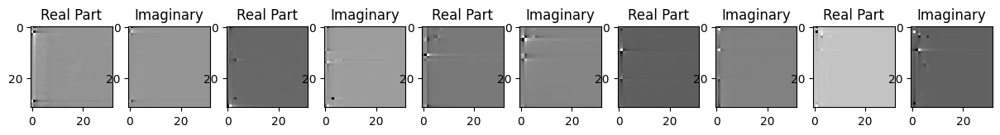

Saving model to: /content/drive/MyDrive/saved_model/_model_185_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.38418990931557
Correlation is  0.7569130063056946
Epoch-187 lr: 0.0009000000000000001
Loss:  3.994415237684734e-06
torch.Size([5, 2, 32, 32])


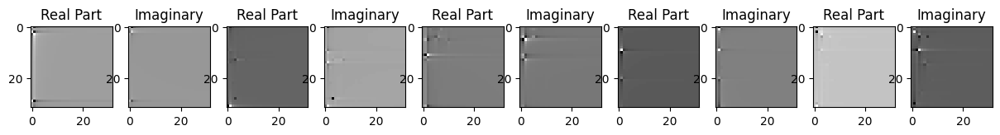

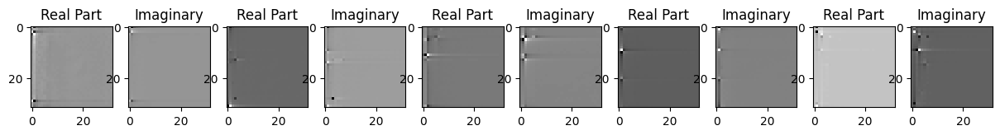

Saving model to: /content/drive/MyDrive/saved_model/_model_186_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.399321433233123
Correlation is  0.7568786144256592
Epoch-188 lr: 0.0009000000000000001
Loss:  3.969199042330729e-06
torch.Size([5, 2, 32, 32])


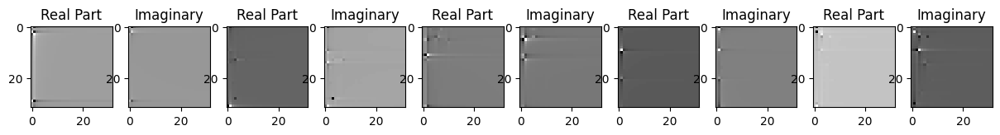

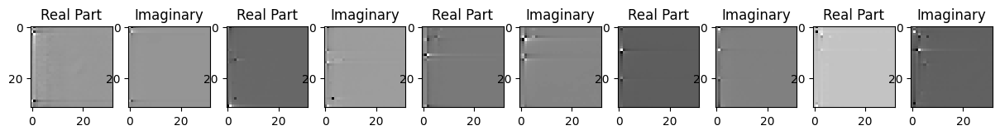

Saving model to: /content/drive/MyDrive/saved_model/_model_187_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.431267423801707
Correlation is  0.7568784952163696
Epoch-189 lr: 0.0009000000000000001
Loss:  3.9544615901832e-06
torch.Size([5, 2, 32, 32])


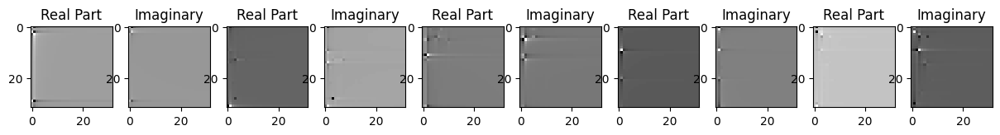

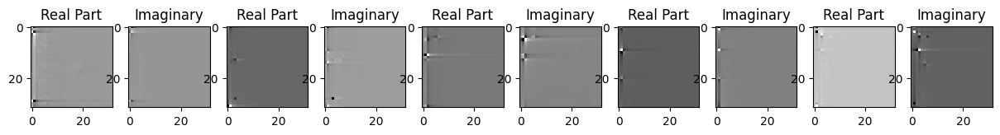

Saving model to: /content/drive/MyDrive/saved_model/_model_188_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.445465582626817
Correlation is  0.7569414973258972
Epoch-190 lr: 0.0009000000000000001
Loss:  3.958599791076267e-06
torch.Size([5, 2, 32, 32])


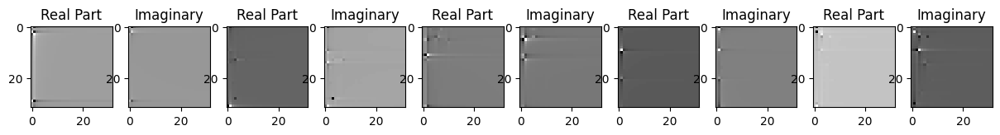

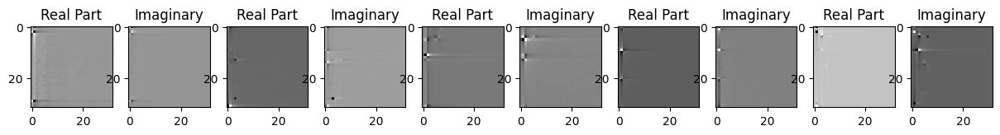

Saving model to: /content/drive/MyDrive/saved_model/_model_189_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.44094691788566
Correlation is  0.7569457292556763
Epoch-191 lr: 0.0009000000000000001
Loss:  3.932766048819758e-06
torch.Size([5, 2, 32, 32])


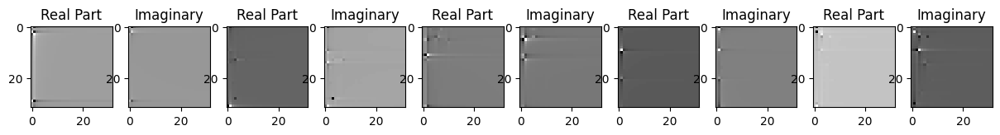

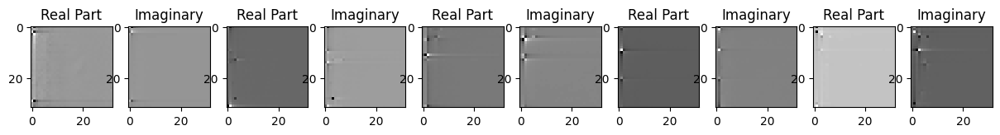

Saving model to: /content/drive/MyDrive/saved_model/_model_190_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.47442147017279
Correlation is  0.7569209933280945
Epoch-192 lr: 0.0009000000000000001
Loss:  3.902105163433589e-06
torch.Size([5, 2, 32, 32])


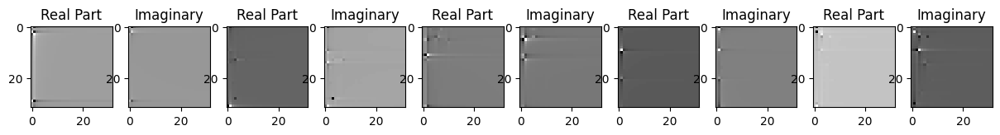

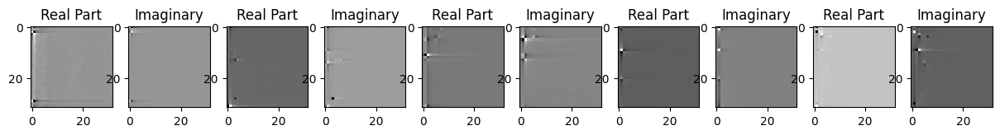

Saving model to: /content/drive/MyDrive/saved_model/_model_191_indoor_512.pth
Loss:  3.888978881150251e-06
torch.Size([5, 2, 32, 32])


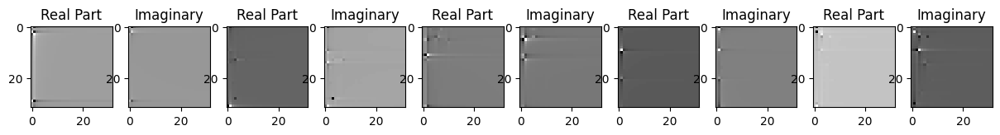

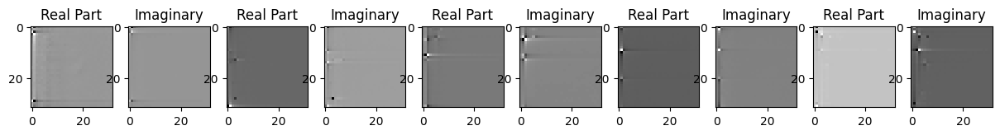

Saving model to: /content/drive/MyDrive/saved_model/_model_192_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.52842763121359
Correlation is  0.7569505572319031
Epoch-194 lr: 0.0009000000000000001
Loss:  3.8932116694923025e-06
torch.Size([5, 2, 32, 32])


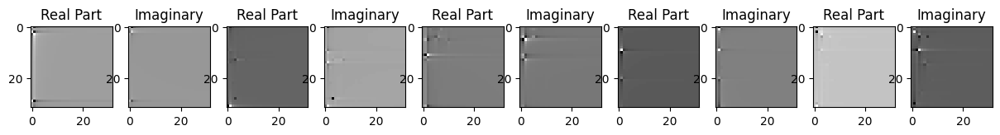

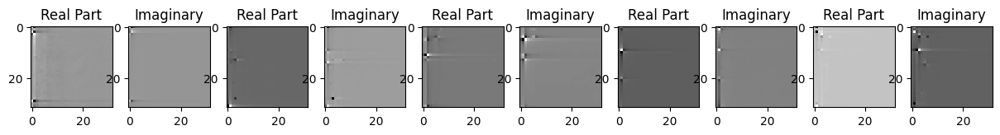

Saving model to: /content/drive/MyDrive/saved_model/_model_193_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.522292558936606
Correlation is  0.7569225430488586
Epoch-195 lr: 0.0009000000000000001
Loss:  3.880709755321732e-06
torch.Size([5, 2, 32, 32])


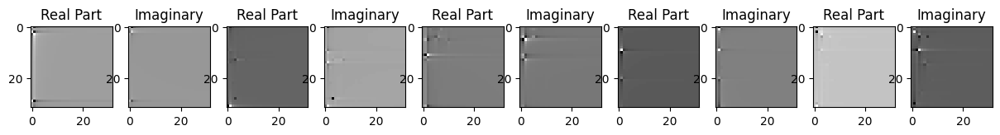

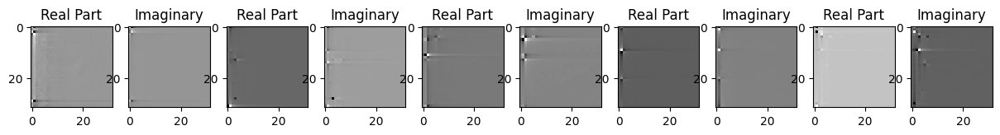

Saving model to: /content/drive/MyDrive/saved_model/_model_194_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.537304120556957
Correlation is  0.756949782371521
Epoch-196 lr: 0.0009000000000000001
Loss:  3.899730927514611e-06
torch.Size([5, 2, 32, 32])


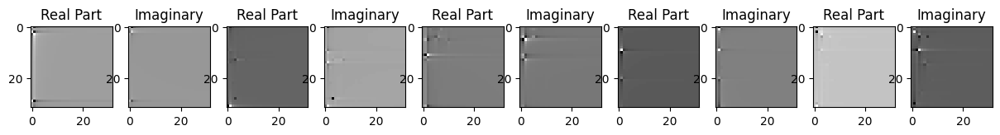

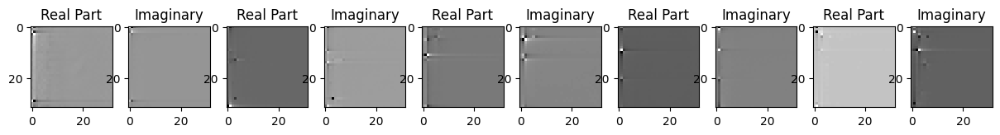

Saving model to: /content/drive/MyDrive/saved_model/_model_195_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.512942759069333
Correlation is  0.7569355964660645
Epoch-197 lr: 0.0009000000000000001
Loss:  3.8649777707178146e-06
torch.Size([5, 2, 32, 32])


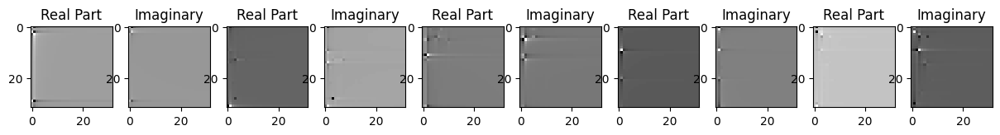

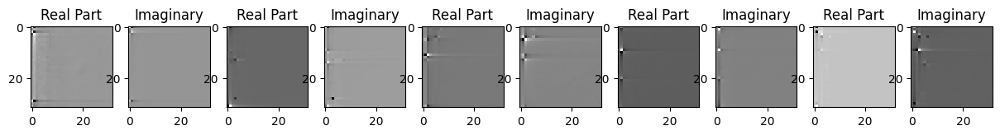

Saving model to: /content/drive/MyDrive/saved_model/_model_196_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.55759251203771
Correlation is  0.7569342851638794
Epoch-198 lr: 0.0009000000000000001
Loss:  3.871189619530924e-06
torch.Size([5, 2, 32, 32])


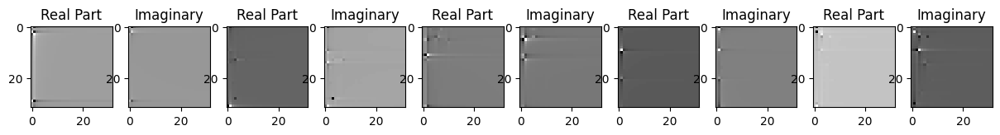

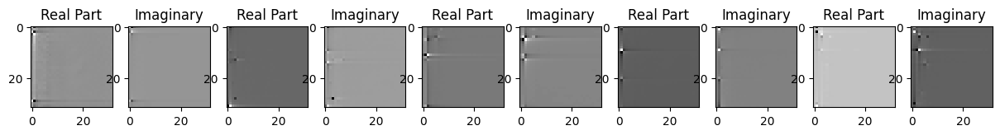

Saving model to: /content/drive/MyDrive/saved_model/_model_197_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.548708003586032
Correlation is  0.7569343447685242
Epoch-199 lr: 0.0009000000000000001
Loss:  3.846694198728073e-06
torch.Size([5, 2, 32, 32])


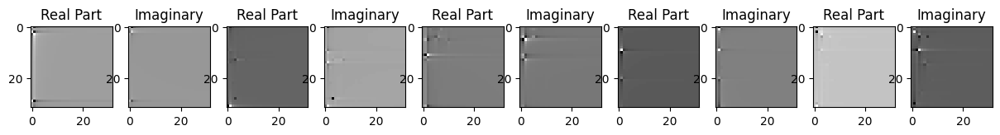

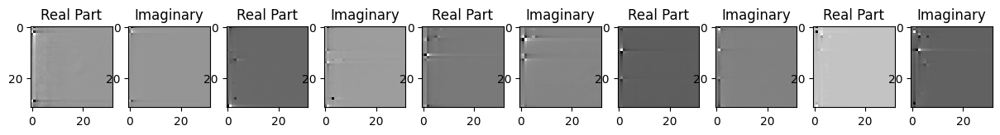

Saving model to: /content/drive/MyDrive/saved_model/_model_198_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.5808264793834
Correlation is  0.7569597959518433
Epoch-200 lr: 0.0009000000000000001
Loss:  3.8567432056879625e-06
torch.Size([5, 2, 32, 32])


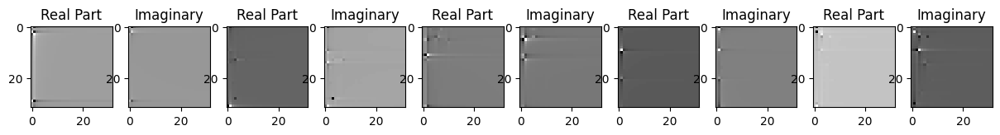

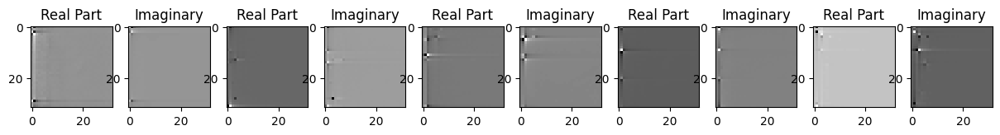

Saving model to: /content/drive/MyDrive/saved_model/_model_199_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.565922007352235
Correlation is  0.7569286227226257
Epoch-201 lr: 0.0008100000000000001
Loss:  3.754071485673194e-06
torch.Size([5, 2, 32, 32])


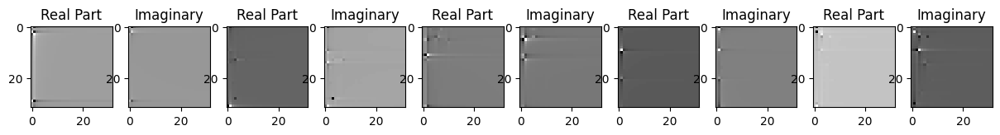

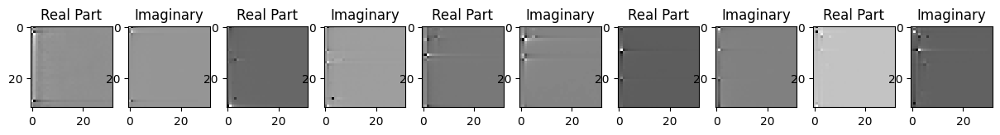

Saving model to: /content/drive/MyDrive/saved_model/_model_200_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.69808680147292
Correlation is  0.7570514678955078
Epoch-202 lr: 0.0008100000000000001
Loss:  3.7317381611501332e-06
torch.Size([5, 2, 32, 32])


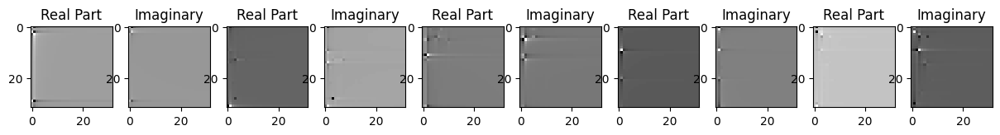

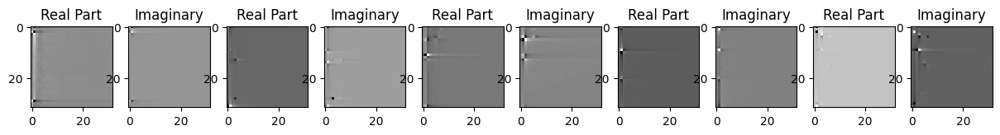

Saving model to: /content/drive/MyDrive/saved_model/_model_201_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.727862810068448
Correlation is  0.7571008801460266
Epoch-203 lr: 0.0008100000000000001
Loss:  3.7408904063340742e-06
torch.Size([5, 2, 32, 32])


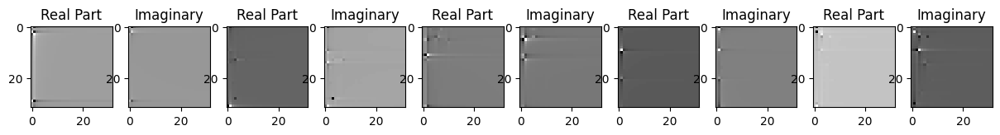

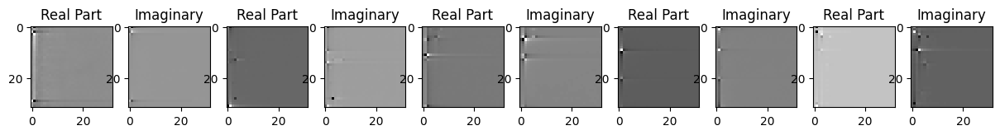

Saving model to: /content/drive/MyDrive/saved_model/_model_202_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.714840481311818
Correlation is  0.7571388483047485
Epoch-204 lr: 0.0008100000000000001
Loss:  3.7540855828410713e-06
torch.Size([5, 2, 32, 32])


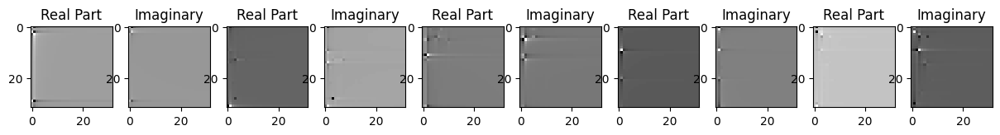

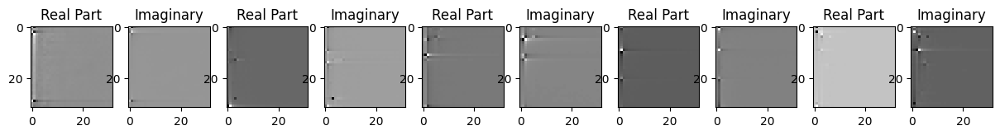

Saving model to: /content/drive/MyDrive/saved_model/_model_203_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.69509723403941
Correlation is  0.757154107093811
Epoch-205 lr: 0.0008100000000000001
Loss:  3.7827660435141297e-06
torch.Size([5, 2, 32, 32])


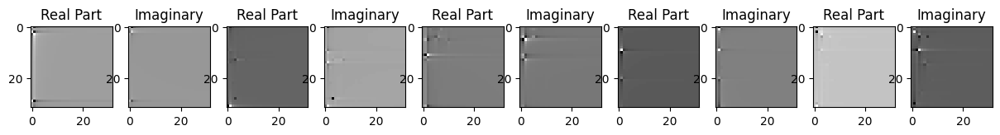

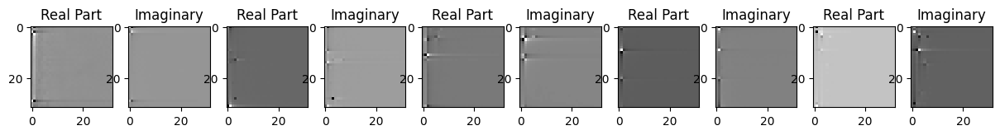

Saving model to: /content/drive/MyDrive/saved_model/_model_204_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.65618939727912
Correlation is  0.7571350932121277
Epoch-206 lr: 0.0008100000000000001
Loss:  3.7366808101069182e-06
torch.Size([5, 2, 32, 32])


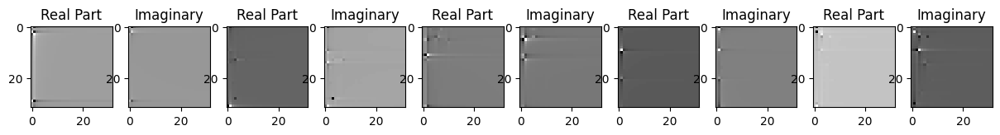

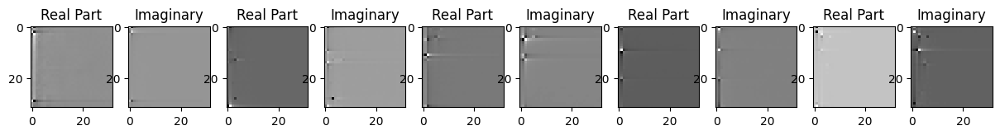

Saving model to: /content/drive/MyDrive/saved_model/_model_205_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.71730928291878
Correlation is  0.7571861147880554
Epoch-207 lr: 0.0008100000000000001
Loss:  3.758354068850167e-06
torch.Size([5, 2, 32, 32])


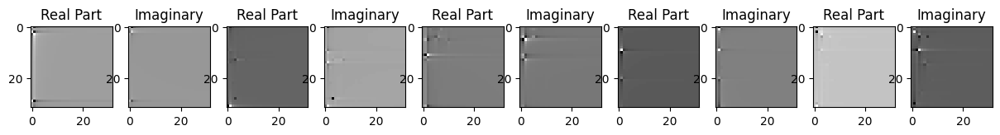

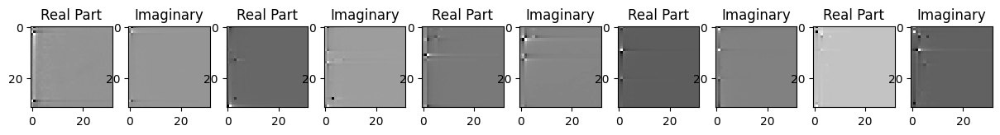

Saving model to: /content/drive/MyDrive/saved_model/_model_206_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.68892660398006
Correlation is  0.7571493983268738
Epoch-208 lr: 0.0008100000000000001
Loss:  3.8023194974812213e-06
torch.Size([5, 2, 32, 32])


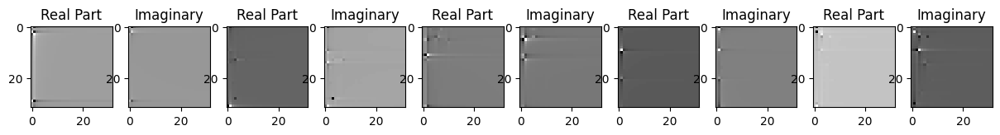

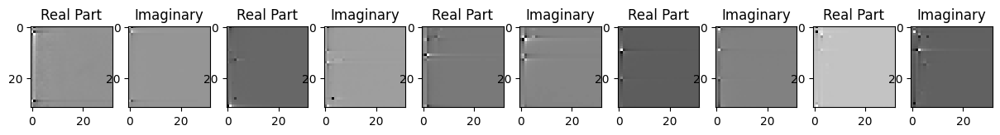

Saving model to: /content/drive/MyDrive/saved_model/_model_207_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.62769450013993
Correlation is  0.7570611238479614
Epoch-209 lr: 0.0008100000000000001
Loss:  3.7372847145888954e-06
torch.Size([5, 2, 32, 32])


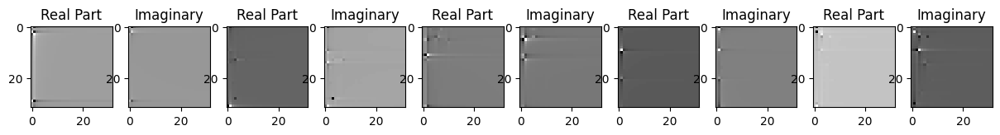

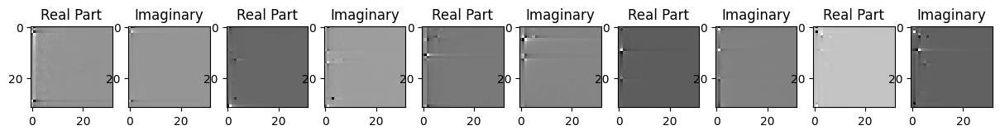

Saving model to: /content/drive/MyDrive/saved_model/_model_208_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.715764686647894
Correlation is  0.757128119468689
Epoch-210 lr: 0.0008100000000000001
Loss:  3.7333707041398156e-06
torch.Size([5, 2, 32, 32])


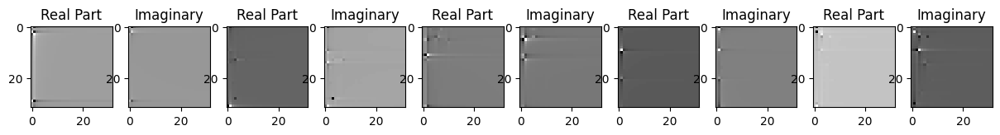

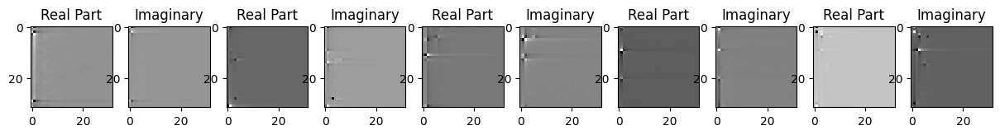

Saving model to: /content/drive/MyDrive/saved_model/_model_209_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.720445004650905
Correlation is  0.757122814655304
Epoch-211 lr: 0.0008100000000000001
Loss:  3.7627444271493005e-06
torch.Size([5, 2, 32, 32])


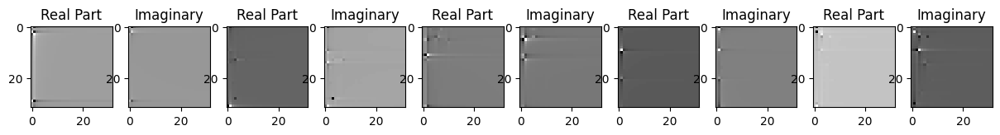

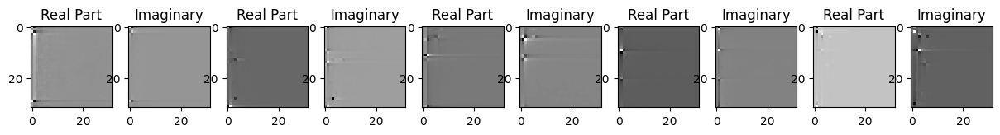

Saving model to: /content/drive/MyDrive/saved_model/_model_210_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.67881803228424
Correlation is  0.7570715546607971
Epoch-212 lr: 0.0008100000000000001
Loss:  3.7296333630365552e-06
torch.Size([5, 2, 32, 32])


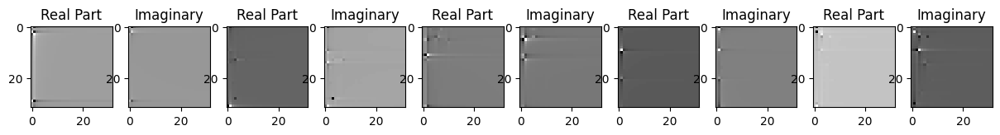

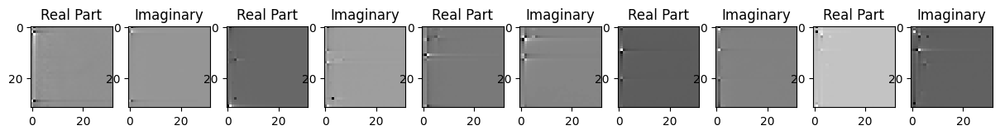

Saving model to: /content/drive/MyDrive/saved_model/_model_211_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.72313579782437
Correlation is  0.7570713758468628
Epoch-213 lr: 0.0008100000000000001
Loss:  3.7506849821511423e-06
torch.Size([5, 2, 32, 32])


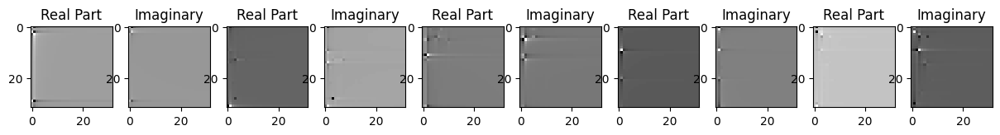

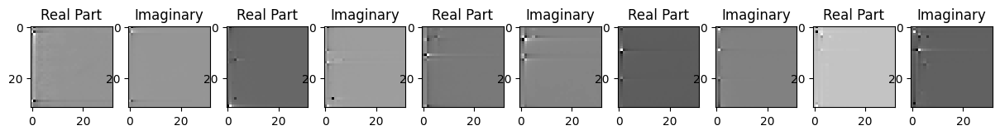

Saving model to: /content/drive/MyDrive/saved_model/_model_212_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.694289890990134
Correlation is  0.7570667862892151
Epoch-214 lr: 0.0008100000000000001
Loss:  3.7070024063723395e-06
torch.Size([5, 2, 32, 32])


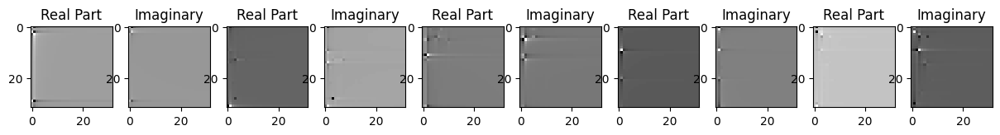

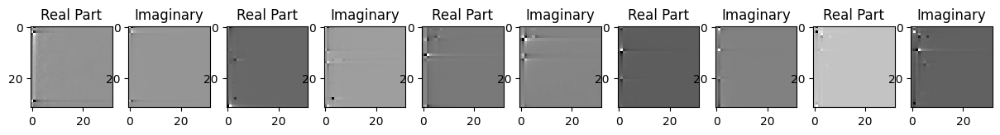

Saving model to: /content/drive/MyDrive/saved_model/_model_213_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.752432860425102
Correlation is  0.757089376449585
Epoch-215 lr: 0.0008100000000000001
Loss:  3.693427970574703e-06
torch.Size([5, 2, 32, 32])


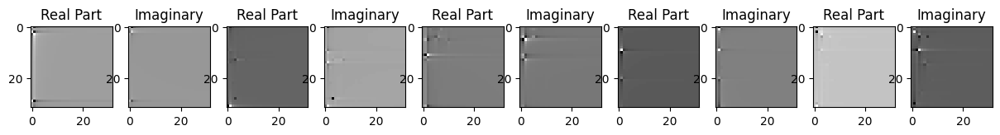

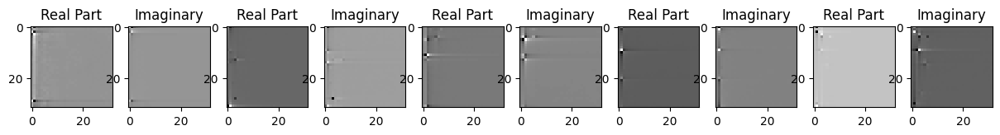

Saving model to: /content/drive/MyDrive/saved_model/_model_214_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.772307662933116
Correlation is  0.7570952773094177
Epoch-216 lr: 0.0008100000000000001
Loss:  3.690352059493307e-06
torch.Size([5, 2, 32, 32])


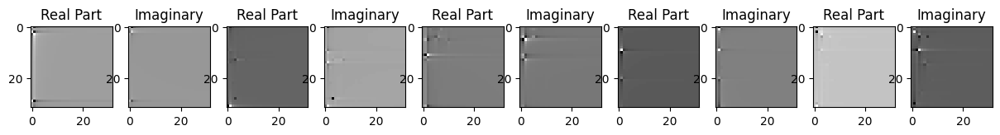

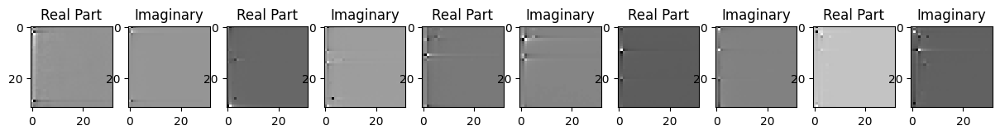

Saving model to: /content/drive/MyDrive/saved_model/_model_215_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.776028829921117
Correlation is  0.7570818066596985
Epoch-217 lr: 0.0008100000000000001
Loss:  3.6708233892568387e-06
torch.Size([5, 2, 32, 32])


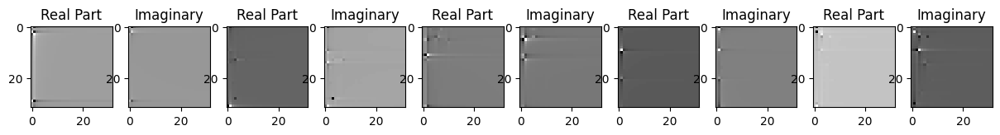

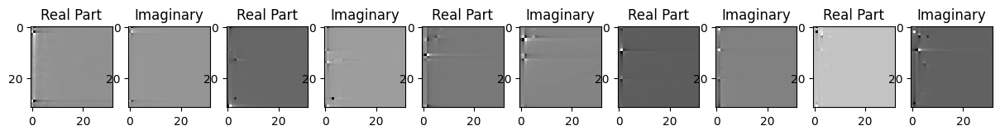

Saving model to: /content/drive/MyDrive/saved_model/_model_216_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.8025631908807
Correlation is  0.7570944428443909
Epoch-218 lr: 0.0008100000000000001
Loss:  3.6825142615271034e-06
torch.Size([5, 2, 32, 32])


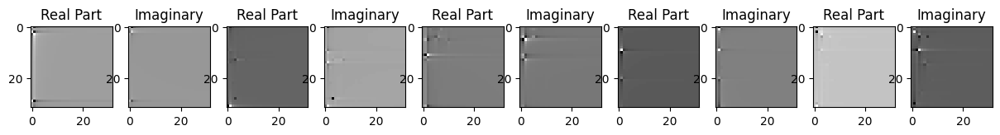

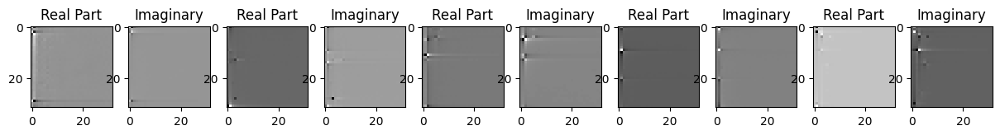

Saving model to: /content/drive/MyDrive/saved_model/_model_217_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.785021993356562
Correlation is  0.7570639252662659
Epoch-219 lr: 0.0008100000000000001
Loss:  3.6628666748583782e-06
torch.Size([5, 2, 32, 32])


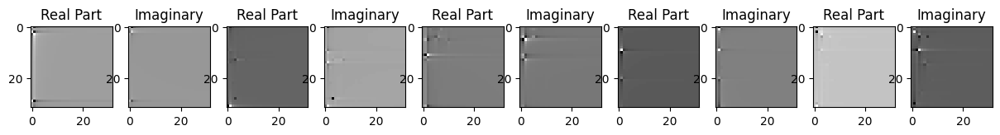

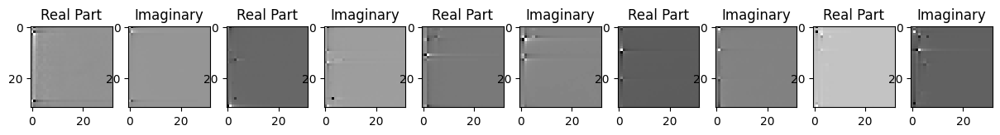

Saving model to: /content/drive/MyDrive/saved_model/_model_218_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.813074023727065
Correlation is  0.7570834755897522
Epoch-220 lr: 0.0008100000000000001
Loss:  3.655462478491245e-06
torch.Size([5, 2, 32, 32])


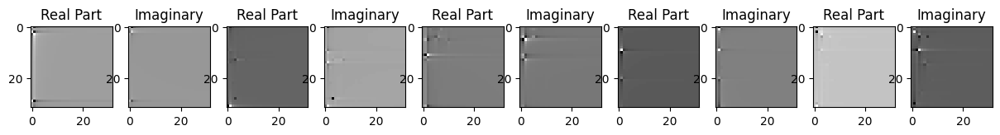

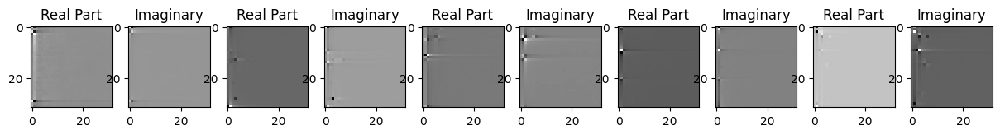

Saving model to: /content/drive/MyDrive/saved_model/_model_219_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.820502371857984
Correlation is  0.7570902109146118
Epoch-221 lr: 0.0008100000000000001
Loss:  3.6542614907375537e-06
torch.Size([5, 2, 32, 32])


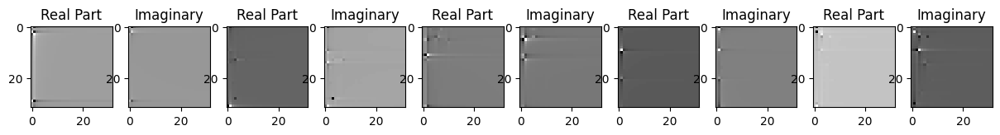

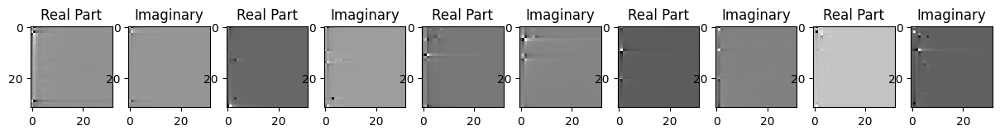

Saving model to: /content/drive/MyDrive/saved_model/_model_220_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.822683446932324
Correlation is  0.7570511698722839
Epoch-222 lr: 0.0008100000000000001
Loss:  3.638090674940031e-06
torch.Size([5, 2, 32, 32])


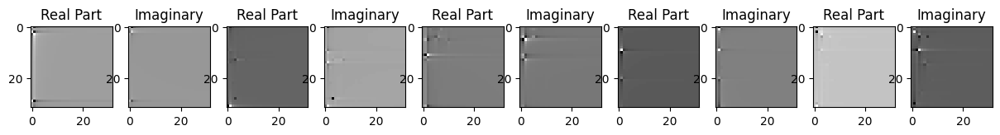

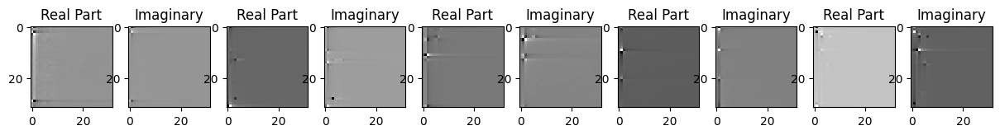

Saving model to: /content/drive/MyDrive/saved_model/_model_221_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.844922157257322
Correlation is  0.757060706615448
Epoch-223 lr: 0.0008100000000000001
Loss:  3.640781869762577e-06
torch.Size([5, 2, 32, 32])


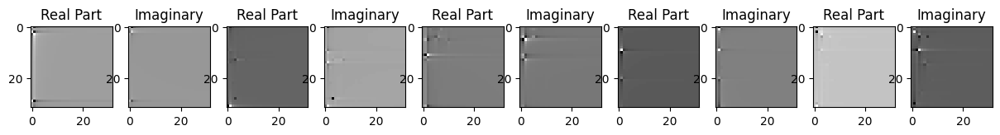

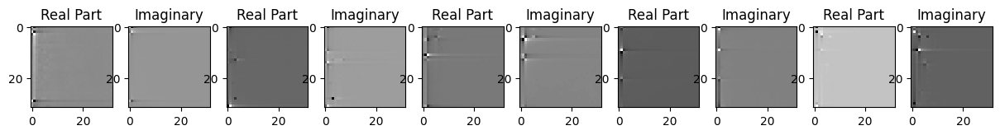

Saving model to: /content/drive/MyDrive/saved_model/_model_222_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.841519038918086
Correlation is  0.757075309753418
Epoch-224 lr: 0.0008100000000000001
Loss:  3.6475669276114786e-06
torch.Size([5, 2, 32, 32])


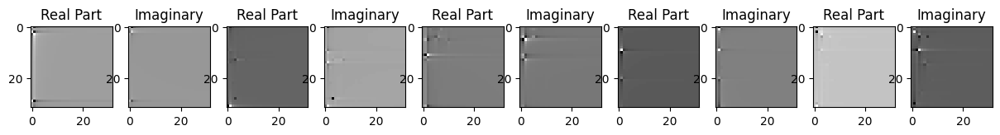

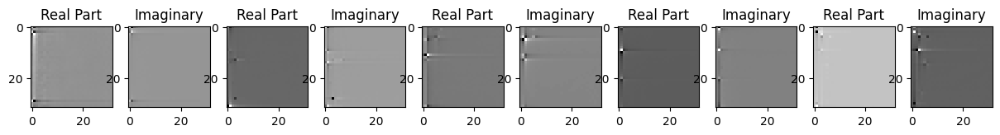

Saving model to: /content/drive/MyDrive/saved_model/_model_223_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.829998015319
Correlation is  0.7570558190345764
Epoch-225 lr: 0.0008100000000000001
Loss:  3.6214694318914553e-06
torch.Size([5, 2, 32, 32])


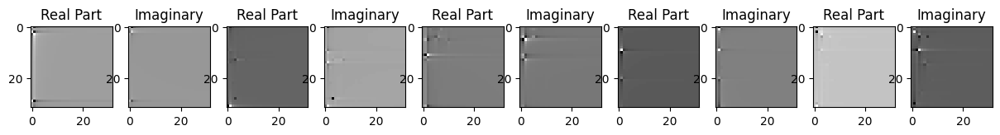

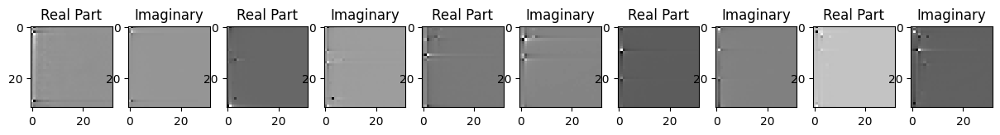

Saving model to: /content/drive/MyDrive/saved_model/_model_224_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.866651124807657
Correlation is  0.7570884823799133
Epoch-226 lr: 0.0008100000000000001
Loss:  3.633885626186384e-06
torch.Size([5, 2, 32, 32])


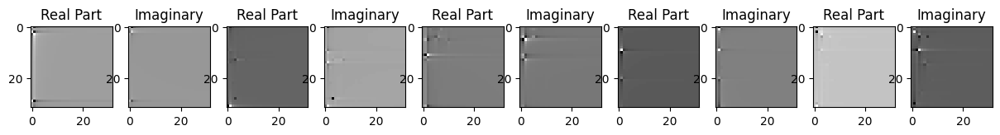

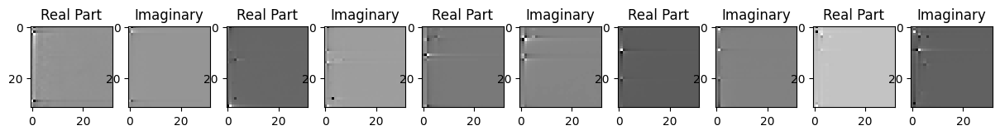

Saving model to: /content/drive/MyDrive/saved_model/_model_225_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.850559939900634
Correlation is  0.7570565342903137
Epoch-227 lr: 0.0008100000000000001
Loss:  3.611515239754226e-06
torch.Size([5, 2, 32, 32])


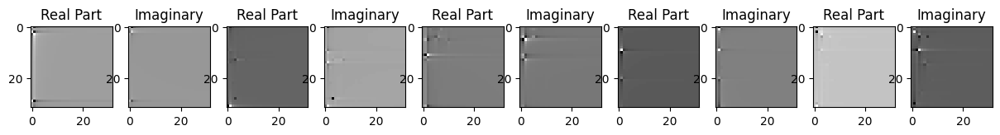

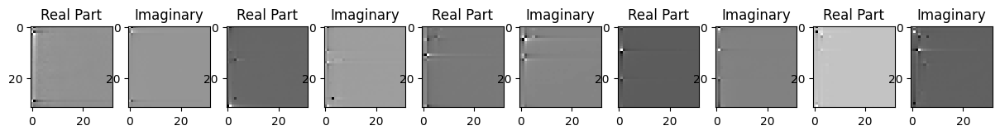

Saving model to: /content/drive/MyDrive/saved_model/_model_226_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.880952823998022
Correlation is  0.7570874691009521
Epoch-228 lr: 0.0008100000000000001
Loss:  3.6270544114813674e-06
torch.Size([5, 2, 32, 32])


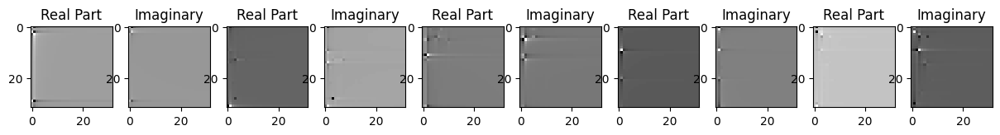

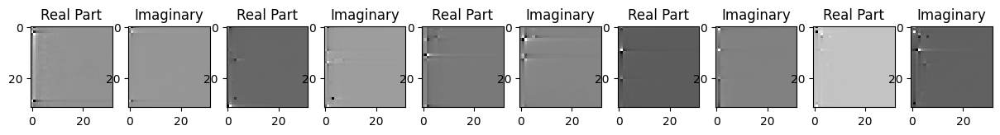

Saving model to: /content/drive/MyDrive/saved_model/_model_227_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.85771221218828
Correlation is  0.7570677399635315
Epoch-229 lr: 0.0008100000000000001
Loss:  3.595718681026483e-06
torch.Size([5, 2, 32, 32])


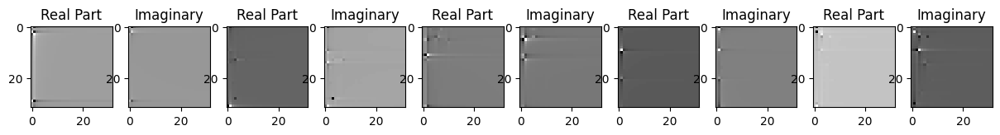

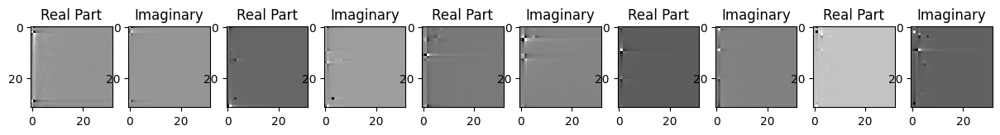

Saving model to: /content/drive/MyDrive/saved_model/_model_228_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.90280003331074
Correlation is  0.757081151008606
Epoch-230 lr: 0.0008100000000000001
Loss:  3.6093135804549092e-06
torch.Size([5, 2, 32, 32])


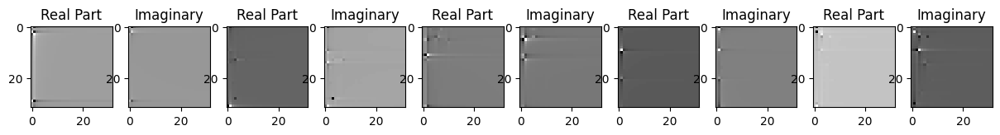

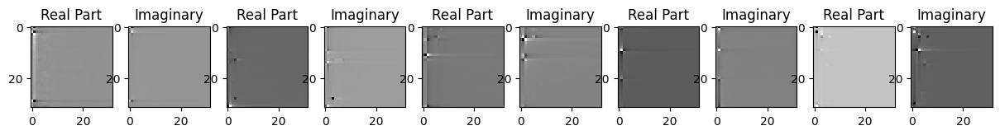

Saving model to: /content/drive/MyDrive/saved_model/_model_229_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.882424491685384
Correlation is  0.7570312023162842
Epoch-231 lr: 0.0008100000000000001
Loss:  3.6001106309413444e-06
torch.Size([5, 2, 32, 32])


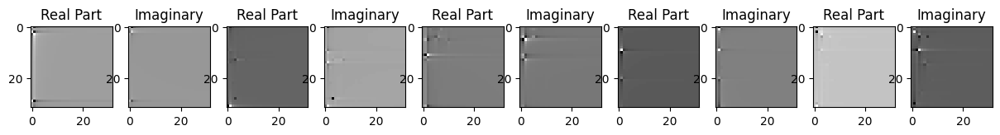

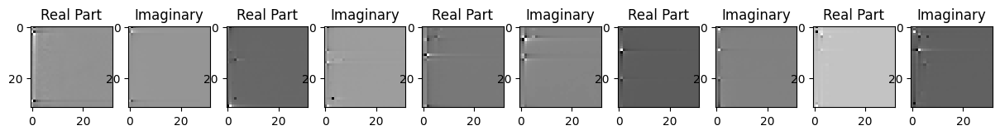

Saving model to: /content/drive/MyDrive/saved_model/_model_230_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.895442944811368
Correlation is  0.7570826411247253
Epoch-232 lr: 0.0008100000000000001
Loss:  3.597430122681544e-06
torch.Size([5, 2, 32, 32])


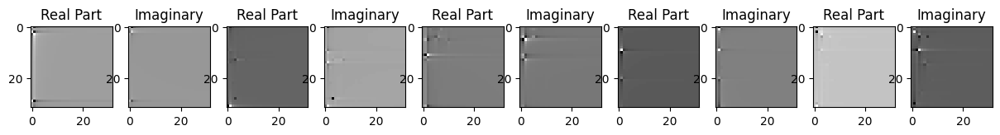

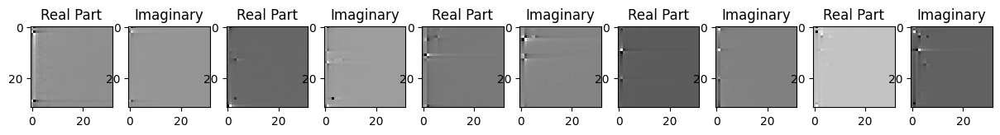

Saving model to: /content/drive/MyDrive/saved_model/_model_231_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.899027893933535
Correlation is  0.7570695877075195
Epoch-233 lr: 0.0008100000000000001
Loss:  3.5790831134363543e-06
torch.Size([5, 2, 32, 32])


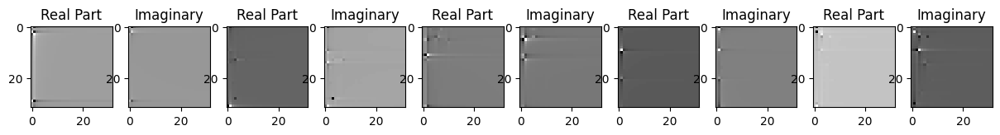

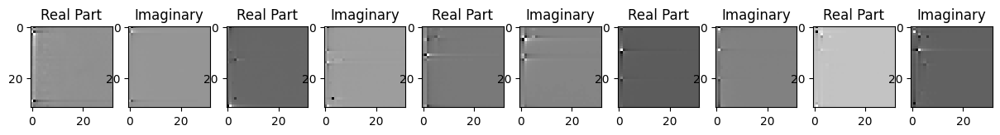

Saving model to: /content/drive/MyDrive/saved_model/_model_232_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.924342347857102
Correlation is  0.7571244239807129
Epoch-234 lr: 0.0008100000000000001
Loss:  3.6089288641960593e-06
torch.Size([5, 2, 32, 32])


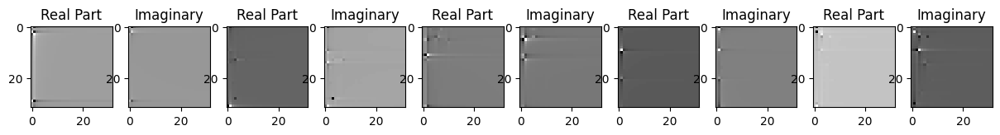

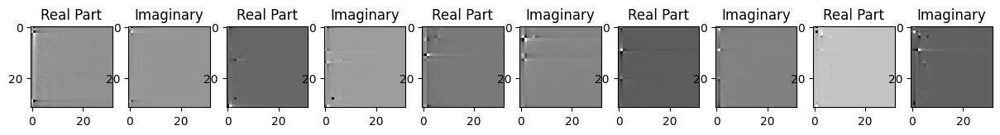

Saving model to: /content/drive/MyDrive/saved_model/_model_233_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.88027860010741
Correlation is  0.7570676803588867
Epoch-235 lr: 0.0008100000000000001
Loss:  3.5912457860831637e-06
torch.Size([5, 2, 32, 32])


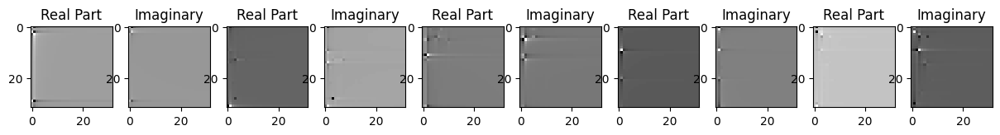

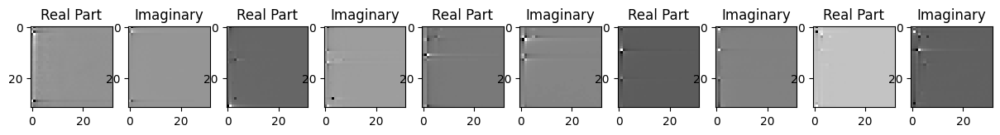

Saving model to: /content/drive/MyDrive/saved_model/_model_234_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.90547471717517
Correlation is  0.7570925354957581
Epoch-236 lr: 0.0008100000000000001
Loss:  3.581491910154e-06
torch.Size([5, 2, 32, 32])


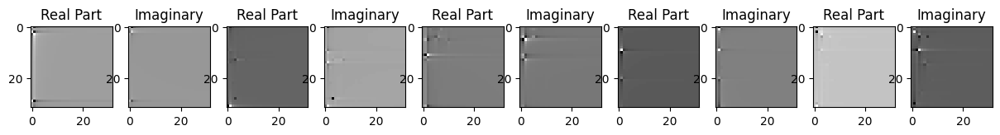

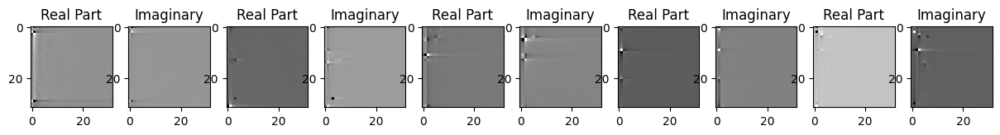

Saving model to: /content/drive/MyDrive/saved_model/_model_235_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.92022449444353
Correlation is  0.7570962309837341
Epoch-237 lr: 0.0008100000000000001
Loss:  3.5765151551458985e-06
torch.Size([5, 2, 32, 32])


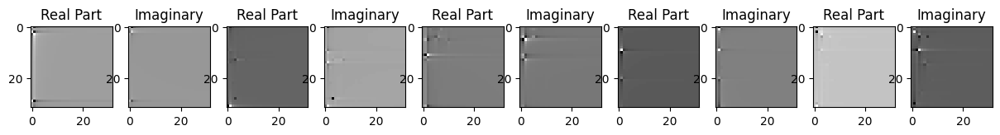

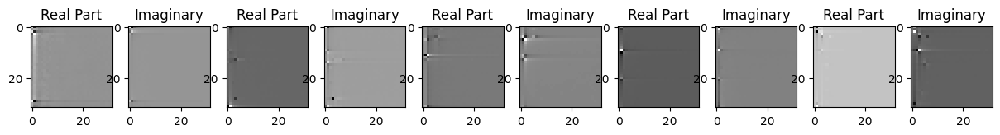

Saving model to: /content/drive/MyDrive/saved_model/_model_236_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.927008304789737
Correlation is  0.7570968270301819
Epoch-238 lr: 0.0008100000000000001
Loss:  3.5699674754141597e-06
torch.Size([5, 2, 32, 32])


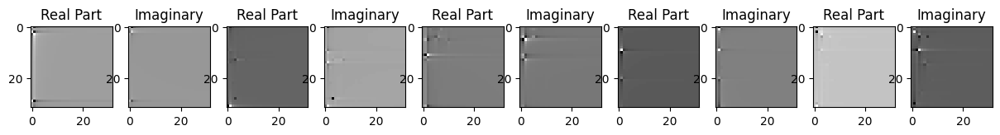

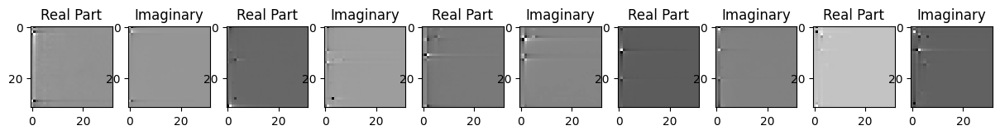

Saving model to: /content/drive/MyDrive/saved_model/_model_237_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.934660365620314
Correlation is  0.7571127414703369
Epoch-239 lr: 0.0008100000000000001
Loss:  3.564361122698756e-06
torch.Size([5, 2, 32, 32])


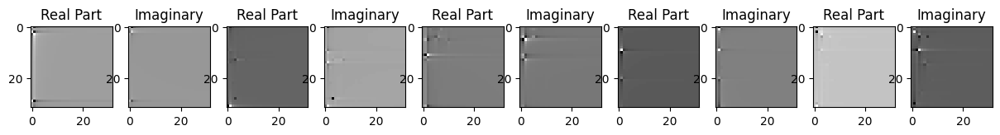

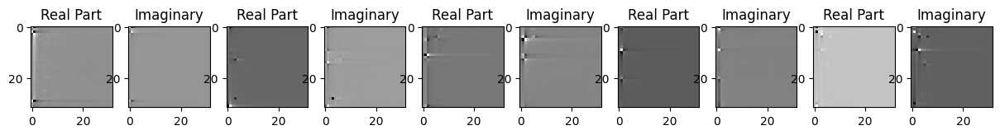

Saving model to: /content/drive/MyDrive/saved_model/_model_238_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.943654687846696
Correlation is  0.7571054697036743
Epoch-240 lr: 0.0008100000000000001
Loss:  3.590413825804717e-06
torch.Size([5, 2, 32, 32])


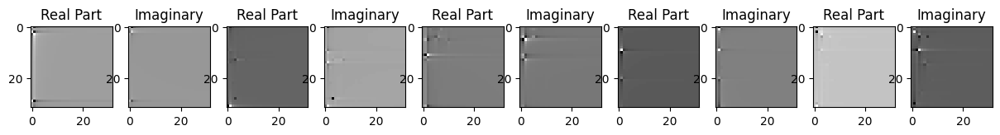

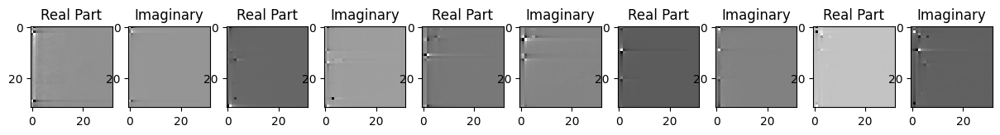

Saving model to: /content/drive/MyDrive/saved_model/_model_239_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.907288661657184
Correlation is  0.7571026086807251
Epoch-241 lr: 0.0008100000000000001
Loss:  3.5832424600812374e-06
torch.Size([5, 2, 32, 32])


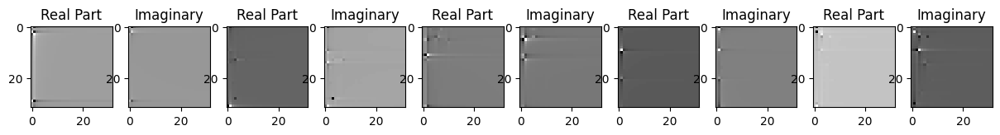

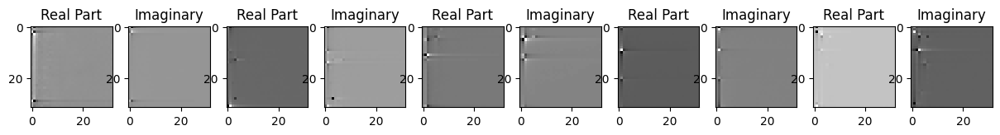

Saving model to: /content/drive/MyDrive/saved_model/_model_240_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.91663749769801
Correlation is  0.7571088075637817
Epoch-242 lr: 0.0008100000000000001
Loss:  3.5795278563455213e-06
torch.Size([5, 2, 32, 32])


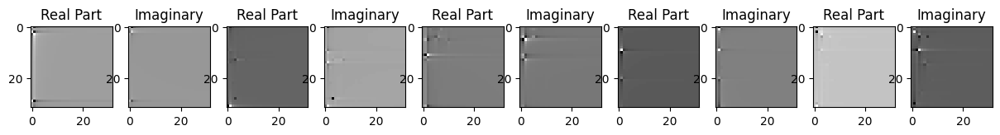

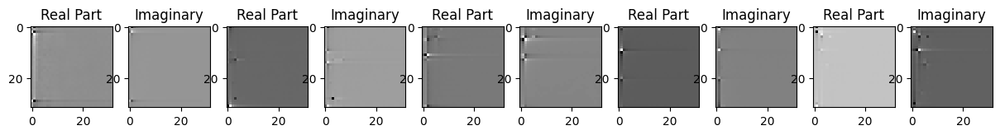

Saving model to: /content/drive/MyDrive/saved_model/_model_241_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.920828948663655
Correlation is  0.7571108937263489
Epoch-243 lr: 0.0008100000000000001
Loss:  3.5788621062238235e-06
torch.Size([5, 2, 32, 32])


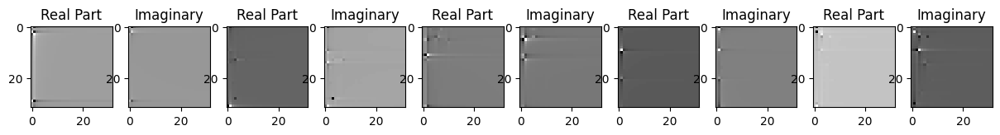

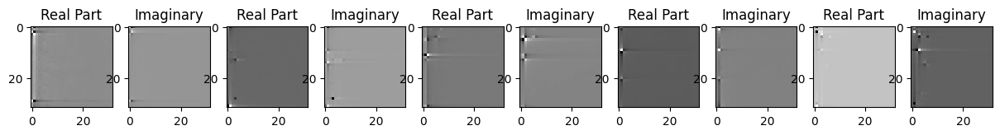

Saving model to: /content/drive/MyDrive/saved_model/_model_242_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.921980094140938
Correlation is  0.7571117877960205
Epoch-244 lr: 0.0008100000000000001
Loss:  3.5600969567894936e-06
torch.Size([5, 2, 32, 32])


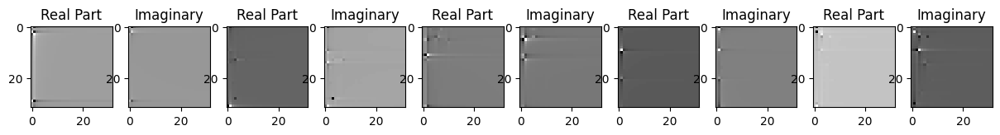

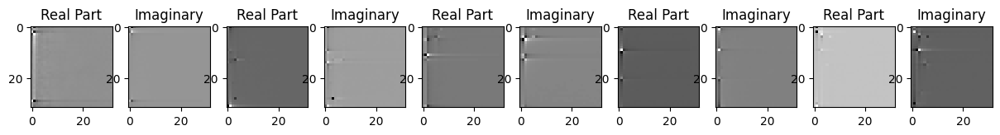

Saving model to: /content/drive/MyDrive/saved_model/_model_243_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.948883193477297
Correlation is  0.7571592330932617
Epoch-245 lr: 0.0008100000000000001
Loss:  3.5646598917082883e-06
torch.Size([5, 2, 32, 32])


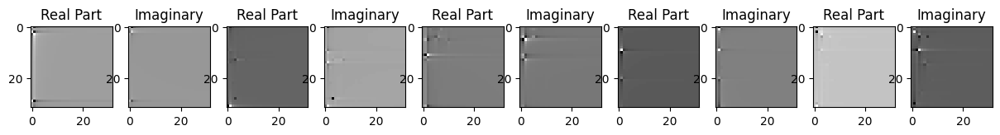

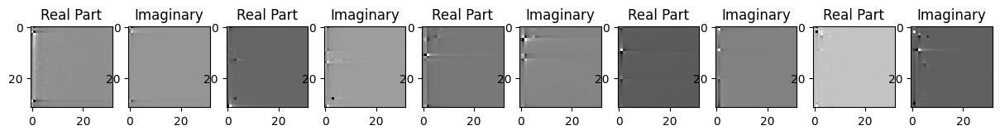

Saving model to: /content/drive/MyDrive/saved_model/_model_244_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.940142712364853
Correlation is  0.7571669220924377
Epoch-246 lr: 0.0008100000000000001
Loss:  3.5813181966659613e-06
torch.Size([5, 2, 32, 32])


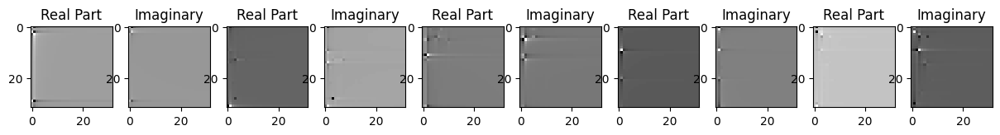

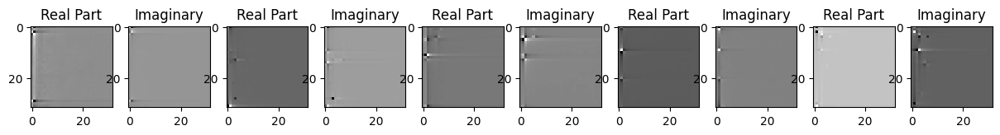

Saving model to: /content/drive/MyDrive/saved_model/_model_245_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.91755120602166
Correlation is  0.7571144700050354
Epoch-247 lr: 0.0008100000000000001
Loss:  3.5614250464277575e-06
torch.Size([5, 2, 32, 32])


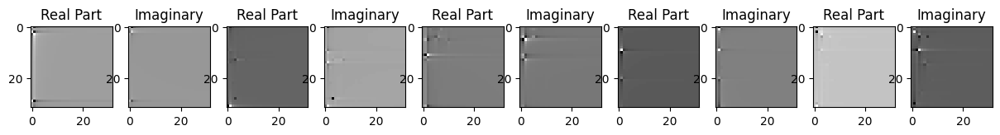

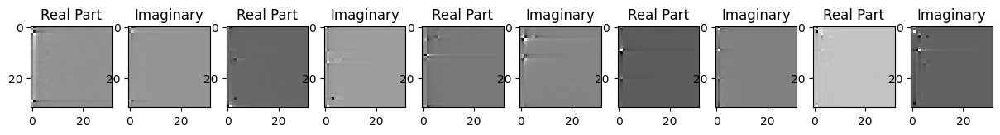

Saving model to: /content/drive/MyDrive/saved_model/_model_246_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.945351904194027
Correlation is  0.7571402192115784
Epoch-248 lr: 0.0008100000000000001
Loss:  3.5670207125804154e-06
torch.Size([5, 2, 32, 32])


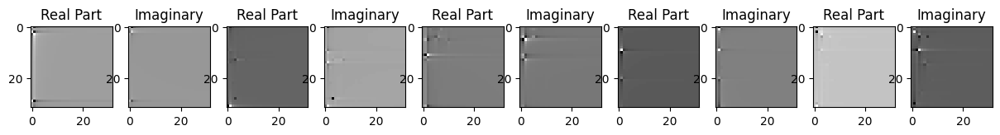

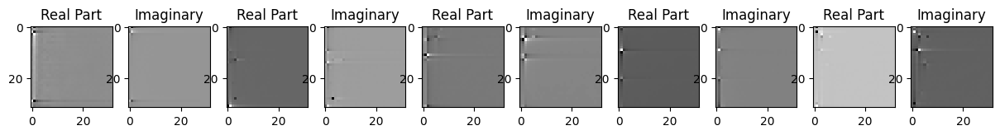

Saving model to: /content/drive/MyDrive/saved_model/_model_247_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.937035048991923
Correlation is  0.7571521401405334
Epoch-249 lr: 0.0008100000000000001
Loss:  3.5715095236810157e-06
torch.Size([5, 2, 32, 32])


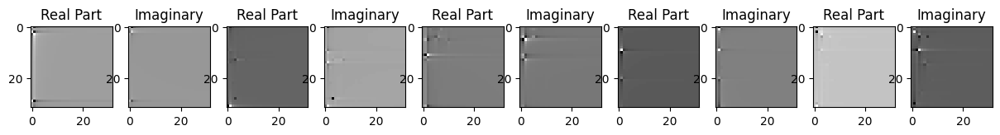

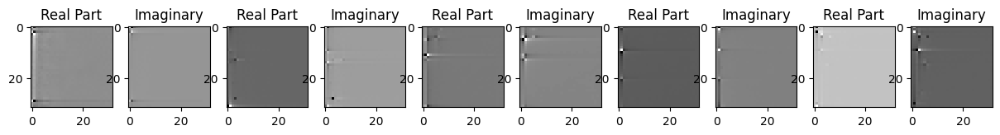

Saving model to: /content/drive/MyDrive/saved_model/_model_248_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.930716635216797
Correlation is  0.7571590542793274
Epoch-250 lr: 0.0008100000000000001
Loss:  3.5740395105676726e-06
torch.Size([5, 2, 32, 32])


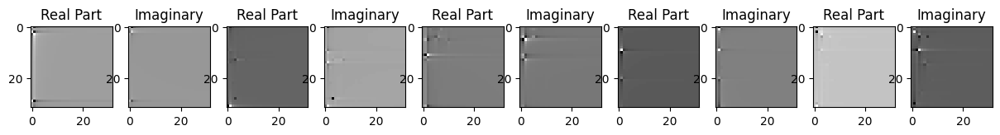

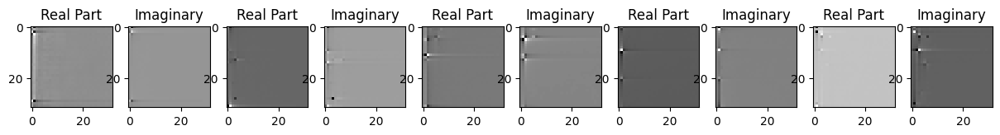

Saving model to: /content/drive/MyDrive/saved_model/_model_249_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.927207591486304
Correlation is  0.7570996284484863
Epoch-251 lr: 0.0008100000000000001
Loss:  3.597490604079212e-06
torch.Size([5, 2, 32, 32])


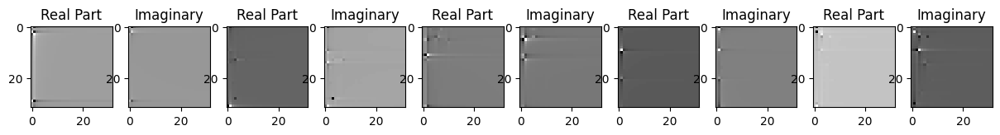

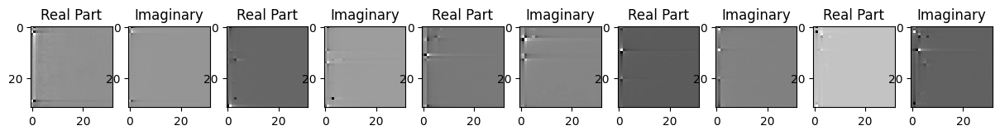

Saving model to: /content/drive/MyDrive/saved_model/_model_250_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.893617046488476
Correlation is  0.7570984363555908
Epoch-252 lr: 0.0008100000000000001
Loss:  3.5688797197508393e-06
torch.Size([5, 2, 32, 32])


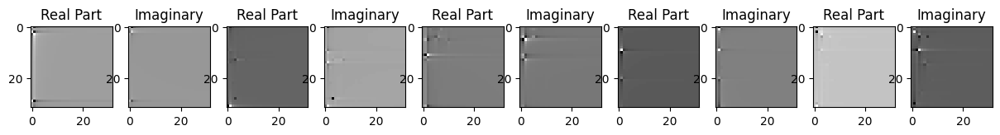

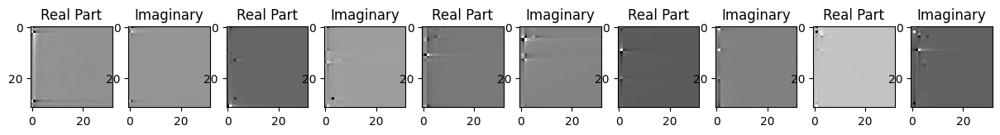

Saving model to: /content/drive/MyDrive/saved_model/_model_251_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.933835325386987
Correlation is  0.7571509480476379
Epoch-253 lr: 0.0008100000000000001
Loss:  3.5681971439771587e-06
torch.Size([5, 2, 32, 32])


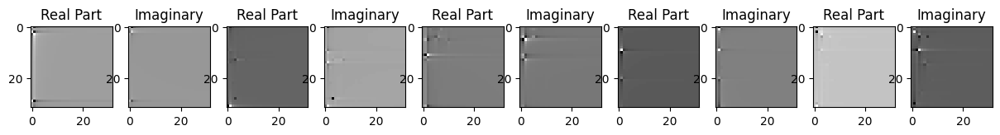

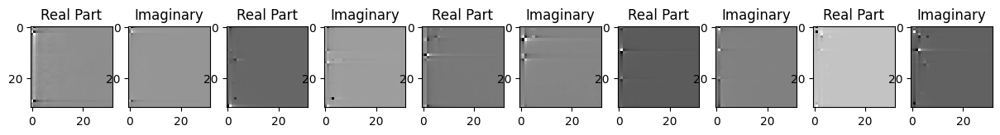

Saving model to: /content/drive/MyDrive/saved_model/_model_252_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.93382780294483
Correlation is  0.7571426033973694
Epoch-254 lr: 0.0008100000000000001
Loss:  3.582554427339346e-06
torch.Size([5, 2, 32, 32])


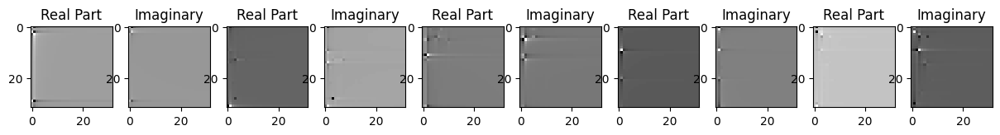

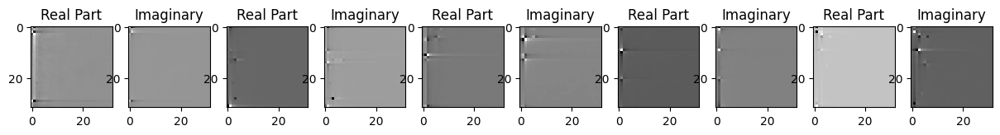

Saving model to: /content/drive/MyDrive/saved_model/_model_253_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.914805664508982
Correlation is  0.7571062445640564
Epoch-255 lr: 0.0008100000000000001
Loss:  3.5816506169794593e-06
torch.Size([5, 2, 32, 32])


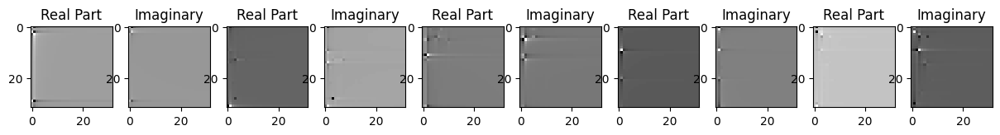

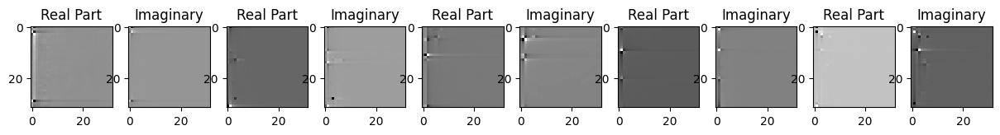

Saving model to: /content/drive/MyDrive/saved_model/_model_254_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.916256384776773
Correlation is  0.757110059261322
Epoch-256 lr: 0.0008100000000000001
Loss:  3.560886625564308e-06
torch.Size([5, 2, 32, 32])


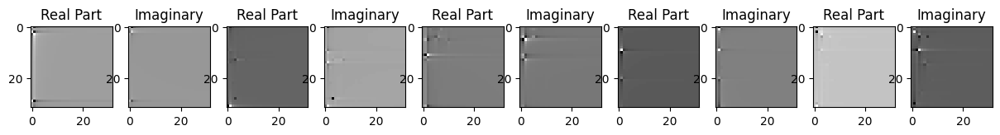

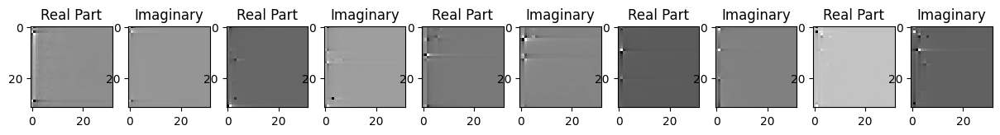

Saving model to: /content/drive/MyDrive/saved_model/_model_255_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.944110598764603
Correlation is  0.7571419477462769
Epoch-257 lr: 0.0008100000000000001
Loss:  3.558873231668258e-06
torch.Size([5, 2, 32, 32])


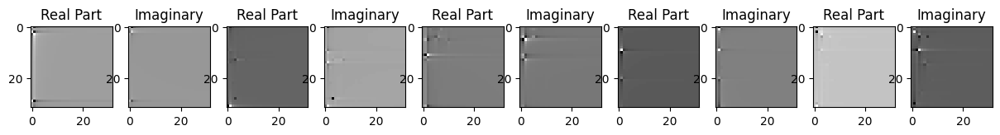

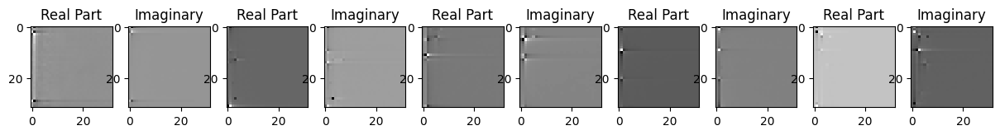

Saving model to: /content/drive/MyDrive/saved_model/_model_256_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.946487438723608
Correlation is  0.7571491003036499
Epoch-258 lr: 0.0008100000000000001
Loss:  3.5479195048537804e-06
torch.Size([5, 2, 32, 32])


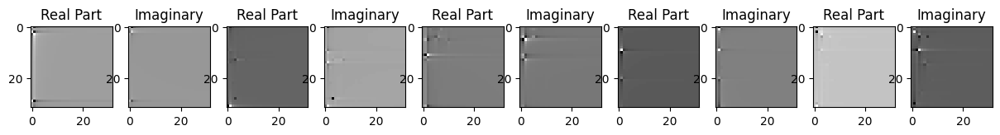

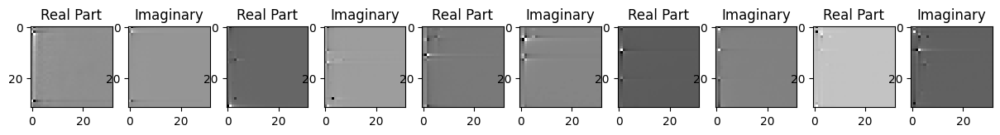

Saving model to: /content/drive/MyDrive/saved_model/_model_257_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.962438387701184
Correlation is  0.7571530342102051
Epoch-259 lr: 0.0008100000000000001
Loss:  3.553400119926664e-06
torch.Size([5, 2, 32, 32])


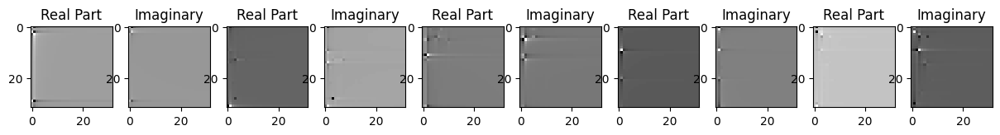

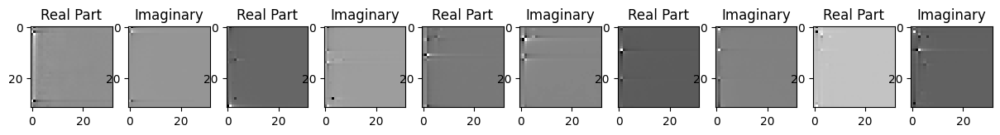

Saving model to: /content/drive/MyDrive/saved_model/_model_258_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.954083740066537
Correlation is  0.7571474313735962
Epoch-260 lr: 0.0008100000000000001
Loss:  3.556391902748146e-06
torch.Size([5, 2, 32, 32])


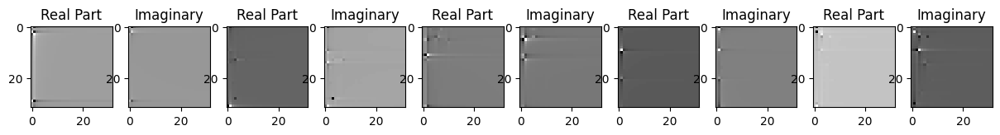

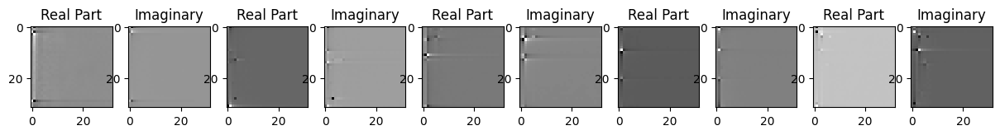

Saving model to: /content/drive/MyDrive/saved_model/_model_259_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.950085593647625
Correlation is  0.7571232318878174
Epoch-261 lr: 0.0008100000000000001
Loss:  3.5553764519136166e-06
torch.Size([5, 2, 32, 32])


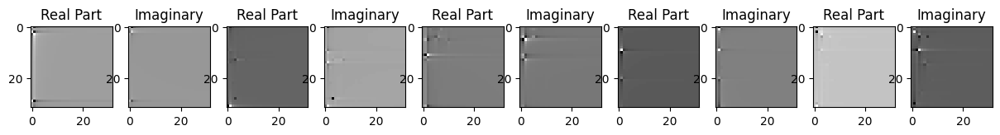

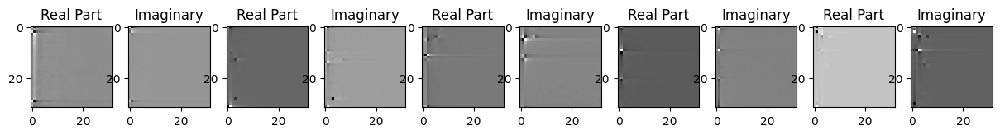

Saving model to: /content/drive/MyDrive/saved_model/_model_260_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.951015933197578
Correlation is  0.7571651339530945
Epoch-262 lr: 0.0008100000000000001
Loss:  3.573708454496227e-06
torch.Size([5, 2, 32, 32])


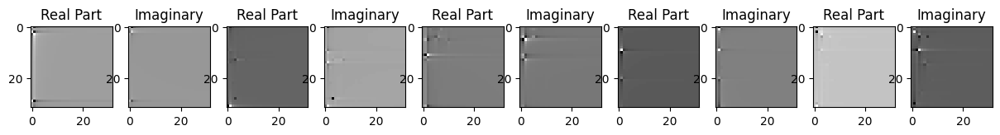

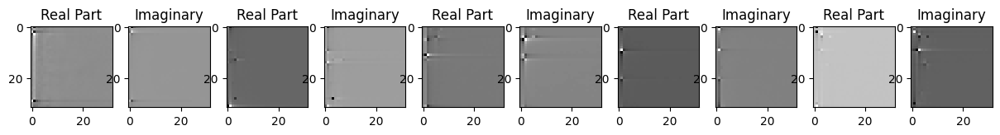

Saving model to: /content/drive/MyDrive/saved_model/_model_261_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.92535627981757
Correlation is  0.7571261525154114
Epoch-263 lr: 0.0008100000000000001
Loss:  3.5883176678908058e-06
torch.Size([5, 2, 32, 32])


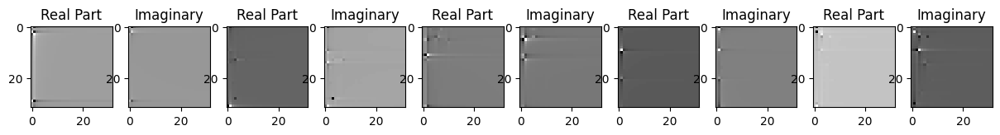

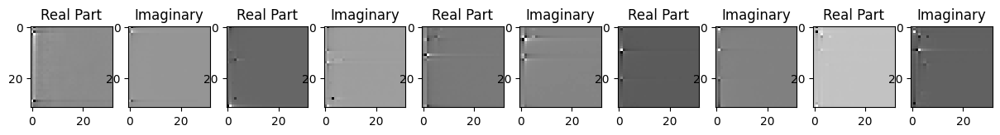

Saving model to: /content/drive/MyDrive/saved_model/_model_262_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.905249521996563
Correlation is  0.757091224193573
Epoch-264 lr: 0.0008100000000000001
Loss:  3.6192934658174636e-06
torch.Size([5, 2, 32, 32])


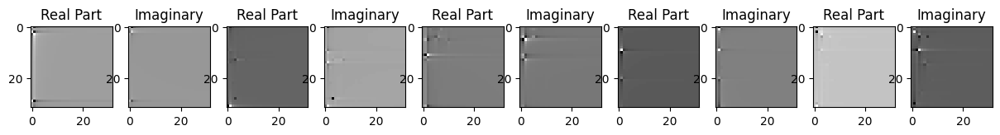

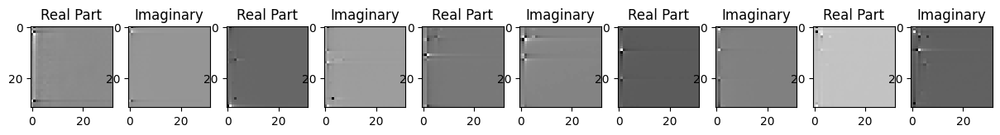

Saving model to: /content/drive/MyDrive/saved_model/_model_263_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.861407191708867
Correlation is  0.7570639252662659
Epoch-265 lr: 0.0008100000000000001
Loss:  3.6232768252375536e-06
torch.Size([5, 2, 32, 32])


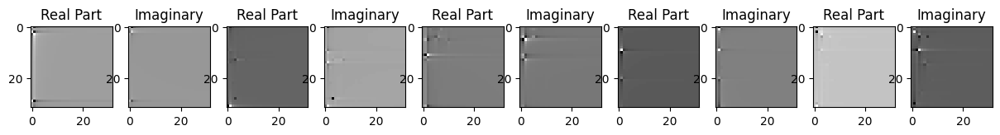

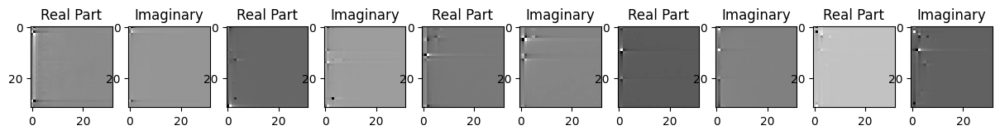

Saving model to: /content/drive/MyDrive/saved_model/_model_264_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.856736611558667
Correlation is  0.7570652961730957
Epoch-266 lr: 0.0008100000000000001
Loss:  3.66636095350259e-06
torch.Size([5, 2, 32, 32])


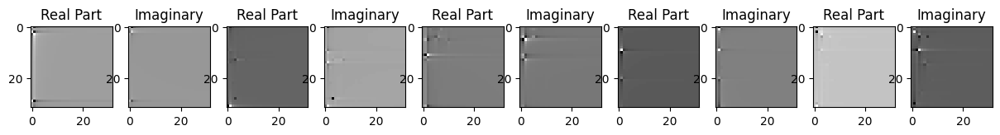

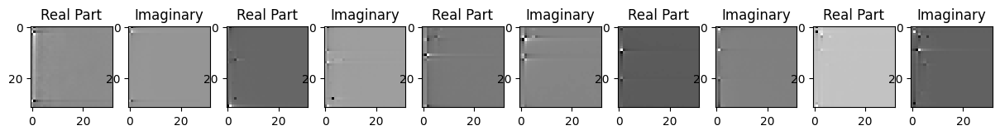

Saving model to: /content/drive/MyDrive/saved_model/_model_265_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.79637411857369
Correlation is  0.757020890712738
Epoch-267 lr: 0.0008100000000000001
Loss:  3.6749036098626675e-06
torch.Size([5, 2, 32, 32])


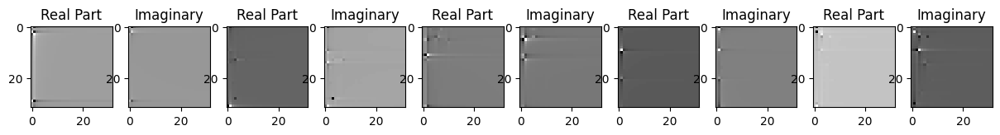

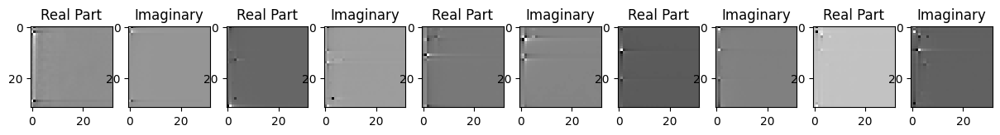

Saving model to: /content/drive/MyDrive/saved_model/_model_266_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.785990824019372
Correlation is  0.7570480704307556
Epoch-268 lr: 0.0008100000000000001
Loss:  3.7702541249018395e-06
torch.Size([5, 2, 32, 32])


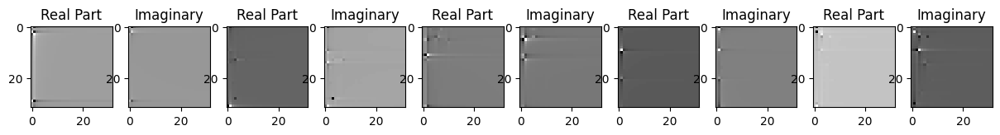

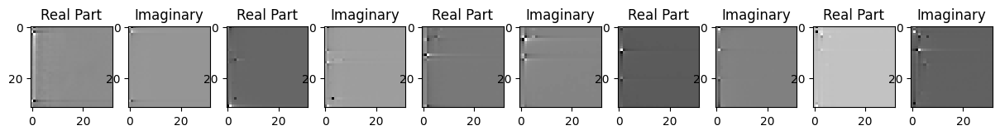

Saving model to: /content/drive/MyDrive/saved_model/_model_267_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.6563079495424
Correlation is  0.7569485306739807
Epoch-269 lr: 0.0008100000000000001
Loss:  3.7129582324268995e-06
torch.Size([5, 2, 32, 32])


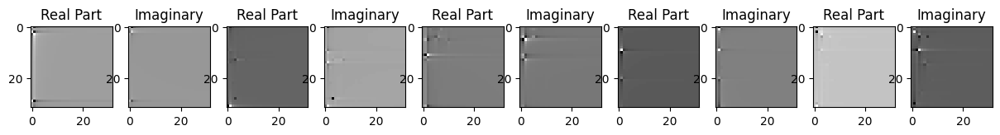

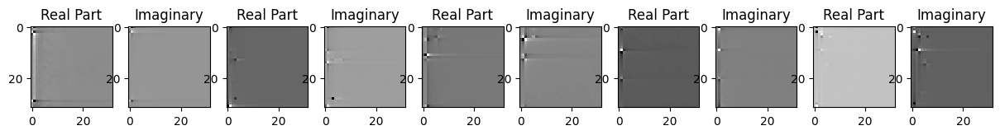

Saving model to: /content/drive/MyDrive/saved_model/_model_268_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.733621138481574
Correlation is  0.757068932056427
Epoch-270 lr: 0.0008100000000000001
Loss:  3.8030752875783946e-06
torch.Size([5, 2, 32, 32])


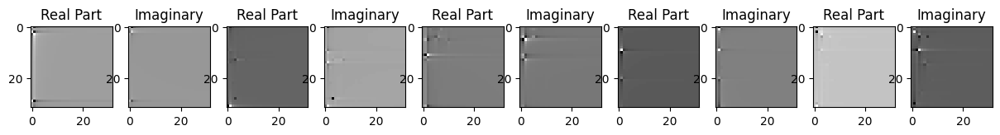

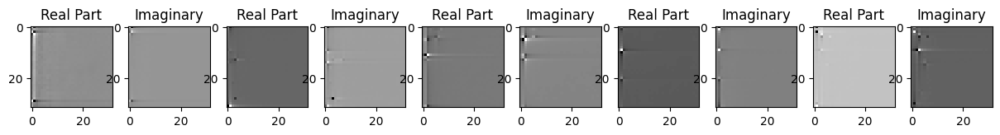

Saving model to: /content/drive/MyDrive/saved_model/_model_269_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.614230580921742
Correlation is  0.7569442987442017
Epoch-271 lr: 0.0008100000000000001
Loss:  3.821566679107491e-06
torch.Size([5, 2, 32, 32])


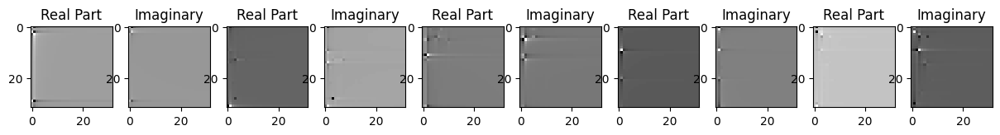

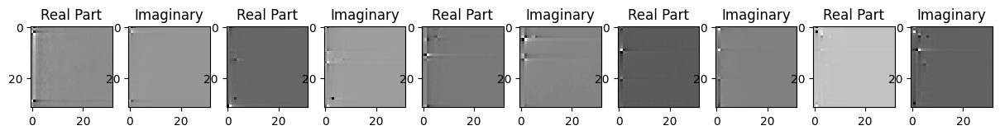

Saving model to: /content/drive/MyDrive/saved_model/_model_270_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.589817312525707
Correlation is  0.7569349408149719
Epoch-272 lr: 0.0008100000000000001
Loss:  3.723317377080093e-06
torch.Size([5, 2, 32, 32])


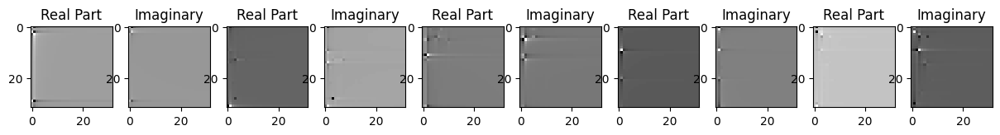

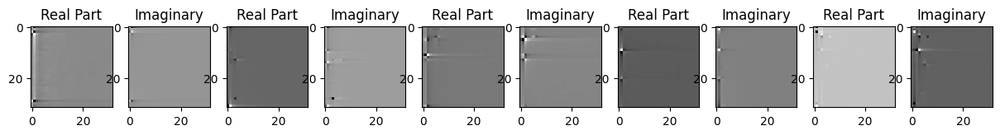

Saving model to: /content/drive/MyDrive/saved_model/_model_271_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.71864252321604
Correlation is  0.7570483088493347
Epoch-273 lr: 0.0008100000000000001
Loss:  3.688637661980465e-06
torch.Size([5, 2, 32, 32])


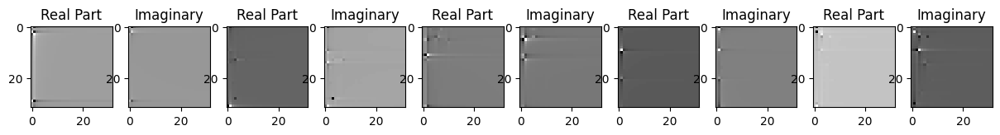

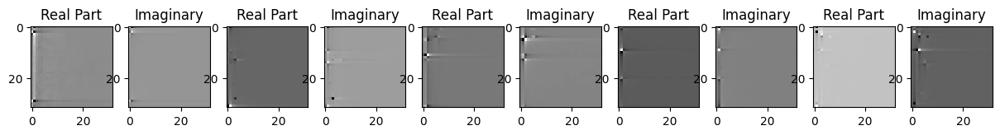

Saving model to: /content/drive/MyDrive/saved_model/_model_272_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.765268504725995
Correlation is  0.7570992112159729
Epoch-274 lr: 0.0008100000000000001
Loss:  3.6103392631048337e-06
torch.Size([5, 2, 32, 32])


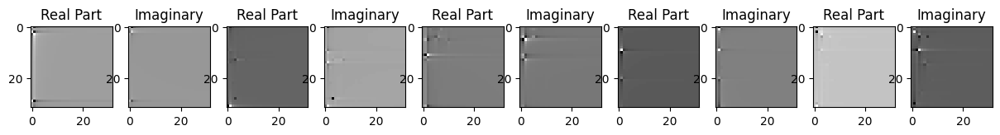

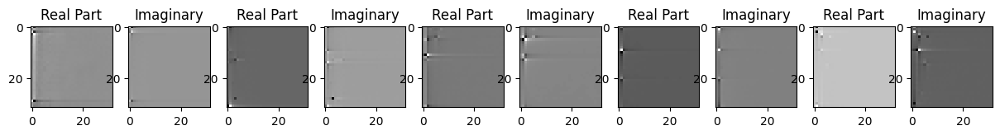

Saving model to: /content/drive/MyDrive/saved_model/_model_273_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.871897442239657
Correlation is  0.7571340799331665
Epoch-275 lr: 0.0008100000000000001
Loss:  3.5278524137538625e-06
torch.Size([5, 2, 32, 32])


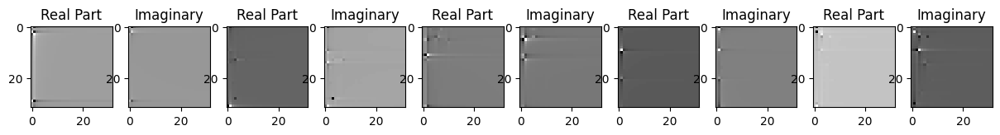

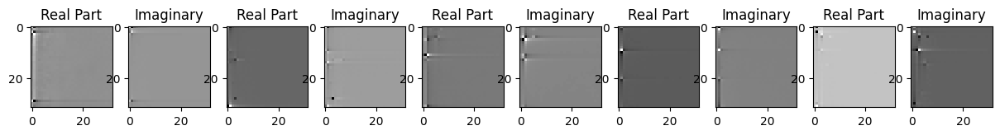

Saving model to: /content/drive/MyDrive/saved_model/_model_274_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.98867016114916
Correlation is  0.7571651935577393
Epoch-276 lr: 0.0008100000000000001
Loss:  3.4571171454444993e-06
torch.Size([5, 2, 32, 32])


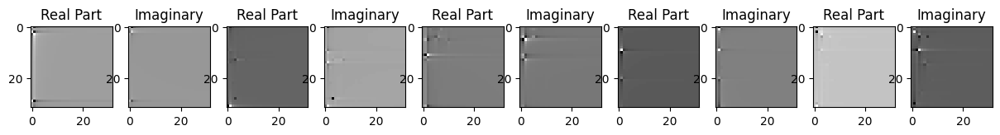

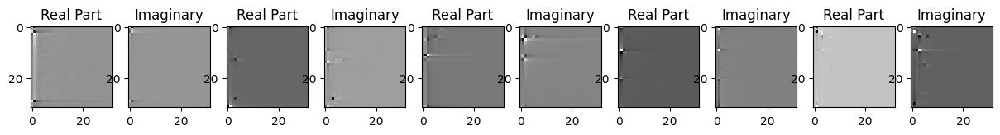

Saving model to: /content/drive/MyDrive/saved_model/_model_275_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -21.08852325987886
Correlation is  0.7571956515312195
Epoch-277 lr: 0.0008100000000000001
Loss:  3.468323257038719e-06
torch.Size([5, 2, 32, 32])


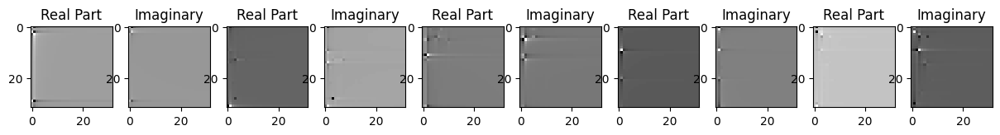

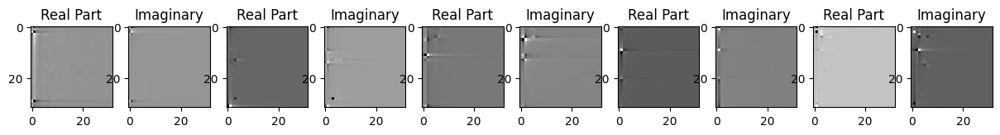

Saving model to: /content/drive/MyDrive/saved_model/_model_276_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -21.072882299809798
Correlation is  0.7571622133255005
Epoch-278 lr: 0.0008100000000000001
Loss:  3.450241365499096e-06
torch.Size([5, 2, 32, 32])


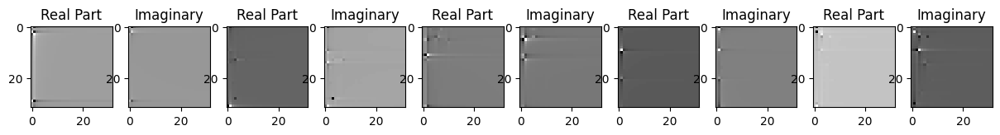

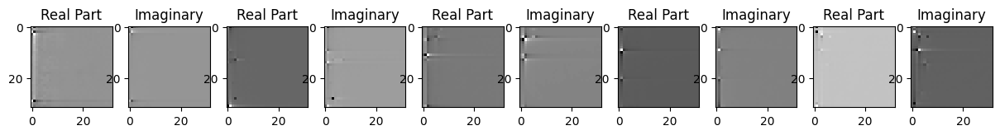

Saving model to: /content/drive/MyDrive/saved_model/_model_277_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -21.098273536805465
Correlation is  0.7571309208869934
Epoch-279 lr: 0.0008100000000000001
Loss:  3.450813892413862e-06
torch.Size([5, 2, 32, 32])


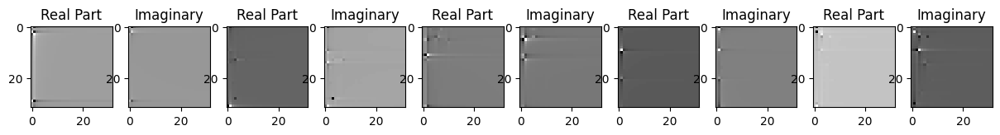

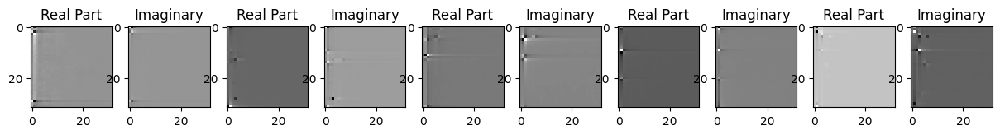

Saving model to: /content/drive/MyDrive/saved_model/_model_278_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -21.097325174416763
Correlation is  0.7571011781692505
Epoch-280 lr: 0.0008100000000000001
Loss:  3.4771899208863033e-06
torch.Size([5, 2, 32, 32])


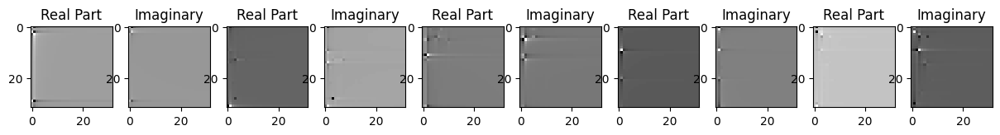

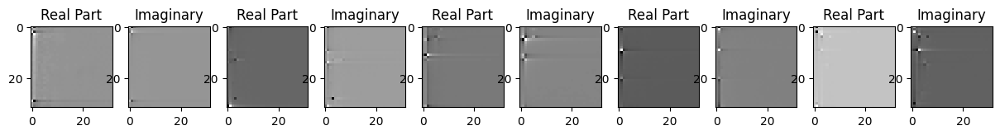

Saving model to: /content/drive/MyDrive/saved_model/_model_279_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -21.05939018104314
Correlation is  0.7570326924324036
Epoch-281 lr: 0.0008100000000000001
Loss:  3.521405915307696e-06
torch.Size([5, 2, 32, 32])


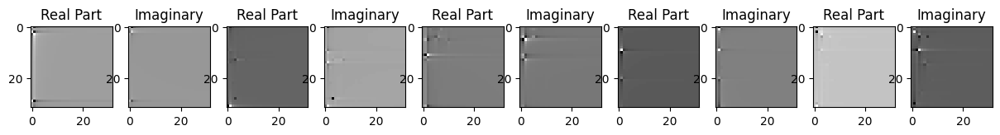

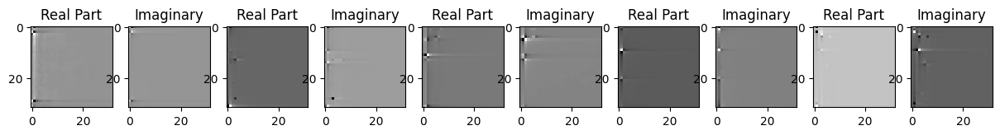

Saving model to: /content/drive/MyDrive/saved_model/_model_280_indoor_512.pth
In indoor environment
When dimension is 512
NMSE is  -20.996938002788195
Correlation is  0.7569685578346252
Epoch-282 lr: 0.0008100000000000001


KeyboardInterrupt: ignored

In [ ]:
#epoch=550
with torch.autograd.set_detect_anomaly(True):
  for epoch in range(n_epochs):
      print('Epoch-{0} lr: {1}'.format(epoch+1, optimizer.param_groups[0]['lr']))
      for i in range(total_batches):
          x_batch = x_train[i*batch_size:(i+1)*batch_size,]
          #print(i*batch_size,(i+1)*batch_size)

          # criterion = nn.MSELoss()
          # model.to(device)
          # optimizer = optim.Adam(model.parameters(), lr=0.001, eps=1e-07)
          # scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=100, gamma=0.9)


          model.train()

          out = model(x_batch)

          loss = criterion(out, x_batch)
          train_loss_history.append(loss.item())
          loss.backward()

          optimizer.step()
          optimizer.zero_grad()

      scheduler.step()

      # Validating
      with torch.no_grad():
          model.eval()

          out = model(x_val)
          loss = criterion(out, x_val)
          print("Loss: ",loss.item())
          val_loss_history.append(loss.item())



      with torch.no_grad():
        input=x_val[0:5,:,:,:]
        print(input.shape)
        model.eval()
        out = model(input)
        CSI_img_ = out.cpu()


        fig, axs = plt.subplots(1, 10, figsize=(15,8))
        for j, l in it.zip_longest(range(0, 5), range(1, 10,2)):
          in_img=input[j,0,:,:].cpu()
          axs[j*2].imshow(np.array(in_img.squeeze(0)), cmap='gist_gray')
          axs[j*2].set_title('Real Part')
          in_img=input[j,1,:,:].cpu()
          axs[l].imshow(np.array(in_img.squeeze(0)), cmap='gist_gray')
          axs[l].set_title('Imaginary')

        fig, axs = plt.subplots(1, 10, figsize=(15,8))
        for i, x in it.zip_longest(range(0, 5), range(1, 10,2)):

          #print(i)
          #CSI_img = random.choice(CSI_img_.cpu())
          img=CSI_img_[i,0,:,:]
          axs[i*2].imshow(np.array(img.squeeze(0)), cmap='gist_gray')
          axs[i*2].set_title('Real Part')
          img=CSI_img_[i,1,:,:]
          axs[x].imshow(np.array(img.squeeze(0)), cmap='gist_gray')
          axs[x].set_title('Imaginary')

        plt.show()


        #if epoch%50==0:
        MODEL_PATH = Path("/content/drive/MyDrive/saved_model")
        MODEL_PATH.mkdir(parents=True, # create parent directories if needed
                        exist_ok=True # if models directory already exists, don't error
        )


        # Create model save path
        MODEL_NAME = "_model_{}_{}_{}.pth".format(epoch,envir,encoded_dim)
        MODEL_SAVE_PATH = MODEL_PATH / MODEL_NAME

        # Save the model state dict
        print(f"Saving model to: {MODEL_SAVE_PATH}")
        torch.save({'epoch': epoch,'model_state_dict': model.state_dict(),'optimizer_state_dict': optimizer.state_dict(),
                    'lr_state_dict': scheduler.state_dict()}, # only saving the state_dict() only saves the learned parameters
                    f=MODEL_SAVE_PATH)

      #if epoch%50==0:
      with torch.no_grad():
        model.eval()
        x_hat = model(x_test)
        x_test = x_test.to(device)
        x_hat=x_hat.to(device)
        X_test = torch.reshape(X_test, (len(X_test), img_height, 125))
        x_test_real = torch.reshape(x_test[:, 0, :, :], (len(x_test), -1))
        x_test_imag = torch.reshape(x_test[:, 1, :, :], (len(x_test), -1))
        x_test_C = x_test_real - 0.5 + 1j * (x_test_imag - 0.5)
        x_hat_real = torch.reshape(x_hat[:, 0, :, :], (len(x_hat), -1))
        x_hat_imag = torch.reshape(x_hat[:, 1, :, :], (len(x_hat), -1))
        x_hat_C = x_hat_real - 0.5 + 1j * (x_hat_imag - 0.5)
        x_hat_F = torch.reshape(x_hat_C, (len(x_hat_C), img_height, img_width))
        X_hat = torch.fft.fft(torch.cat((x_hat_F, torch.zeros((len(x_hat_C), img_height, 257 - img_width)).to(device)), axis=2), axis=2)
        X_hat = X_hat[:, :, 0:125]

        n1 = torch.sqrt(torch.sum(torch.conj(X_test) * X_test, axis=1)).to(device)
        n2 = torch.sqrt(torch.sum(torch.conj(X_hat) * X_hat, axis=1)).to(device)
        aa = abs(torch.sum(torch.conj(X_test.to(device)) * X_hat, axis=1).to(device)).to(device)
        rho = torch.mean(aa / (n1 * n2), axis=1).to(device)
        X_hat = torch.reshape(X_hat, (len(X_hat), -1))
        X_test = torch.reshape(X_test, (len(X_test), -1))
        power = torch.sum(abs(x_test_C) ** 2, axis=1).to(device)
        power_d = torch.sum(abs(X_hat) ** 2, axis=1).to(device)
        mse = torch.sum(abs(x_test_C - x_hat_C) ** 2, axis=1).to(device)
        NMSE = 10 * math.log10(torch.mean(mse / power))
        Correlation = torch.mean(rho).item().real

        print("In " + envir + " environment")
        print("When dimension is", encoded_dim)
        print("NMSE is ", NMSE)
        print("Correlation is ", Correlation)






tEnd = time.time()
training_time = tEnd - tStart
print("It cost %f sec for training." % training_time)